In [2]:
import json
import numpy as np
import pandas as pd
from pathlib import Path
import os
import sys
import warnings
from utils import *
import matplotlib.pyplot as plt
import seaborn as sns

warnings.simplefilter('ignore')

sys.path.append('../../utilities')
sys.path.append('../../models/grt123')
sys.path.append('../../models/grt123/training')
sys.path.append('../../models/grt123/preprocessing/')

# from layers import nms,iou
from summit_utils import SummitScan, xyz2irc
from evaluation import noduleCADEvaluation

workspace_path = Path(os.getcwd()).parent.parent


In [3]:
flavour = 'balanced_female_for_inference'

# Scan Metadata

In [3]:

def set_is_actionable(row):
    if row['radiology_report_management_plan_final'] in ['3_MONTH_FOLLOW_UP_SCAN','URGENT_REFERRAL', 'ALWAYS_SCAN_AT_YEAR_1']:
        return 'Actonable'
    else:
        return 'Non-Actionable'

def set_smoking_pack_years_cats(df):
    df[df['smoking_pack_years'] < 0] = np.nan
    return pd.qcut(df['smoking_pack_years'], 3, labels=['Low (15-35)', 'Medium (35-50)', 'High (50+)'])

person_data = pd.read_csv(
    f'{workspace_path}/data/summit/data/person_data.csv',
    usecols=['LDCT_RADIOLOGY_REPORT_main_participant_id', 'lung_health_check_clinical_smoking_pack_years', 'ocd_DeprivationScore_IMDRank']
).rename(columns={
    'lung_health_check_clinical_smoking_pack_years':'smoking_pack_years',
    'ocd_DeprivationScore_IMDRank':'deprivation_score'
}).assign(
    smoking_pack_years_cats=lambda df: set_smoking_pack_years_cats(df),
    IMDRank_tertile=lambda df: pd.qcut(df['deprivation_score'], 3, labels=['Low', 'Medium', 'High']),
    IMDRank_quintile=lambda df: pd.qcut(df['deprivation_score'], 5, labels=['Low', 'Low-Medium', 'Medium', 'Medium-High', 'High']),
)
                          
scan_metadata = (
    pd.read_csv(f'{workspace_path}/metadata/summit/{flavour}/test_scans_metadata.csv')
    .assign(name=lambda df: df['LDCT_RADIOLOGY_REPORT_main_participant_id'] + '_Y0_BASELINE_A')
    .assign(is_actionable=lambda df: df.apply(set_is_actionable, axis=1))
    .assign(gender_is_actionable=lambda df: df.apply(set_gender_is_actionable, axis=1))    
    .assign(gender_is_not_actionable=lambda df: df.apply(set_gender_is_not_actionable, axis=1))    
    .assign(ethnic_group_is_actionable=lambda df: df.apply(set_ethnic_group_is_actionable, axis=1))    
    .assign(ethnic_group_is_not_actionable=lambda df: df.apply(set_ethnic_group_is_not_actionable, axis=1))    
    .rename(columns={
        'participant_details_gender':'gender',
        'lung_health_check_demographics_race_ethnicgroup':'ethnic_group'
    })
).merge(person_data, on='LDCT_RADIOLOGY_REPORT_main_participant_id')
scan_metadata = (
    scan_metadata
    .assign(smoking_pack_years_is_actionable=lambda df: df.apply(set_smoking_pack_years_is_actionable, axis=1))
    .assign(imdrank_is_actionable=lambda df: df.apply(set_imdrank_is_actionable, axis=1))    
)

In [4]:

for col in scan_metadata.columns:
    if col.lower().find('age')>-1:
        print(col)

radiology_report_management_plan_algorithm_recommendation
radiology_report_management_plan_final
radiology_report_management_plan_recommendation_comment
participant_details_age
lung_health_check_smoking_cigarillos_start_age
lung_health_check_smoking_cigarillos_stop_age
lung_health_check_smoking_cigars_start_age
lung_health_check_smoking_cigars_stop_age
lung_health_check_smoking_history_age_started_smoking
lung_health_check_smoking_history_age_stopped_smoking
lung_health_check_smoking_marijuana_start_age
lung_health_check_smoking_marijuana_stop_age
lung_health_check_smoking_pipe_start_age
lung_health_check_smoking_pipe_stop_age
lung_health_check_smoking_waterpipe_start_age
lung_health_check_smoking_waterpipe_stop_age
participant_age_at_consent
participant_age_at_consent_cats


## GRT123

NOT-UPPER       72
UPPER           68
NOT_ANSWERED    40
Name: nodule_site_combined, dtype: int64

/Users/john/Projects/SOTAEvaluationNoduleDetection/models/grt123/bbox_result/trained_summit/summit/balanced_female_for_inference/balanced_female_for_inference_metadata.csv
Total number of included nodule annotations: 180
Total number of nodule annotations: 180
Cases: 172


100%|██████████| 1000/1000 [00:07<00:00, 137.39it/s]


,0,159,476,1111,2381,4920,9999
0,0.136 (0.071 - 0.219),0.209 (0.14 - 0.29),0.311 (0.228 - 0.39),0.415 (0.321 - 0.508),0.587 (0.506 - 0.664),0.656 (0.581 - 0.734),0.744 (0.672 - 0.816)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.136,0.071,0.219
159,0.250,0.209,0.140,0.290
476,0.500,0.311,0.228,0.390
1111,1.000,0.415,0.321,0.508
2381,2.000,0.587,0.506,0.664
4920,4.000,0.656,0.581,0.734
9999,8.000,0.744,0.672,0.816


Mean Sensitivity: 0.44 Low Sensitivity: 0.36 High Sensitivity: 0.517


,True positives,146
0,False positives,7705.000
1,False negatives,34.000
2,True negatives,0.000
3,Total number of candidates,7852.000
4,Total number of nodules,180.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,1.000
7,Sensitivity,0.811
8,Average number of candidates per scan,45.651


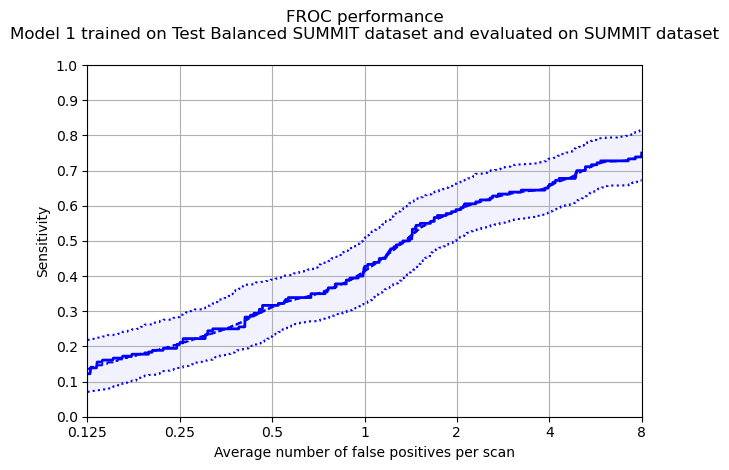

In [5]:
# Add in diameter cuts for later analysis
def combine_site(nodule_site):
    if nodule_site.find('UPPER') > -1:
        return 'UPPER'
    elif nodule_site.find('NOT') > -1:
        return 'NOT_ANSWERED'
    else:
        return 'NOT-UPPER'
    
def combine_site2(nodule_site):
    if nodule_site.find('RIGHT') > -1:
        return 'RIGHT'
    elif nodule_site.find('LEFT') > -1:
        return 'LEFT'
    else:
        return 'NOT_ANSWERED'

diameter_cats = [0, 4, 8, 15, 20, 30, 40, 999]
diameter_lbs = [f'{diameter_cats[i]:02}-{diameter_cats[i+1]:02}' for i in range(len(diameter_cats))[:-1]]

annotations = (
    pd.read_csv(f'{workspace_path}/models/grt123/bbox_result/trained_summit/summit/{flavour}/{flavour}_metadata.csv')
    .assign(diameter_cats=lambda df: 
        pd.cut(
            df['nodule_diameter_mm'], 
            bins=diameter_cats,
            labels=diameter_lbs
        )            
    )
    .assign(nodule_site_combined=lambda df: df['nodule_site'].apply(combine_site))
    .assign(nodule_site_combined2=lambda df: df['nodule_site'].apply(combine_site2))
)

display(annotations.nodule_site_combined.value_counts())

# save back to the metadata file
annotations.to_csv(f'{workspace_path}/models/grt123/bbox_result/trained_summit/summit/{flavour}/{flavour}_metadata.csv', index=False)
grt123_summit_summit = noduleCADEvaluation(
    annotations_filename=f'{workspace_path}/models/grt123/bbox_result/trained_summit/summit/{flavour}/{flavour}_metadata.csv',
    annotations_excluded_filename=f'{workspace_path}/data/summit/metadata/grt123_annotations_excluded_empty.csv',
    seriesuids_filename=f'{workspace_path}/metadata/summit/{flavour}/test_scans.csv',
    results_filename=f"{workspace_path}/models/grt123/bbox_result/trained_summit/summit/{flavour}/{flavour}_predictions.csv",    
    filter='\nModel 1 trained on Test Balanced SUMMIT dataset and evaluated on SUMMIT dataset\n',
    outputDir=f'{workspace_path}/results/grt123/trained_summit/summit/{flavour}',
)
caluclate_cpm_from_bootstrapping(f'{workspace_path}/results/grt123/trained_summit/summit/{flavour}/froc_{flavour}_predictions_bootstrapping.csv')
show_metrics(f'{workspace_path}/results/grt123/trained_summit/summit/{flavour}/CADAnalysis.txt')

### Gender analysis

Protected Group: FEMALE


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,24.0,52.0,6.0,11.0,8.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpqlu8p073/annotations.csv
Total number of included nodule annotations: 179
Total number of nodule annotations: 179
Cases: 170


100%|██████████| 1000/1000 [00:07<00:00, 138.06it/s]


,0,159,476,1111,2381,4920,9999
0,0.141 (0.074 - 0.211),0.21 (0.142 - 0.284),0.314 (0.232 - 0.391),0.418 (0.325 - 0.51),0.586 (0.503 - 0.668),0.656 (0.576 - 0.731),0.742 (0.669 - 0.814)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.141,0.074,0.211
159,0.250,0.210,0.142,0.284
476,0.500,0.314,0.232,0.391
1111,1.000,0.418,0.325,0.510
2381,2.000,0.586,0.503,0.668
4920,4.000,0.656,0.576,0.731
9999,8.000,0.742,0.669,0.814


Mean Sensitivity: 0.44 Low Sensitivity: 0.36 High Sensitivity: 0.516


,True positives,145
0,False positives,7633.000
1,False negatives,34.000
2,True negatives,0.000
3,Total number of candidates,7779.000
4,Total number of nodules,179.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,1.000
7,Sensitivity,0.810
8,Average number of candidates per scan,45.759


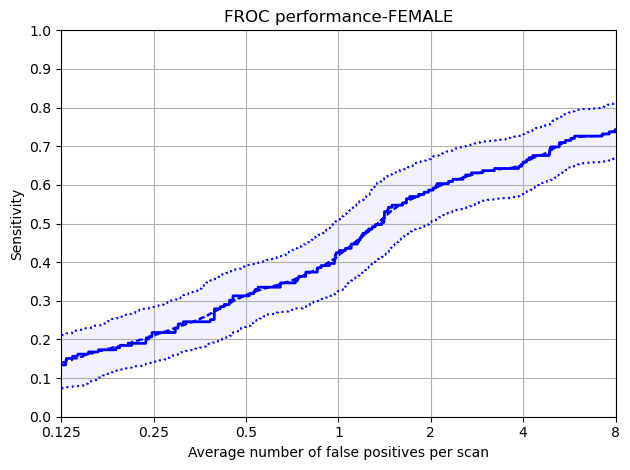

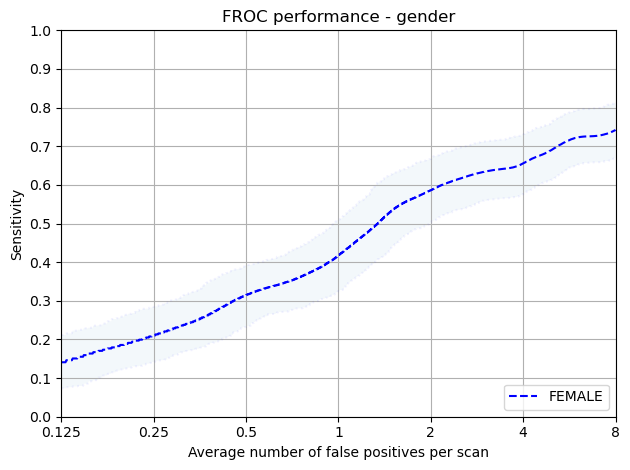

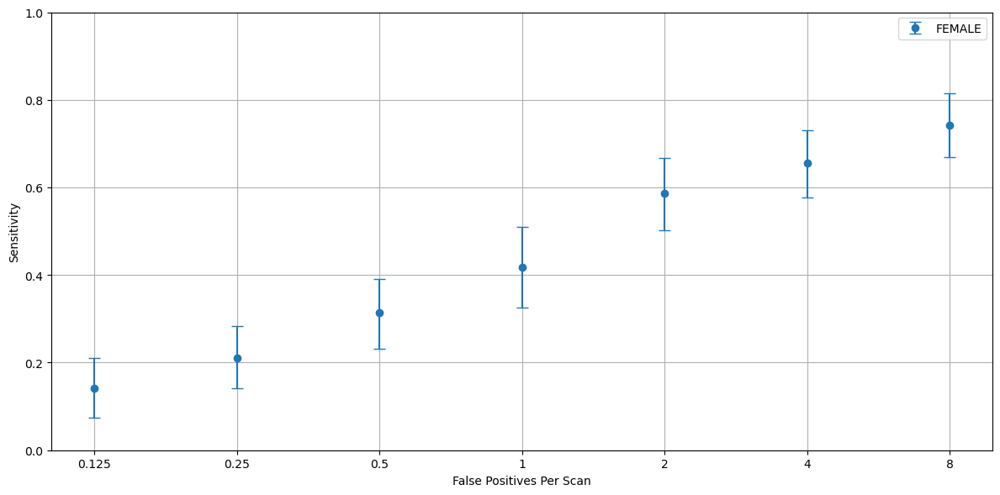

In [6]:

annotations_excluded = pd.read_csv(f'{workspace_path}/data/summit/metadata/grt123_annotations_excluded_empty.csv')

annotations = pd.read_csv(f'{workspace_path}/models/grt123/bbox_result/trained_summit/summit/{flavour}/{flavour}_metadata.csv')

predictions = pd.read_csv(f'{workspace_path}/models/grt123/bbox_result/trained_summit/summit/{flavour}/{flavour}_predictions.csv')

protected_group = 'gender'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/grt123/trained_summit/summit/{flavour}/{protected_group}'
)
display_plots_with_error_bars('grt123', flavour, 'Gender', data_dict)

### Age Analysis

Protected Group: 60-64


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,15.0,51.0,12.0,10.0,12.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmphiif2f6d/annotations.csv
Total number of included nodule annotations: 41
Total number of nodule annotations: 41
Cases: 40


100%|██████████| 1000/1000 [00:01<00:00, 510.95it/s]


,0,159,476,1111,2381,4920,9999
0,0.064 (0.0 - 0.149),0.091 (0.0 - 0.229),0.193 (0.03 - 0.385),0.389 (0.216 - 0.583),0.49 (0.341 - 0.656),0.563 (0.421 - 0.732),0.69 (0.531 - 0.848)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.064,0.000,0.149
159,0.250,0.091,0.000,0.229
476,0.500,0.193,0.030,0.385
1111,1.000,0.389,0.216,0.583
2381,2.000,0.490,0.341,0.656
4920,4.000,0.563,0.421,0.732
9999,8.000,0.690,0.531,0.848


Mean Sensitivity: 0.35 Low Sensitivity: 0.22 High Sensitivity: 0.512


,True positives,32
0,False positives,1773.000
1,False negatives,9.000
2,True negatives,0.000
3,Total number of candidates,1805.000
4,Total number of nodules,41.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,0.000
7,Sensitivity,0.780
8,Average number of candidates per scan,45.125


Protected Group: 75+


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,17.0,8.0,25.0,42.0,8.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpv7opy9im/annotations.csv
Total number of included nodule annotations: 12
Total number of nodule annotations: 12
Cases: 7


100%|██████████| 1000/1000 [00:00<00:00, 1409.08it/s]


,0,159,476,1111,2381,4920,9999
0,0.26 (0.0 - 0.571),0.272 (0.0 - 0.6),0.324 (0.0 - 0.765),0.408 (0.0 - 0.8),0.512 (0.2 - 0.833),0.56 (0.2 - 0.917),0.639 (0.286 - 0.944)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.260,0.000,0.571
159,0.250,0.272,0.000,0.600
476,0.500,0.324,0.000,0.765
1111,1.000,0.408,0.000,0.800
2381,2.000,0.512,0.200,0.833
4920,4.000,0.560,0.200,0.917
9999,8.000,0.639,0.286,0.944


Mean Sensitivity: 0.43 Low Sensitivity: 0.1 High Sensitivity: 0.776


,True positives,9
0,False positives,265.000
1,False negatives,3.000
2,True negatives,0.000
3,Total number of candidates,274.000
4,Total number of nodules,12.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,0.000
7,Sensitivity,0.750
8,Average number of candidates per scan,39.143


Protected Group: 55-59


,SOLID,PERIFISSURAL,NON_SOLID,CALCIFIED
nodule_type,21.0,72.0,5.0,3.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp1aebb2n9/annotations.csv
Total number of included nodule annotations: 39
Total number of nodule annotations: 39
Cases: 56


100%|██████████| 1000/1000 [00:02<00:00, 403.28it/s]


,0,159,476,1111,2381,4920,9999
0,0.224 (0.048 - 0.413),0.323 (0.121 - 0.5),0.418 (0.226 - 0.606),0.576 (0.375 - 0.757),0.686 (0.515 - 0.848),0.75 (0.576 - 0.902),0.827 (0.667 - 0.966)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.224,0.048,0.413
159,0.250,0.323,0.121,0.500
476,0.500,0.418,0.226,0.606
1111,1.000,0.576,0.375,0.757
2381,2.000,0.686,0.515,0.848
4920,4.000,0.750,0.576,0.902
9999,8.000,0.827,0.667,0.966


Mean Sensitivity: 0.54 Low Sensitivity: 0.36 High Sensitivity: 0.713


,True positives,35
0,False positives,2384.000
1,False negatives,4.000
2,True negatives,0.000
3,Total number of candidates,2420.000
4,Total number of nodules,39.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,1.000
7,Sensitivity,0.897
8,Average number of candidates per scan,43.214


Protected Group: 70-75


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,34.0,46.0,3.0,14.0,3.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpeaovgh29/annotations.csv
Total number of included nodule annotations: 35
Total number of nodule annotations: 35
Cases: 33


100%|██████████| 1000/1000 [00:01<00:00, 549.39it/s]


,0,159,476,1111,2381,4920,9999
0,0.144 (0.028 - 0.31),0.222 (0.08 - 0.394),0.311 (0.171 - 0.48),0.349 (0.2 - 0.529),0.549 (0.367 - 0.744),0.627 (0.459 - 0.786),0.687 (0.552 - 0.844)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.144,0.028,0.310
159,0.250,0.222,0.080,0.394
476,0.500,0.311,0.171,0.480
1111,1.000,0.349,0.200,0.529
2381,2.000,0.549,0.367,0.744
4920,4.000,0.627,0.459,0.786
9999,8.000,0.687,0.552,0.844


Mean Sensitivity: 0.41 Low Sensitivity: 0.27 High Sensitivity: 0.584


,True positives,26
0,False positives,1545.000
1,False negatives,9.000
2,True negatives,0.000
3,Total number of candidates,1571.000
4,Total number of nodules,35.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,0.000
7,Sensitivity,0.743
8,Average number of candidates per scan,47.606


Protected Group: 65-69


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,29.0,52.0,2.0,6.0,12.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp4zz1dwbj/annotations.csv
Total number of included nodule annotations: 52
Total number of nodule annotations: 52
Cases: 38


100%|██████████| 1000/1000 [00:01<00:00, 522.42it/s]


,0,159,476,1111,2381,4920,9999
0,0.193 (0.07 - 0.364),0.29 (0.148 - 0.426),0.33 (0.222 - 0.46),0.437 (0.279 - 0.615),0.6 (0.426 - 0.767),0.719 (0.58 - 0.833),0.8 (0.694 - 0.905)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.193,0.070,0.364
159,0.250,0.290,0.148,0.426
476,0.500,0.330,0.222,0.460
1111,1.000,0.437,0.279,0.615
2381,2.000,0.600,0.426,0.767
4920,4.000,0.719,0.580,0.833
9999,8.000,0.800,0.694,0.905


Mean Sensitivity: 0.48 Low Sensitivity: 0.35 High Sensitivity: 0.624


,True positives,43
0,False positives,1666.000
1,False negatives,9.000
2,True negatives,0.000
3,Total number of candidates,1709.000
4,Total number of nodules,52.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,0.000
7,Sensitivity,0.827
8,Average number of candidates per scan,44.974


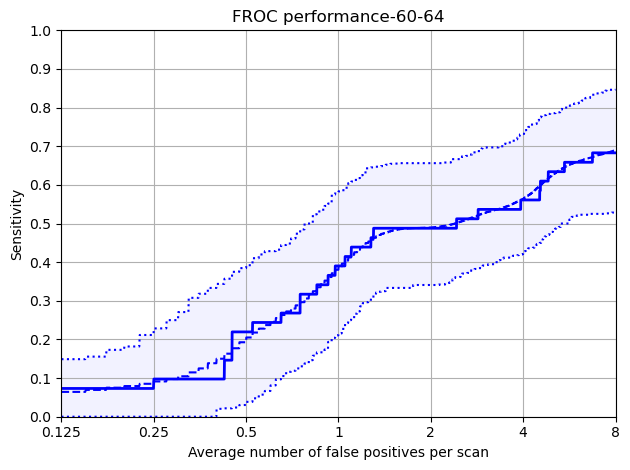

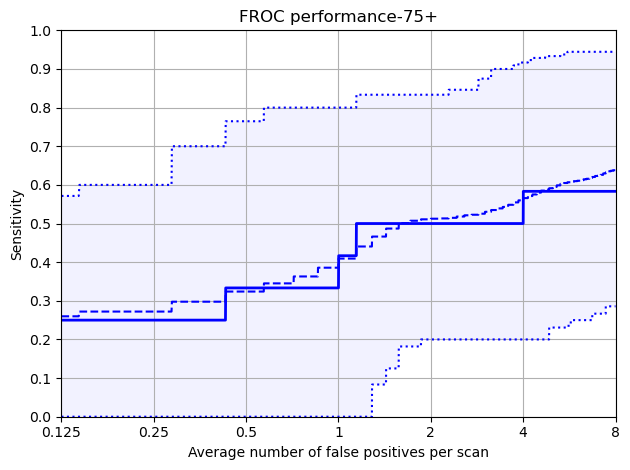

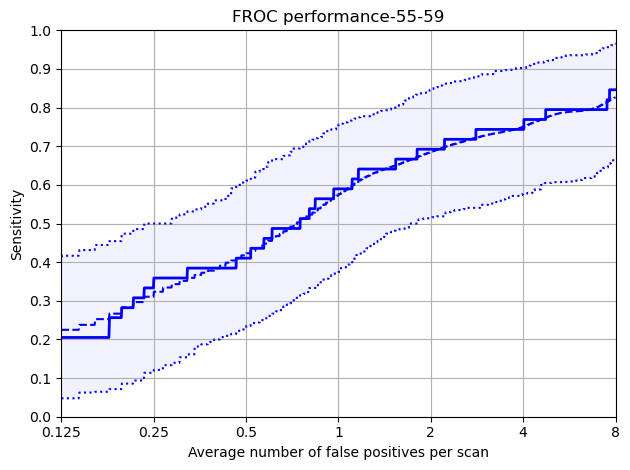

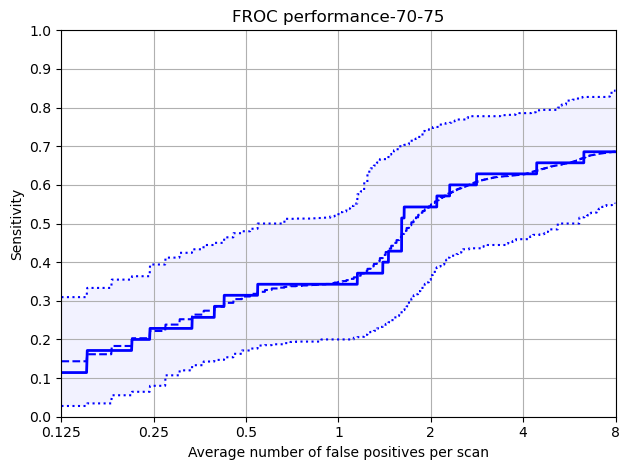

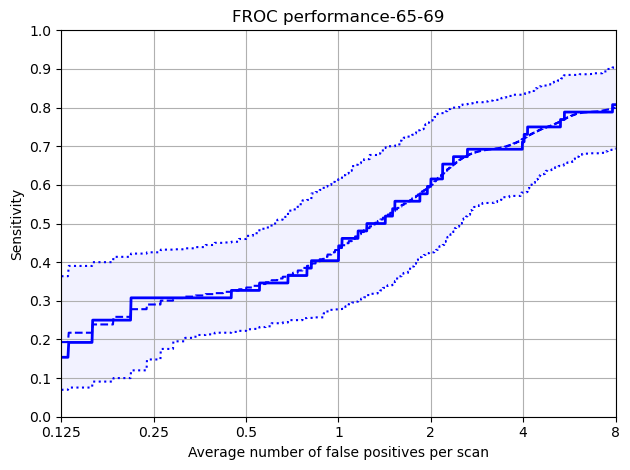

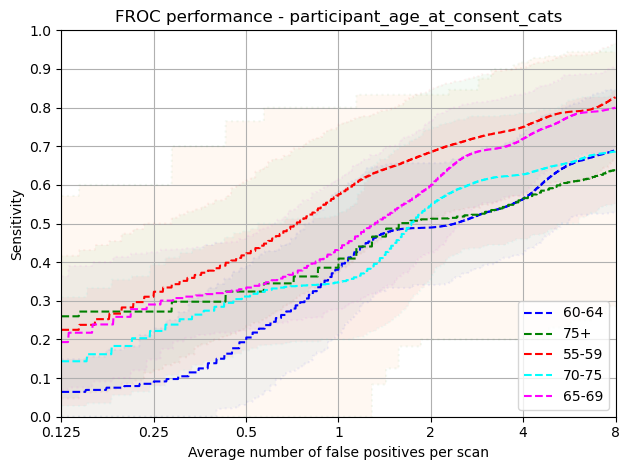

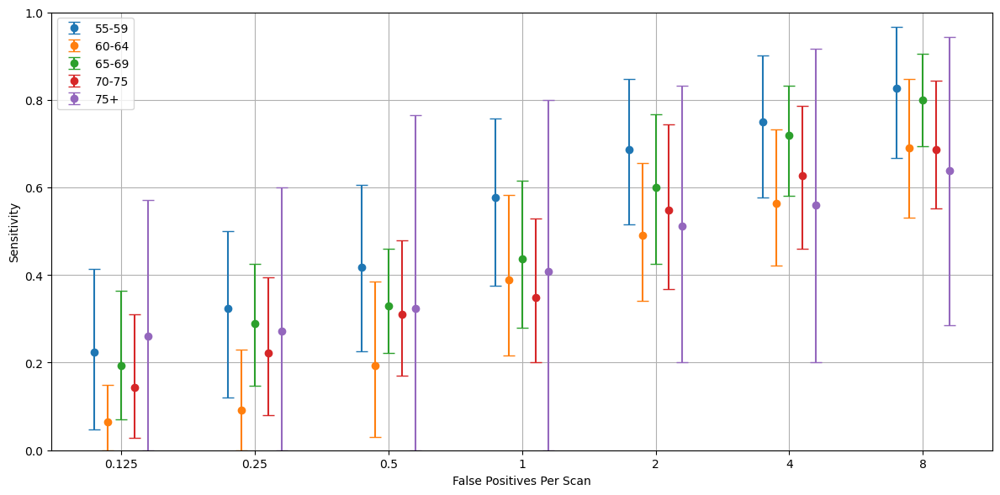

In [7]:
protected_group = 'participant_age_at_consent_cats'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/grt123/trained_summit/summit/{flavour}/{protected_group}'
)
display_plots_with_error_bars('grt123', flavour, 'Age', data_dict, ['55-59','60-64','65-69','70-75','75+'])

In [8]:
data_dict

{'60-64':        mean_sens  low_sens  high_sens
 fps                                  
 0.125      0.064     0.000      0.149
 0.250      0.091     0.000      0.229
 0.500      0.193     0.030      0.385
 1.000      0.389     0.216      0.583
 2.000      0.490     0.341      0.656
 4.000      0.563     0.421      0.732
 8.000      0.690     0.531      0.848,
 '75+':        mean_sens  low_sens  high_sens
 fps                                  
 0.125      0.260     0.000      0.571
 0.250      0.272     0.000      0.600
 0.500      0.324     0.000      0.765
 1.000      0.408     0.000      0.800
 2.000      0.512     0.200      0.833
 4.000      0.560     0.200      0.917
 8.000      0.639     0.286      0.944,
 '55-59':        mean_sens  low_sens  high_sens
 fps                                  
 0.125      0.224     0.048      0.413
 0.250      0.323     0.121      0.500
 0.500      0.418     0.226      0.606
 1.000      0.576     0.375      0.757
 2.000      0.686     0.515      0.84

### Ethnicity analysis

Protected Group: Black


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,23.0,64.0,5.0,2.0,7.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmputetln7d/annotations.csv
Total number of included nodule annotations: 44
Total number of nodule annotations: 44
Cases: 56


100%|██████████| 1000/1000 [00:02<00:00, 418.01it/s]


,0,159,476,1111,2381,4920,9999
0,0.165 (0.022 - 0.366),0.311 (0.169 - 0.5),0.451 (0.293 - 0.643),0.648 (0.463 - 0.826),0.727 (0.579 - 0.857),0.787 (0.654 - 0.895),0.816 (0.692 - 0.923)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.165,0.022,0.366
159,0.250,0.311,0.169,0.500
476,0.500,0.451,0.293,0.643
1111,1.000,0.648,0.463,0.826
2381,2.000,0.727,0.579,0.857
4920,4.000,0.787,0.654,0.895
9999,8.000,0.816,0.692,0.923


Mean Sensitivity: 0.56 Low Sensitivity: 0.41 High Sensitivity: 0.716


,True positives,37
0,False positives,2342.000
1,False negatives,7.000
2,True negatives,0.000
3,Total number of candidates,2379.000
4,Total number of nodules,44.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,0.000
7,Sensitivity,0.841
8,Average number of candidates per scan,42.482


Protected Group: White


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,26.0,47.0,6.0,12.0,9.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmptwfoyflz/annotations.csv
Total number of included nodule annotations: 78
Total number of nodule annotations: 78
Cases: 58


100%|██████████| 1000/1000 [00:02<00:00, 348.77it/s]


,0,159,476,1111,2381,4920,9999
0,0.175 (0.072 - 0.296),0.242 (0.115 - 0.363),0.323 (0.183 - 0.452),0.405 (0.274 - 0.544),0.552 (0.42 - 0.691),0.657 (0.532 - 0.791),0.743 (0.629 - 0.847)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.175,0.072,0.296
159,0.250,0.242,0.115,0.363
476,0.500,0.323,0.183,0.452
1111,1.000,0.405,0.274,0.544
2381,2.000,0.552,0.420,0.691
4920,4.000,0.657,0.532,0.791
9999,8.000,0.743,0.629,0.847


Mean Sensitivity: 0.44 Low Sensitivity: 0.32 High Sensitivity: 0.569


,True positives,64
0,False positives,2868.000
1,False negatives,14.000
2,True negatives,0.000
3,Total number of candidates,2933.000
4,Total number of nodules,78.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,1.000
7,Sensitivity,0.821
8,Average number of candidates per scan,50.569


Protected Group: Asian or Asian British


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,23.0,49.0,5.0,16.0,7.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpmgsrqrxo/annotations.csv
Total number of included nodule annotations: 57
Total number of nodule annotations: 57
Cases: 58


100%|██████████| 1000/1000 [00:02<00:00, 395.49it/s]


,0,159,476,1111,2381,4920,9999
0,0.125 (0.024 - 0.239),0.158 (0.058 - 0.269),0.2 (0.085 - 0.322),0.275 (0.145 - 0.419),0.49 (0.369 - 0.634),0.561 (0.432 - 0.695),0.706 (0.573 - 0.836)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.125,0.024,0.239
159,0.250,0.158,0.058,0.269
476,0.500,0.200,0.085,0.322
1111,1.000,0.275,0.145,0.419
2381,2.000,0.490,0.369,0.634
4920,4.000,0.561,0.432,0.695
9999,8.000,0.706,0.573,0.836


Mean Sensitivity: 0.36 Low Sensitivity: 0.24 High Sensitivity: 0.488


,True positives,44
0,False positives,2423.000
1,False negatives,13.000
2,True negatives,0.000
3,Total number of candidates,2467.000
4,Total number of nodules,57.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,0.000
7,Sensitivity,0.772
8,Average number of candidates per scan,42.534


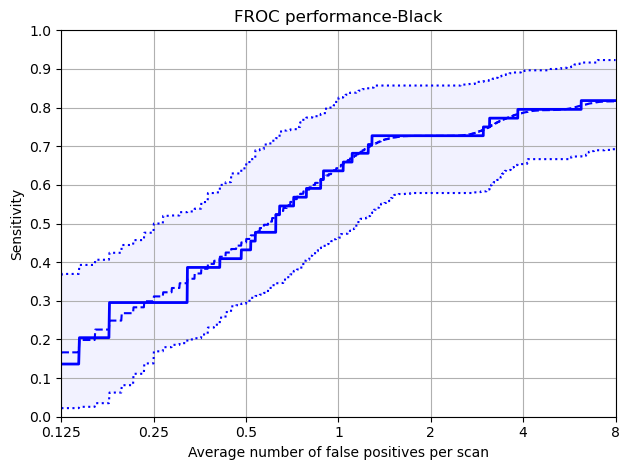

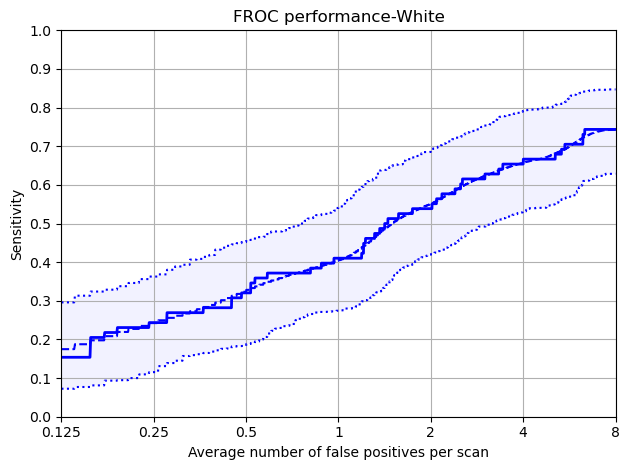

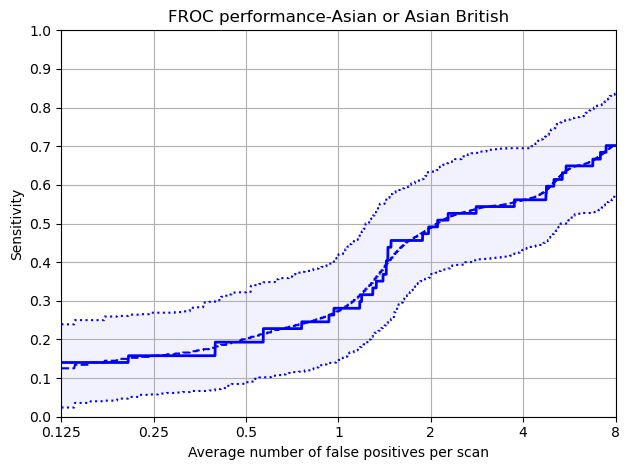

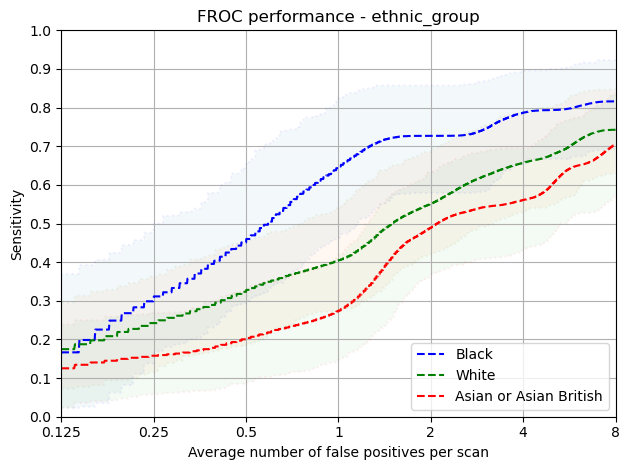

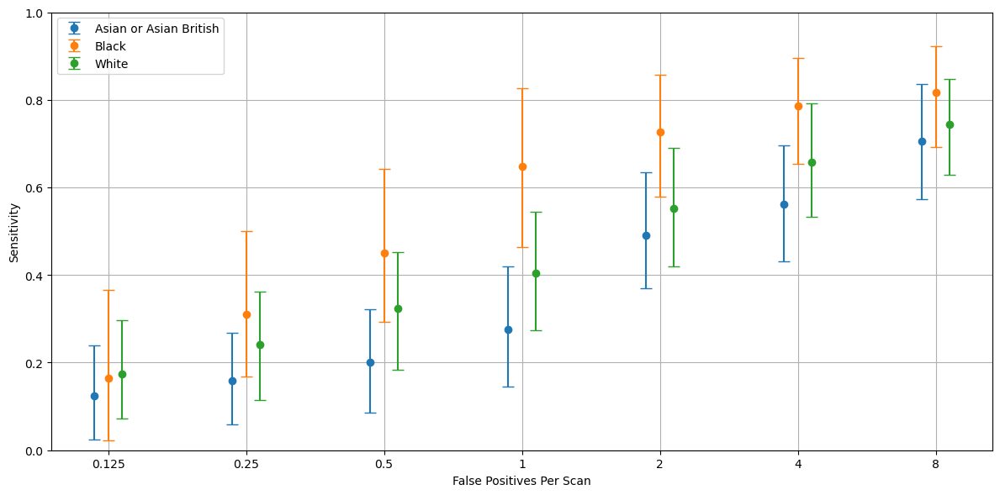

In [9]:
protected_group = 'ethnic_group'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/grt123/trained_summit/summit/{flavour}/{protected_group}'
)
display_plots_with_error_bars('grt123', flavour,'Ethnic Group', data_dict, order=['Asian or Asian British','Black','White'])

### IMDRank_tertile

Protected Group: High


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,31.0,40.0,5.0,19.0,5.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmppup8vl77/annotations.csv
Total number of included nodule annotations: 42
Total number of nodule annotations: 42
Cases: 44


100%|██████████| 1000/1000 [00:02<00:00, 467.91it/s]


,0,159,476,1111,2381,4920,9999
0,0.152 (0.029 - 0.333),0.25 (0.086 - 0.462),0.361 (0.186 - 0.538),0.426 (0.278 - 0.606),0.502 (0.34 - 0.676),0.592 (0.439 - 0.742),0.655 (0.525 - 0.8)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.152,0.029,0.333
159,0.250,0.250,0.086,0.462
476,0.500,0.361,0.186,0.538
1111,1.000,0.426,0.278,0.606
2381,2.000,0.502,0.340,0.676
4920,4.000,0.592,0.439,0.742
9999,8.000,0.655,0.525,0.800


Mean Sensitivity: 0.42 Low Sensitivity: 0.27 High Sensitivity: 0.594


,True positives,30
0,False positives,1981.000
1,False negatives,12.000
2,True negatives,0.000
3,Total number of candidates,2011.000
4,Total number of nodules,42.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,0.000
7,Sensitivity,0.714
8,Average number of candidates per scan,45.705


Protected Group: Medium


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,23.0,43.0,8.0,13.0,12.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp0o6h92x5/annotations.csv
Total number of included nodule annotations: 60
Total number of nodule annotations: 60
Cases: 54


100%|██████████| 1000/1000 [00:02<00:00, 407.90it/s]


,0,159,476,1111,2381,4920,9999
0,0.084 (0.0 - 0.2),0.163 (0.057 - 0.3),0.251 (0.122 - 0.383),0.376 (0.217 - 0.554),0.568 (0.446 - 0.698),0.601 (0.474 - 0.734),0.709 (0.566 - 0.842)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.084,0.000,0.200
159,0.250,0.163,0.057,0.300
476,0.500,0.251,0.122,0.383
1111,1.000,0.376,0.217,0.554
2381,2.000,0.568,0.446,0.698
4920,4.000,0.601,0.474,0.734
9999,8.000,0.709,0.566,0.842


Mean Sensitivity: 0.39 Low Sensitivity: 0.27 High Sensitivity: 0.53


,True positives,47
0,False positives,2342.000
1,False negatives,13.000
2,True negatives,0.000
3,Total number of candidates,2390.000
4,Total number of nodules,60.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,1.000
7,Sensitivity,0.783
8,Average number of candidates per scan,44.259


Protected Group: Low


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,21.0,64.0,4.0,4.0,7.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpj7q1hpeu/annotations.csv
Total number of included nodule annotations: 75
Total number of nodule annotations: 75
Cases: 68


100%|██████████| 1000/1000 [00:03<00:00, 323.34it/s]


,0,159,476,1111,2381,4920,9999
0,0.18 (0.085 - 0.284),0.239 (0.136 - 0.346),0.33 (0.213 - 0.449),0.446 (0.312 - 0.59),0.648 (0.511 - 0.773),0.742 (0.626 - 0.847),0.808 (0.701 - 0.894)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.180,0.085,0.284
159,0.250,0.239,0.136,0.346
476,0.500,0.330,0.213,0.449
1111,1.000,0.446,0.312,0.590
2381,2.000,0.648,0.511,0.773
4920,4.000,0.742,0.626,0.847
9999,8.000,0.808,0.701,0.894


Mean Sensitivity: 0.48 Low Sensitivity: 0.37 High Sensitivity: 0.598


,True positives,66
0,False positives,3083.000
1,False negatives,9.000
2,True negatives,0.000
3,Total number of candidates,3149.000
4,Total number of nodules,75.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,0.000
7,Sensitivity,0.880
8,Average number of candidates per scan,46.309


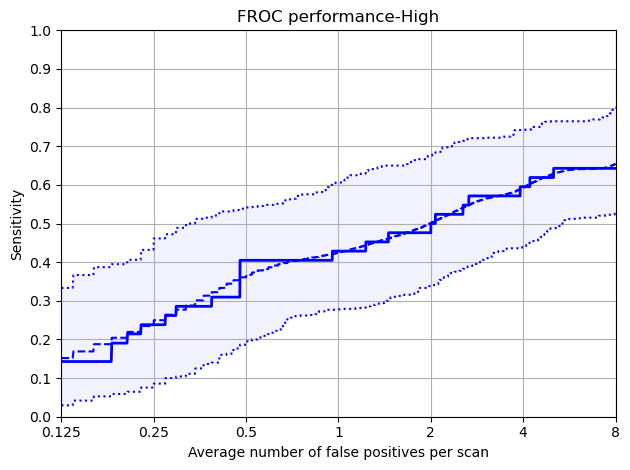

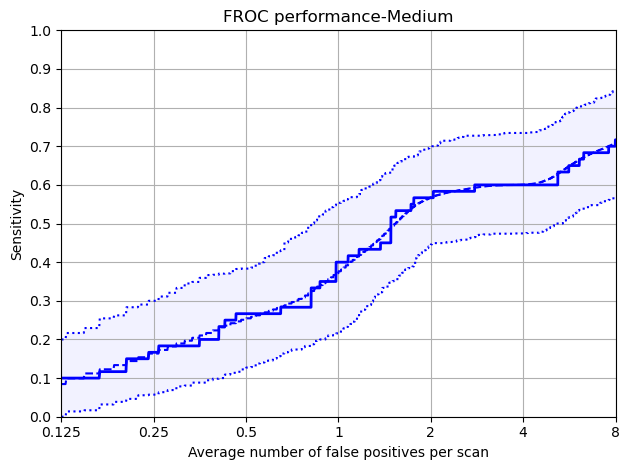

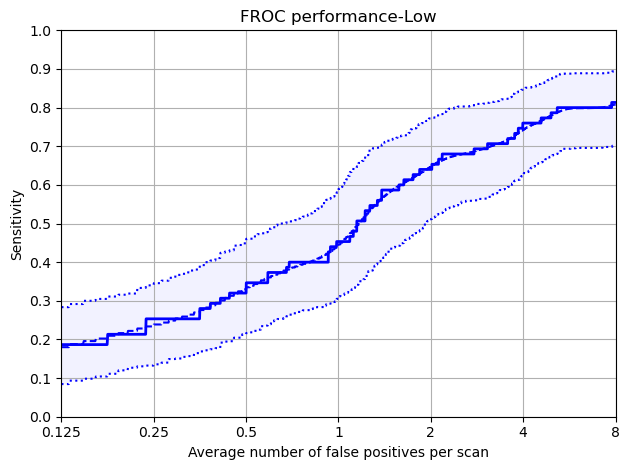

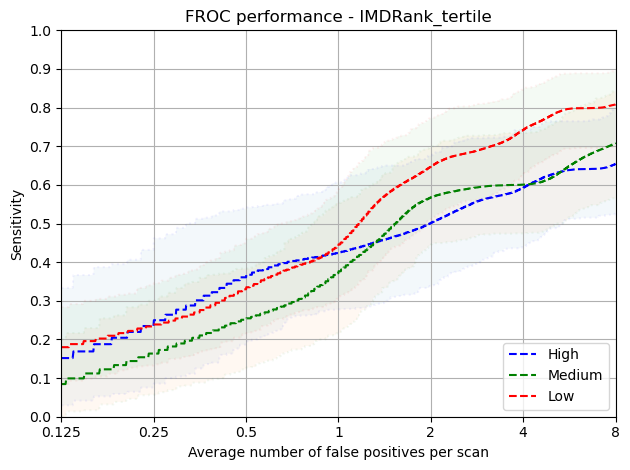

In [10]:
protected_group = 'IMDRank_tertile'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/grt123/trained_summit/summit/{flavour}/{protected_group}'
)

### Smoking Pack Years


Protected Group: Medium (35-50)


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,30.0,52.0,5.0,5.0,9.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp7jjwoyxf/annotations.csv
Total number of included nodule annotations: 64
Total number of nodule annotations: 64
Cases: 64


100%|██████████| 1000/1000 [00:02<00:00, 362.69it/s]


,0,159,476,1111,2381,4920,9999
0,0.176 (0.068 - 0.316),0.243 (0.12 - 0.373),0.341 (0.189 - 0.492),0.416 (0.28 - 0.559),0.552 (0.4 - 0.688),0.65 (0.508 - 0.779),0.756 (0.615 - 0.887)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.176,0.068,0.316
159,0.250,0.243,0.120,0.373
476,0.500,0.341,0.189,0.492
1111,1.000,0.416,0.280,0.559
2381,2.000,0.552,0.400,0.688
4920,4.000,0.650,0.508,0.779
9999,8.000,0.756,0.615,0.887


Mean Sensitivity: 0.45 Low Sensitivity: 0.31 High Sensitivity: 0.585


,True positives,53
0,False positives,2678.000
1,False negatives,11.000
2,True negatives,0.000
3,Total number of candidates,2732.000
4,Total number of nodules,64.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,1.000
7,Sensitivity,0.828
8,Average number of candidates per scan,42.688


Protected Group: Low (15-35)


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,24.0,63.0,4.0,7.0,3.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpgbii05l0/annotations.csv
Total number of included nodule annotations: 76
Total number of nodule annotations: 76
Cases: 77


100%|██████████| 1000/1000 [00:03<00:00, 280.56it/s]


,0,159,476,1111,2381,4920,9999
0,0.141 (0.045 - 0.262),0.245 (0.141 - 0.361),0.338 (0.231 - 0.449),0.514 (0.368 - 0.64),0.671 (0.558 - 0.765),0.719 (0.617 - 0.81),0.803 (0.716 - 0.884)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.141,0.045,0.262
159,0.250,0.245,0.141,0.361
476,0.500,0.338,0.231,0.449
1111,1.000,0.514,0.368,0.640
2381,2.000,0.671,0.558,0.765
4920,4.000,0.719,0.617,0.810
9999,8.000,0.803,0.716,0.884


Mean Sensitivity: 0.49 Low Sensitivity: 0.38 High Sensitivity: 0.596


,True positives,65
0,False positives,3621.000
1,False negatives,11.000
2,True negatives,0.000
3,Total number of candidates,3686.000
4,Total number of nodules,76.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,0.000
7,Sensitivity,0.855
8,Average number of candidates per scan,47.870


Protected Group: High (50+)


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,15.0,31.0,10.0,28.0,15.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpf9g_t8fl/annotations.csv
Total number of included nodule annotations: 39
Total number of nodule annotations: 39
Cases: 31


100%|██████████| 1000/1000 [00:01<00:00, 635.85it/s]


,0,159,476,1111,2381,4920,9999
0,0.106 (0.0 - 0.25),0.137 (0.026 - 0.281),0.187 (0.057 - 0.348),0.327 (0.139 - 0.578),0.508 (0.323 - 0.714),0.566 (0.395 - 0.75),0.594 (0.429 - 0.76)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.106,0.000,0.250
159,0.250,0.137,0.026,0.281
476,0.500,0.187,0.057,0.348
1111,1.000,0.327,0.139,0.578
2381,2.000,0.508,0.323,0.714
4920,4.000,0.566,0.395,0.750
9999,8.000,0.594,0.429,0.760


Mean Sensitivity: 0.35 Low Sensitivity: 0.2 High Sensitivity: 0.526


,True positives,27
0,False positives,1334.000
1,False negatives,12.000
2,True negatives,0.000
3,Total number of candidates,1361.000
4,Total number of nodules,39.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,0.000
7,Sensitivity,0.692
8,Average number of candidates per scan,43.903


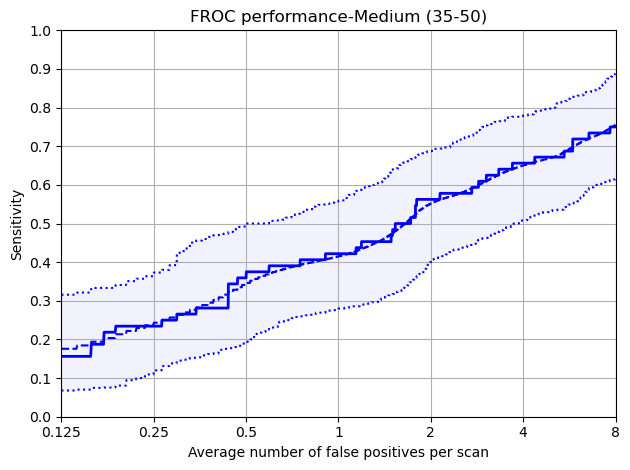

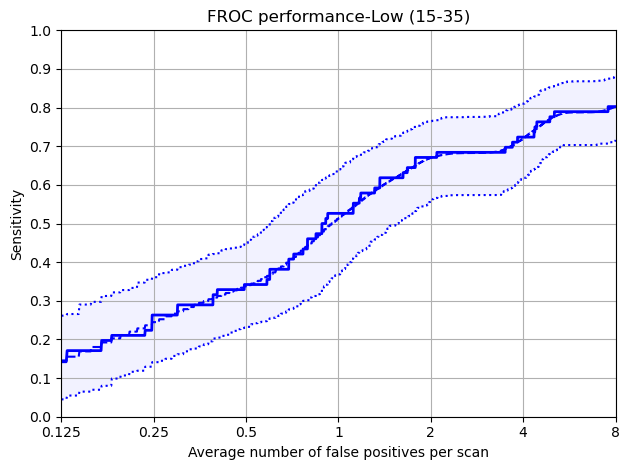

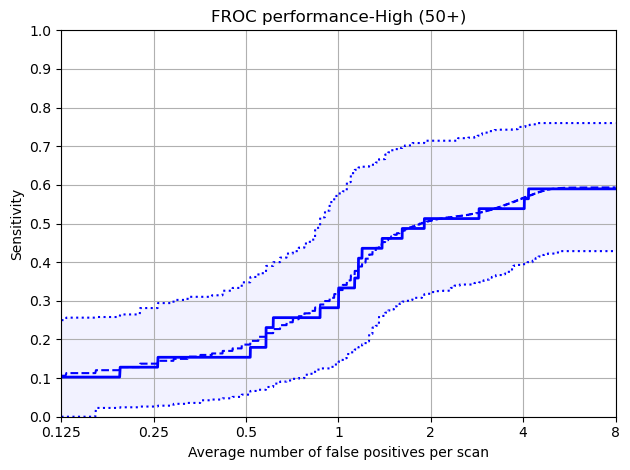

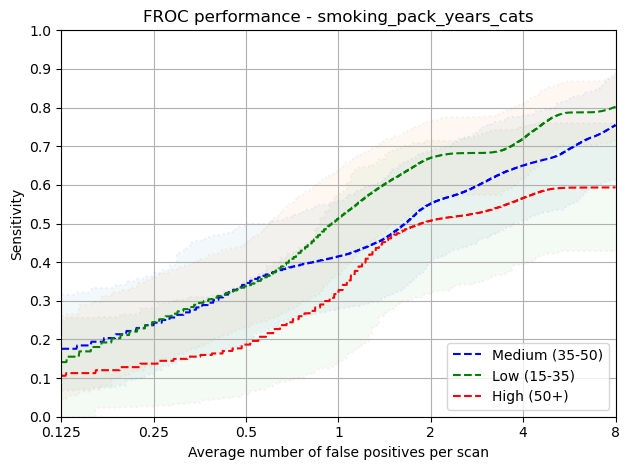

In [11]:
protected_group = 'smoking_pack_years_cats'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/grt123/trained_summit/summit/{flavour}/{protected_group}'
)

### Actionable Vs Non-Actionable

Protected Group: Non-Actionable


,SOLID,PERIFISSURAL,NON_SOLID
nodule_type,17.0,81.0,2.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp30ps98e5/annotations.csv
Total number of included nodule annotations: 84
Total number of nodule annotations: 84
Cases: 125


100%|██████████| 1000/1000 [00:05<00:00, 190.80it/s]


,0,159,476,1111,2381,4920,9999
0,0.204 (0.085 - 0.333),0.314 (0.2 - 0.427),0.414 (0.305 - 0.529),0.524 (0.389 - 0.653),0.65 (0.537 - 0.759),0.713 (0.602 - 0.826),0.839 (0.742 - 0.921)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.204,0.085,0.333
159,0.250,0.314,0.200,0.427
476,0.500,0.414,0.305,0.529
1111,1.000,0.524,0.389,0.653
2381,2.000,0.650,0.537,0.759
4920,4.000,0.713,0.602,0.826
9999,8.000,0.839,0.742,0.921


Mean Sensitivity: 0.52 Low Sensitivity: 0.41 High Sensitivity: 0.635


,True positives,75
0,False positives,5445.000
1,False negatives,9.000
2,True negatives,0.000
3,Total number of candidates,5520.000
4,Total number of nodules,84.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,0.000
7,Sensitivity,0.893
8,Average number of candidates per scan,44.160


Protected Group: Actonable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,31.0,26.0,11.0,18.0,15.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpdg45rhx0/annotations.csv
Total number of included nodule annotations: 95
Total number of nodule annotations: 95
Cases: 46


100%|██████████| 1000/1000 [00:02<00:00, 395.25it/s]


,0,159,476,1111,2381,4920,9999
0,0.083 (0.032 - 0.156),0.114 (0.058 - 0.195),0.191 (0.094 - 0.307),0.304 (0.195 - 0.437),0.515 (0.394 - 0.645),0.588 (0.476 - 0.699),0.649 (0.541 - 0.755)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.083,0.032,0.156
159,0.250,0.114,0.058,0.195
476,0.500,0.191,0.094,0.307
1111,1.000,0.304,0.195,0.437
2381,2.000,0.515,0.394,0.645
4920,4.000,0.588,0.476,0.699
9999,8.000,0.649,0.541,0.755


Mean Sensitivity: 0.35 Low Sensitivity: 0.26 High Sensitivity: 0.456


,True positives,70
0,False positives,2188.000
1,False negatives,25.000
2,True negatives,0.000
3,Total number of candidates,2259.000
4,Total number of nodules,95.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,1.000
7,Sensitivity,0.737
8,Average number of candidates per scan,49.109


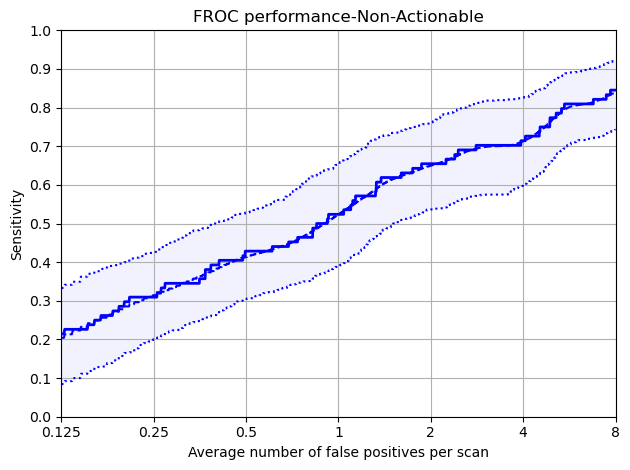

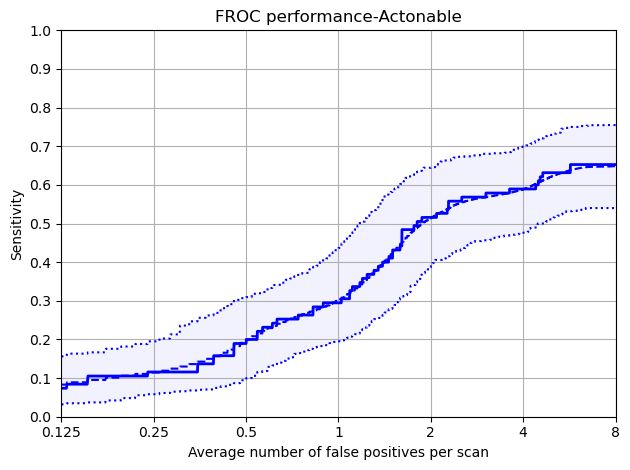

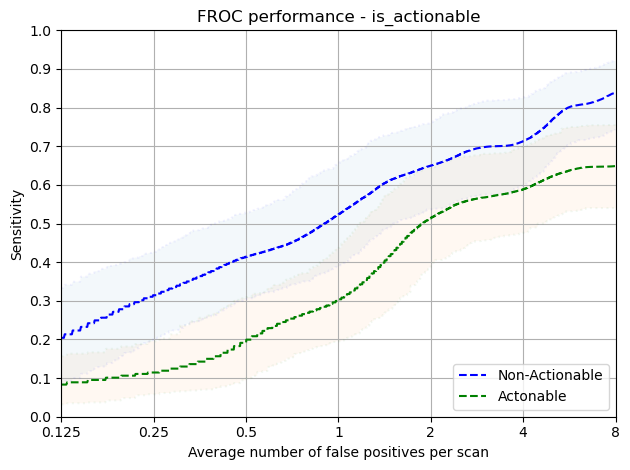

In [12]:
protected_group = 'is_actionable'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/grt123/trained_summit/summit/{flavour}/{protected_group}'
)

### Actionable-Gender Splits

Protected Group: Female


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,31.0,26.0,11.0,18.0,15.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp8_ojuxks/annotations.csv
Total number of included nodule annotations: 95
Total number of nodule annotations: 95
Cases: 46


100%|██████████| 1000/1000 [00:02<00:00, 391.29it/s]


,0,159,476,1111,2381,4920,9999
0,0.084 (0.032 - 0.154),0.116 (0.051 - 0.189),0.195 (0.087 - 0.312),0.306 (0.2 - 0.44),0.521 (0.396 - 0.644),0.593 (0.484 - 0.707),0.653 (0.553 - 0.755)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.084,0.032,0.154
159,0.250,0.116,0.051,0.189
476,0.500,0.195,0.087,0.312
1111,1.000,0.306,0.200,0.440
2381,2.000,0.521,0.396,0.644
4920,4.000,0.593,0.484,0.707
9999,8.000,0.653,0.553,0.755


Mean Sensitivity: 0.35 Low Sensitivity: 0.26 High Sensitivity: 0.457


,True positives,70
0,False positives,2188.000
1,False negatives,25.000
2,True negatives,0.000
3,Total number of candidates,2259.000
4,Total number of nodules,95.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,1.000
7,Sensitivity,0.737
8,Average number of candidates per scan,49.109


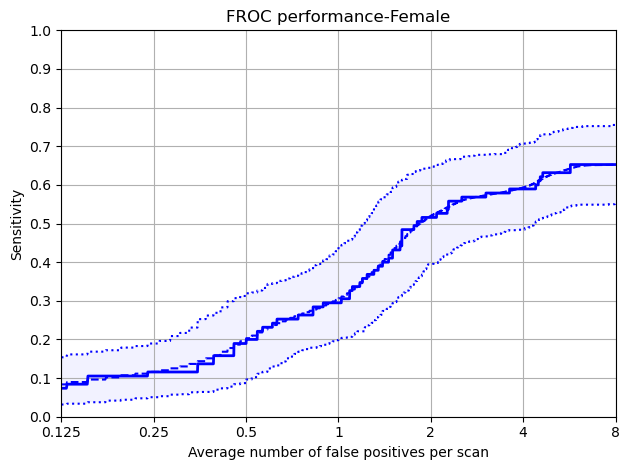

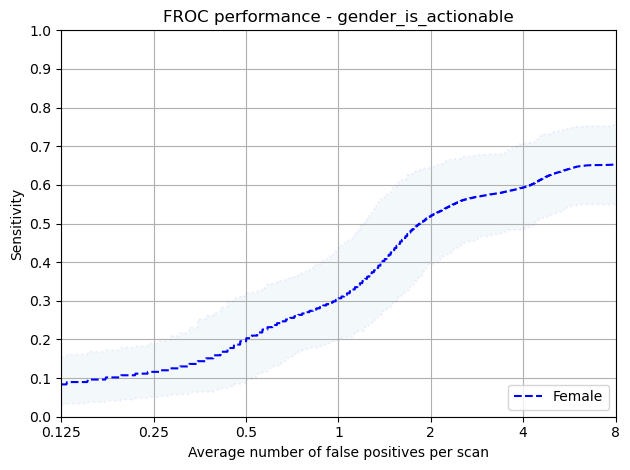

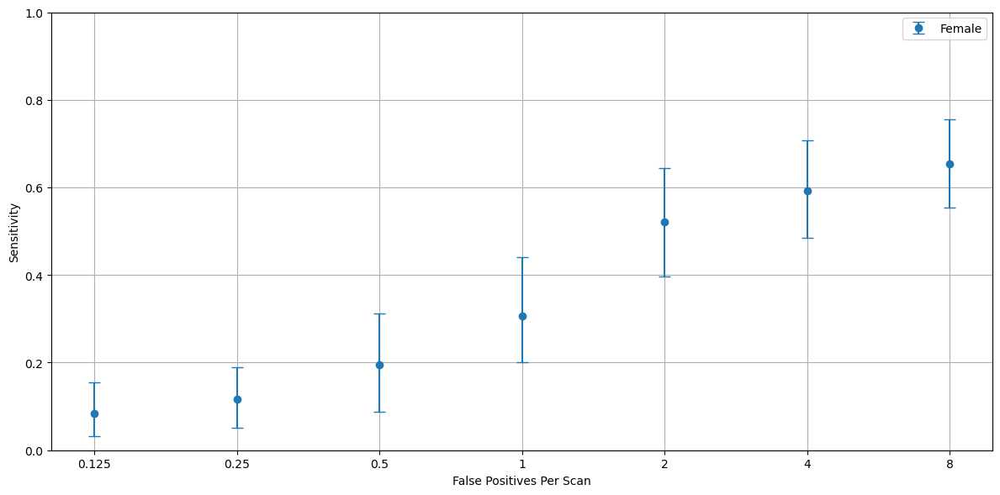

In [13]:
protected_group = 'gender_is_actionable'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/grt123/trained_summit/summit/{flavour}/{protected_group}'
)
display_plots_with_error_bars('grt123', flavour, 'Actionable, Gender', data_dict)

### NonActionable-Gender

Protected Group: Female


,SOLID,PERIFISSURAL,NON_SOLID
nodule_type,17.0,81.0,2.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpcsrgkht0/annotations.csv
Total number of included nodule annotations: 84
Total number of nodule annotations: 84
Cases: 125


100%|██████████| 1000/1000 [00:06<00:00, 166.10it/s]


,0,159,476,1111,2381,4920,9999
0,0.206 (0.086 - 0.34),0.318 (0.206 - 0.429),0.414 (0.304 - 0.526),0.524 (0.394 - 0.649),0.649 (0.539 - 0.756),0.713 (0.602 - 0.818),0.839 (0.75 - 0.921)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.206,0.086,0.340
159,0.250,0.318,0.206,0.429
476,0.500,0.414,0.304,0.526
1111,1.000,0.524,0.394,0.649
2381,2.000,0.649,0.539,0.756
4920,4.000,0.713,0.602,0.818
9999,8.000,0.839,0.750,0.921


Mean Sensitivity: 0.52 Low Sensitivity: 0.41 High Sensitivity: 0.634


,True positives,75
0,False positives,5445.000
1,False negatives,9.000
2,True negatives,0.000
3,Total number of candidates,5520.000
4,Total number of nodules,84.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,0.000
7,Sensitivity,0.893
8,Average number of candidates per scan,44.160


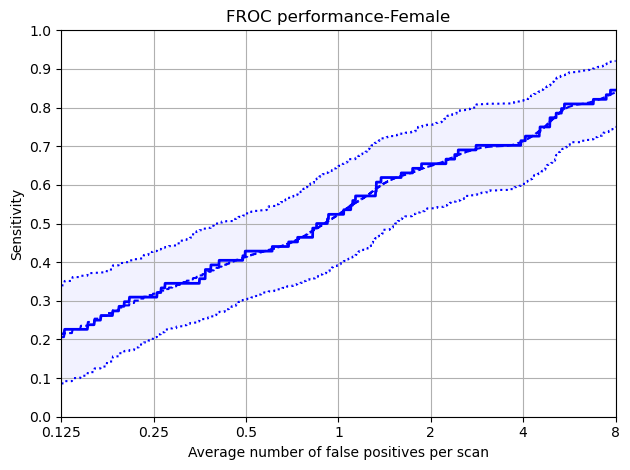

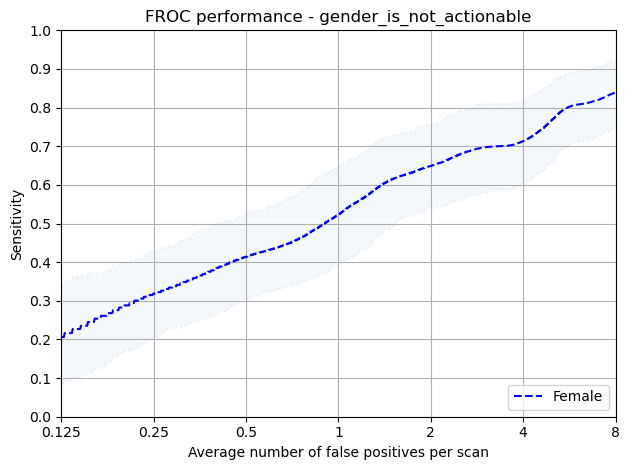

In [14]:
protected_group = 'gender_is_not_actionable'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/grt123/trained_summit/summit/{flavour}/{protected_group}'
)

### Actionable Ethnic Group

Protected Group: White


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,27.0,27.0,11.0,18.0,16.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpe_ob7zk_/annotations.csv
Total number of included nodule annotations: 44
Total number of nodule annotations: 44
Cases: 18


100%|██████████| 1000/1000 [00:01<00:00, 665.23it/s]


,0,159,476,1111,2381,4920,9999
0,0.137 (0.024 - 0.281),0.187 (0.068 - 0.351),0.267 (0.103 - 0.455),0.368 (0.191 - 0.571),0.547 (0.347 - 0.745),0.634 (0.487 - 0.786),0.703 (0.558 - 0.837)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.137,0.024,0.281
159,0.250,0.187,0.068,0.351
476,0.500,0.267,0.103,0.455
1111,1.000,0.368,0.191,0.571
2381,2.000,0.547,0.347,0.745
4920,4.000,0.634,0.487,0.786
9999,8.000,0.703,0.558,0.837


Mean Sensitivity: 0.41 Low Sensitivity: 0.25 High Sensitivity: 0.575


,True positives,33
0,False positives,921.000
1,False negatives,11.000
2,True negatives,0.000
3,Total number of candidates,955.000
4,Total number of nodules,44.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,1.000
7,Sensitivity,0.750
8,Average number of candidates per scan,53.056


Protected Group: Asian or Asian British


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,31.0,22.0,9.0,25.0,12.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp2kxktafn/annotations.csv
Total number of included nodule annotations: 32
Total number of nodule annotations: 32
Cases: 19


100%|██████████| 1000/1000 [00:01<00:00, 782.24it/s]


,0,159,476,1111,2381,4920,9999
0,0.031 (0.0 - 0.107),0.044 (0.0 - 0.125),0.086 (0.0 - 0.184),0.155 (0.056 - 0.304),0.405 (0.222 - 0.593),0.484 (0.323 - 0.645),0.543 (0.371 - 0.714)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.031,0.000,0.107
159,0.250,0.044,0.000,0.125
476,0.500,0.086,0.000,0.184
1111,1.000,0.155,0.056,0.304
2381,2.000,0.405,0.222,0.593
4920,4.000,0.484,0.323,0.645
9999,8.000,0.543,0.371,0.714


Mean Sensitivity: 0.25 Low Sensitivity: 0.14 High Sensitivity: 0.382


,True positives,22
0,False positives,826.000
1,False negatives,10.000
2,True negatives,0.000
3,Total number of candidates,848.000
4,Total number of nodules,32.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,0.000
7,Sensitivity,0.688
8,Average number of candidates per scan,44.632


Protected Group: Black


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,37.0,32.0,11.0,5.0,16.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp85j4fjbc/annotations.csv
Total number of included nodule annotations: 19
Total number of nodule annotations: 19
Cases: 11


100%|██████████| 1000/1000 [00:00<00:00, 1065.46it/s]


,0,159,476,1111,2381,4920,9999
0,0.15 (0.0 - 0.5),0.191 (0.0 - 0.6),0.363 (0.029 - 0.769),0.553 (0.2 - 0.833),0.615 (0.25 - 0.857),0.746 (0.444 - 1.0),0.778 (0.5 - 1.0)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.150,0.000,0.500
159,0.250,0.191,0.000,0.600
476,0.500,0.363,0.029,0.769
1111,1.000,0.553,0.200,0.833
2381,2.000,0.615,0.250,0.857
4920,4.000,0.746,0.444,1.000
9999,8.000,0.778,0.500,1.000


Mean Sensitivity: 0.49 Low Sensitivity: 0.2 High Sensitivity: 0.794


,True positives,15
0,False positives,441.000
1,False negatives,4.000
2,True negatives,0.000
3,Total number of candidates,456.000
4,Total number of nodules,19.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,0.000
7,Sensitivity,0.789
8,Average number of candidates per scan,41.455


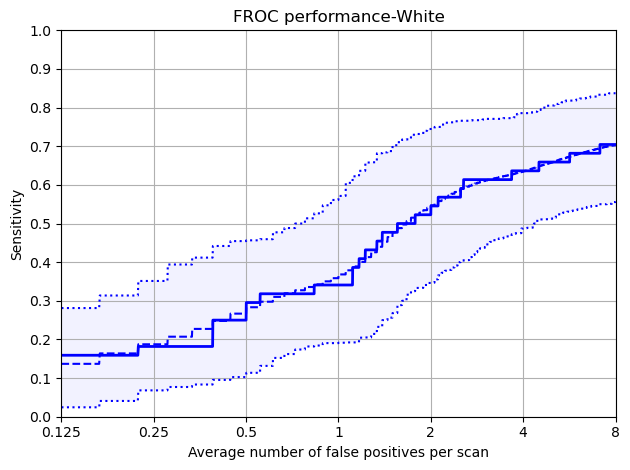

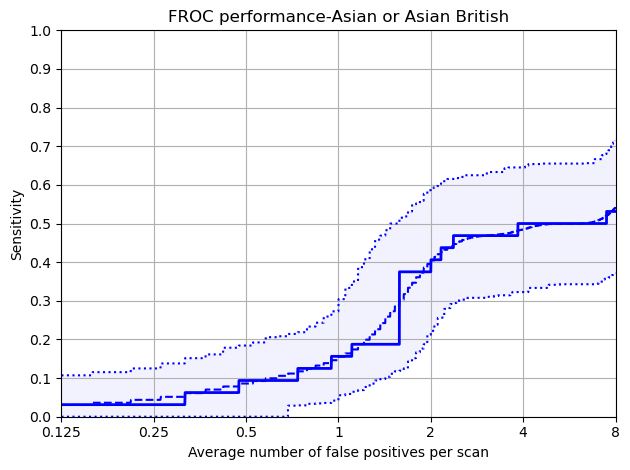

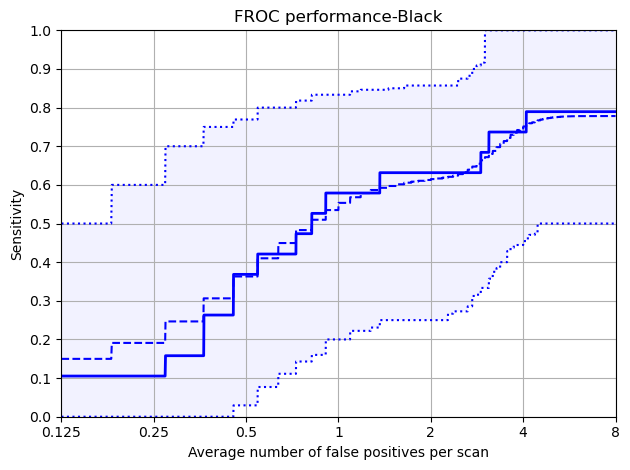

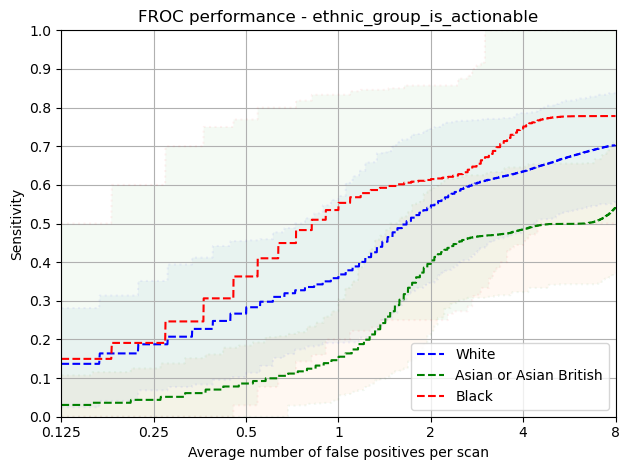

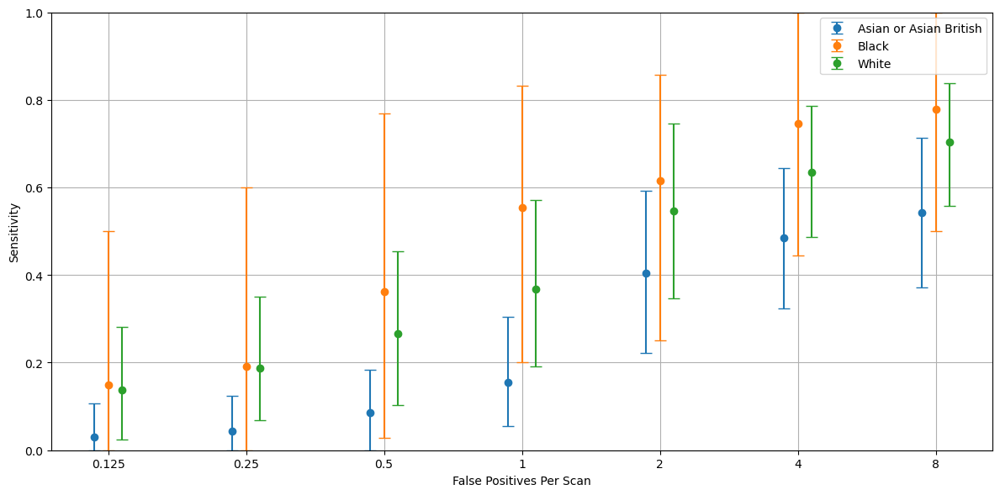

In [15]:
protected_group = 'ethnic_group_is_actionable'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/grt123/trained_summit/summit/{flavour}/{protected_group}'
)
display_plots_with_error_bars('grt123', flavour, 'Actionable, Ethnic Group', data_dict, order=['Asian or Asian British','Black','White'])

### NonActionable Ethnic Group

Protected Group: Black


,SOLID,PERIFISSURAL
nodule_type,12.0,88.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpa2gb2rfa/annotations.csv
Total number of included nodule annotations: 25
Total number of nodule annotations: 25
Cases: 46


100%|██████████| 1000/1000 [00:02<00:00, 429.38it/s]


,0,159,476,1111,2381,4920,9999
0,0.189 (0.0 - 0.417),0.36 (0.182 - 0.565),0.522 (0.35 - 0.75),0.718 (0.5 - 0.909),0.799 (0.652 - 0.929),0.799 (0.652 - 0.929),0.836 (0.682 - 0.963)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.189,0.000,0.417
159,0.250,0.360,0.182,0.565
476,0.500,0.522,0.350,0.750
1111,1.000,0.718,0.500,0.909
2381,2.000,0.799,0.652,0.929
4920,4.000,0.799,0.652,0.929
9999,8.000,0.836,0.682,0.963


Mean Sensitivity: 0.6 Low Sensitivity: 0.43 High Sensitivity: 0.78


,True positives,22
0,False positives,1901.000
1,False negatives,3.000
2,True negatives,0.000
3,Total number of candidates,1923.000
4,Total number of nodules,25.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,0.000
7,Sensitivity,0.880
8,Average number of candidates per scan,41.804


Protected Group: White


,SOLID,PERIFISSURAL,NON_SOLID
nodule_type,24.0,74.0,3.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpj__s0r5_/annotations.csv
Total number of included nodule annotations: 34
Total number of nodule annotations: 34
Cases: 41


100%|██████████| 1000/1000 [00:02<00:00, 458.80it/s]


,0,159,476,1111,2381,4920,9999
0,0.265 (0.074 - 0.471),0.342 (0.133 - 0.533),0.417 (0.239 - 0.593),0.495 (0.286 - 0.692),0.572 (0.371 - 0.756),0.678 (0.455 - 0.878),0.798 (0.625 - 0.941)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.265,0.074,0.471
159,0.250,0.342,0.133,0.533
476,0.500,0.417,0.239,0.593
1111,1.000,0.495,0.286,0.692
2381,2.000,0.572,0.371,0.756
4920,4.000,0.678,0.455,0.878
9999,8.000,0.798,0.625,0.941


Mean Sensitivity: 0.51 Low Sensitivity: 0.31 High Sensitivity: 0.695


,True positives,31
0,False positives,1947.000
1,False negatives,3.000
2,True negatives,0.000
3,Total number of candidates,1978.000
4,Total number of nodules,34.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,0.000
7,Sensitivity,0.912
8,Average number of candidates per scan,48.244


Protected Group: Asian or Asian British


,SOLID,PERIFISSURAL,NON_SOLID
nodule_type,12.0,84.0,4.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp3763fsq0/annotations.csv
Total number of included nodule annotations: 25
Total number of nodule annotations: 25
Cases: 40


100%|██████████| 1000/1000 [00:01<00:00, 547.34it/s]


,0,159,476,1111,2381,4920,9999
0,0.276 (0.077 - 0.522),0.287 (0.08 - 0.529),0.34 (0.125 - 0.577),0.429 (0.19 - 0.682),0.582 (0.36 - 0.792),0.657 (0.444 - 0.85),0.877 (0.714 - 1.0)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.276,0.077,0.522
159,0.250,0.287,0.080,0.529
476,0.500,0.340,0.125,0.577
1111,1.000,0.429,0.190,0.682
2381,2.000,0.582,0.360,0.792
4920,4.000,0.657,0.444,0.850
9999,8.000,0.877,0.714,1.000


Mean Sensitivity: 0.49 Low Sensitivity: 0.28 High Sensitivity: 0.707


,True positives,22
0,False positives,1597.000
1,False negatives,3.000
2,True negatives,0.000
3,Total number of candidates,1619.000
4,Total number of nodules,25.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,0.000
7,Sensitivity,0.880
8,Average number of candidates per scan,40.475


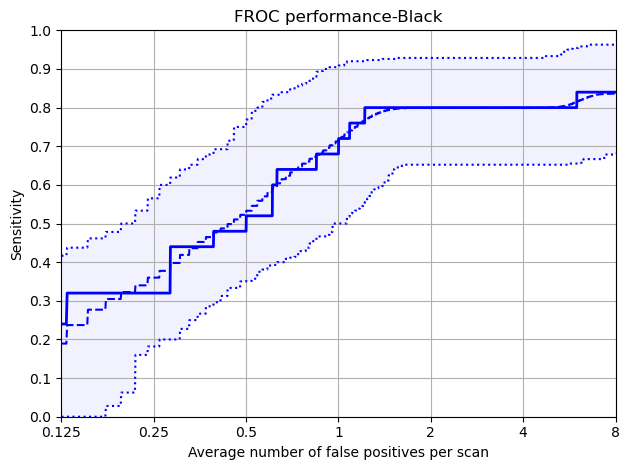

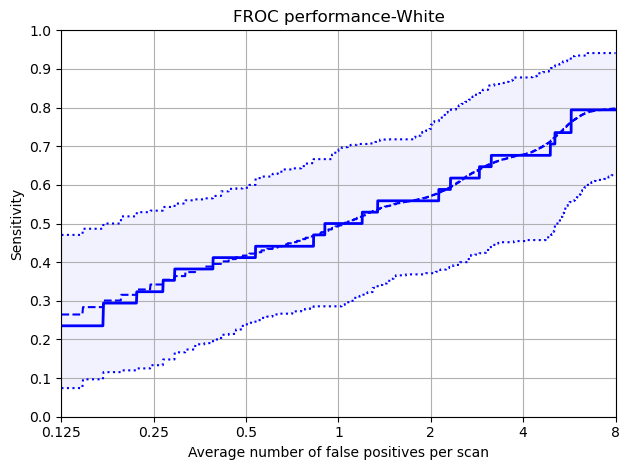

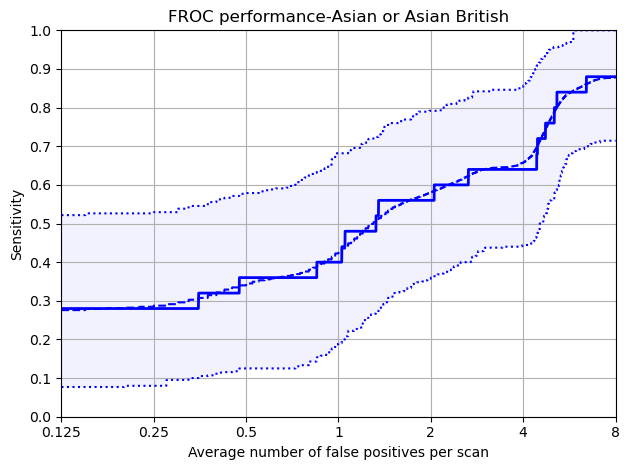

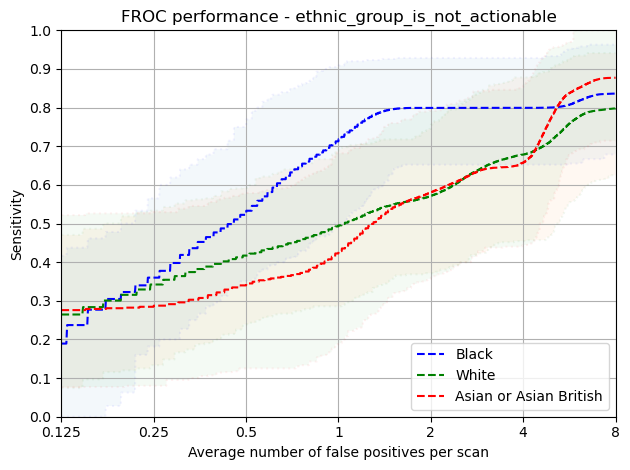

In [16]:
protected_group = 'ethnic_group_is_not_actionable'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/grt123/trained_summit/summit/{flavour}/{protected_group}'
)

### Actionable IMDRank

Protected Group: Medium_IMDRank_Actionable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,23.0,13.0,16.0,26.0,23.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpvds44ue7/annotations.csv
Total number of included nodule annotations: 31
Total number of nodule annotations: 31
Cases: 18


100%|██████████| 1000/1000 [00:01<00:00, 750.95it/s]


,0,159,476,1111,2381,4920,9999
0,0.033 (0.0 - 0.115),0.038 (0.0 - 0.152),0.087 (0.0 - 0.323),0.248 (0.065 - 0.462),0.5 (0.281 - 0.697),0.554 (0.382 - 0.722),0.596 (0.412 - 0.792)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.033,0.000,0.115
159,0.250,0.038,0.000,0.152
476,0.500,0.087,0.000,0.323
1111,1.000,0.248,0.065,0.462
2381,2.000,0.500,0.281,0.697
4920,4.000,0.554,0.382,0.722
9999,8.000,0.596,0.412,0.792


Mean Sensitivity: 0.29 Low Sensitivity: 0.16 High Sensitivity: 0.466


,True positives,23
0,False positives,809.000
1,False negatives,8.000
2,True negatives,0.000
3,Total number of candidates,833.000
4,Total number of nodules,31.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,1.000
7,Sensitivity,0.742
8,Average number of candidates per scan,46.278


Protected Group: Low_IMDRank_Actionable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,33.0,41.0,8.0,5.0,13.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp0um5_22o/annotations.csv
Total number of included nodule annotations: 39
Total number of nodule annotations: 39
Cases: 19


100%|██████████| 1000/1000 [00:01<00:00, 755.77it/s]


,0,159,476,1111,2381,4920,9999
0,0.086 (0.0 - 0.25),0.141 (0.019 - 0.318),0.251 (0.095 - 0.435),0.435 (0.184 - 0.727),0.66 (0.463 - 0.812),0.743 (0.568 - 0.875),0.767 (0.6 - 0.899)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.086,0.000,0.250
159,0.250,0.141,0.019,0.318
476,0.500,0.251,0.095,0.435
1111,1.000,0.435,0.184,0.727
2381,2.000,0.660,0.463,0.812
4920,4.000,0.743,0.568,0.875
9999,8.000,0.767,0.600,0.899


Mean Sensitivity: 0.44 Low Sensitivity: 0.28 High Sensitivity: 0.617


,True positives,31
0,False positives,843.000
1,False negatives,8.000
2,True negatives,0.000
3,Total number of candidates,874.000
4,Total number of nodules,39.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,0.000
7,Sensitivity,0.795
8,Average number of candidates per scan,46.000


Protected Group: High_IMDRank_Actionable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,36.0,20.0,8.0,28.0,8.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmph552e5xo/annotations.csv
Total number of included nodule annotations: 25
Total number of nodule annotations: 25
Cases: 11


100%|██████████| 1000/1000 [00:01<00:00, 894.04it/s]


,0,159,476,1111,2381,4920,9999
0,0.185 (0.037 - 0.375),0.23 (0.067 - 0.414),0.322 (0.179 - 0.5),0.356 (0.208 - 0.588),0.396 (0.214 - 0.64),0.474 (0.286 - 0.7),0.566 (0.429 - 0.731)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.185,0.037,0.375
159,0.250,0.230,0.067,0.414
476,0.500,0.322,0.179,0.500
1111,1.000,0.356,0.208,0.588
2381,2.000,0.396,0.214,0.640
4920,4.000,0.474,0.286,0.700
9999,8.000,0.566,0.429,0.731


Mean Sensitivity: 0.36 Low Sensitivity: 0.2 High Sensitivity: 0.564


,True positives,16
0,False positives,536.000
1,False negatives,9.000
2,True negatives,0.000
3,Total number of candidates,552.000
4,Total number of nodules,25.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,0.000
7,Sensitivity,0.640
8,Average number of candidates per scan,50.182


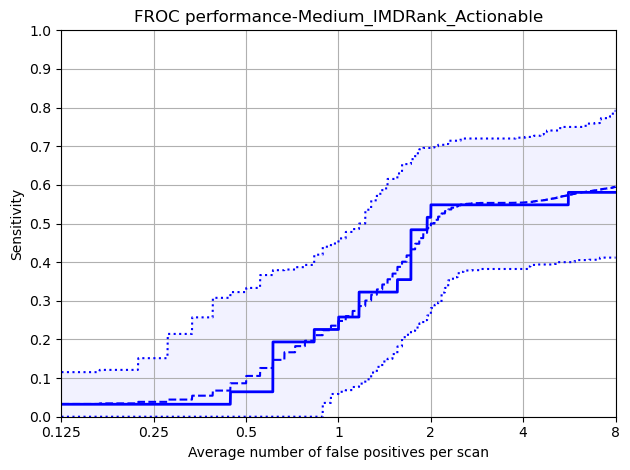

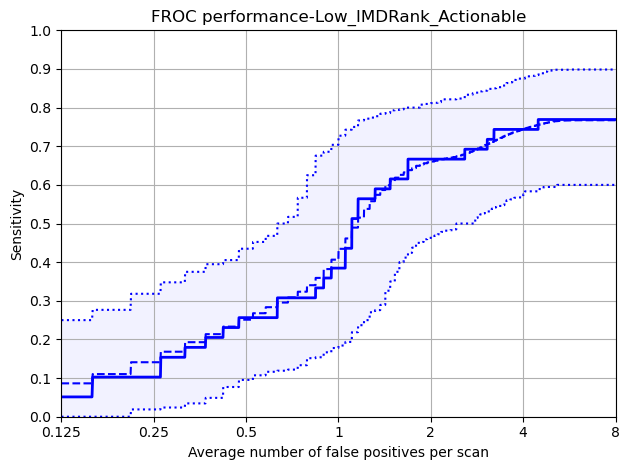

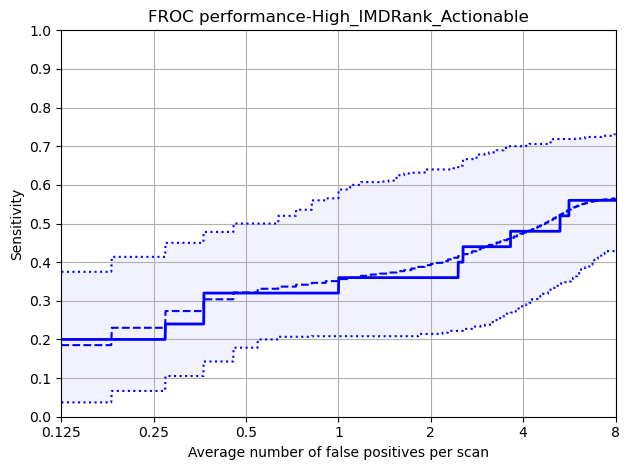

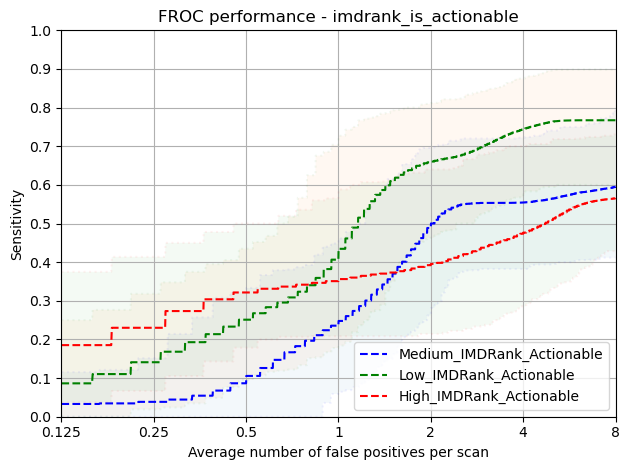

In [17]:
protected_group = 'imdrank_is_actionable'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/grt123/trained_summit/summit/{flavour}/{protected_group}'
)

### Actionable Smoking Status

Protected Group: Low_Pack_Years_Actionable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,40.0,33.0,10.0,10.0,7.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmptukgbd4g/annotations.csv
Total number of included nodule annotations: 30
Total number of nodule annotations: 30
Cases: 15


100%|██████████| 1000/1000 [00:01<00:00, 785.24it/s]


,0,159,476,1111,2381,4920,9999
0,0.079 (0.0 - 0.222),0.119 (0.0 - 0.325),0.25 (0.038 - 0.483),0.45 (0.2 - 0.647),0.666 (0.5 - 0.769),0.727 (0.6 - 0.833),0.768 (0.636 - 0.875)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.079,0.000,0.222
159,0.250,0.119,0.000,0.325
476,0.500,0.250,0.038,0.483
1111,1.000,0.450,0.200,0.647
2381,2.000,0.666,0.500,0.769
4920,4.000,0.727,0.600,0.833
9999,8.000,0.768,0.636,0.875


Mean Sensitivity: 0.44 Low Sensitivity: 0.28 High Sensitivity: 0.593


,True positives,24
0,False positives,702.0
1,False negatives,6.0
2,True negatives,0.0
3,Total number of candidates,726.0
4,Total number of nodules,30.0
5,Ignored candidates on excluded nodules,0.0
6,Ignored candidates which were double detec...,0.0
7,Sensitivity,0.8
8,Average number of candidates per scan,48.4


Protected Group: Medium_Pack_Years_Actionable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,35.0,29.0,9.0,9.0,18.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpksly7ul3/annotations.csv
Total number of included nodule annotations: 34
Total number of nodule annotations: 34
Cases: 20


100%|██████████| 1000/1000 [00:01<00:00, 749.75it/s]


,0,159,476,1111,2381,4920,9999
0,0.121 (0.0 - 0.258),0.181 (0.057 - 0.346),0.248 (0.081 - 0.432),0.35 (0.194 - 0.529),0.492 (0.286 - 0.69),0.567 (0.375 - 0.742),0.647 (0.457 - 0.824)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.121,0.000,0.258
159,0.250,0.181,0.057,0.346
476,0.500,0.248,0.081,0.432
1111,1.000,0.350,0.194,0.529
2381,2.000,0.492,0.286,0.690
4920,4.000,0.567,0.375,0.742
9999,8.000,0.647,0.457,0.824


Mean Sensitivity: 0.37 Low Sensitivity: 0.21 High Sensitivity: 0.546


,True positives,25
0,False positives,845.000
1,False negatives,9.000
2,True negatives,0.000
3,Total number of candidates,871.000
4,Total number of nodules,34.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,1.000
7,Sensitivity,0.735
8,Average number of candidates per scan,43.550


Protected Group: High_Pack_Years_Actionable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,16.0,16.0,13.0,35.0,19.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmppwygxfl3/annotations.csv
Total number of included nodule annotations: 31
Total number of nodule annotations: 31
Cases: 13


100%|██████████| 1000/1000 [00:01<00:00, 851.93it/s]


,0,159,476,1111,2381,4920,9999
0,0.064 (0.0 - 0.182),0.096 (0.0 - 0.243),0.143 (0.0 - 0.312),0.237 (0.05 - 0.56),0.446 (0.241 - 0.686),0.51 (0.31 - 0.72),0.58 (0.394 - 0.775)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.064,0.000,0.182
159,0.250,0.096,0.000,0.243
476,0.500,0.143,0.000,0.312
1111,1.000,0.237,0.050,0.560
2381,2.000,0.446,0.241,0.686
4920,4.000,0.510,0.310,0.720
9999,8.000,0.580,0.394,0.775


Mean Sensitivity: 0.3 Low Sensitivity: 0.14 High Sensitivity: 0.497


,True positives,21
0,False positives,641.000
1,False negatives,10.000
2,True negatives,0.000
3,Total number of candidates,662.000
4,Total number of nodules,31.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,0.000
7,Sensitivity,0.677
8,Average number of candidates per scan,50.923


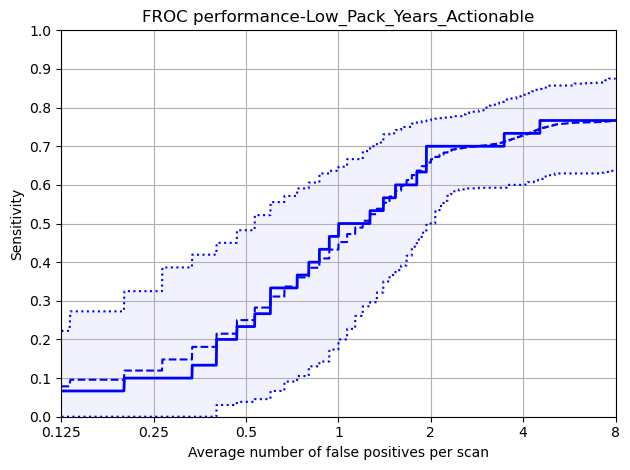

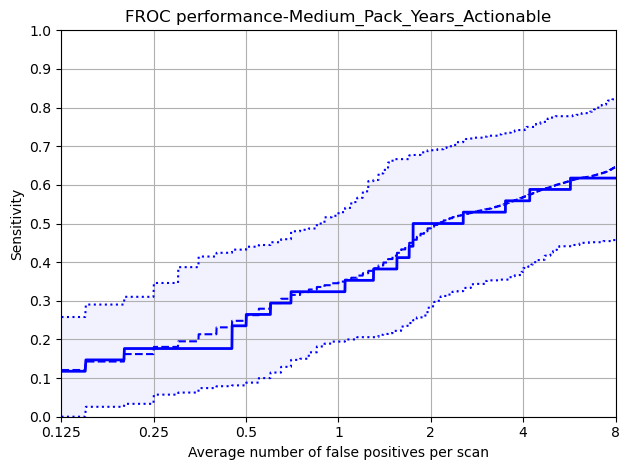

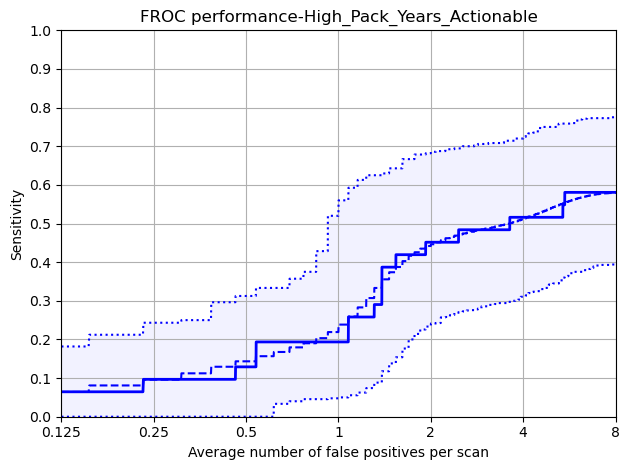

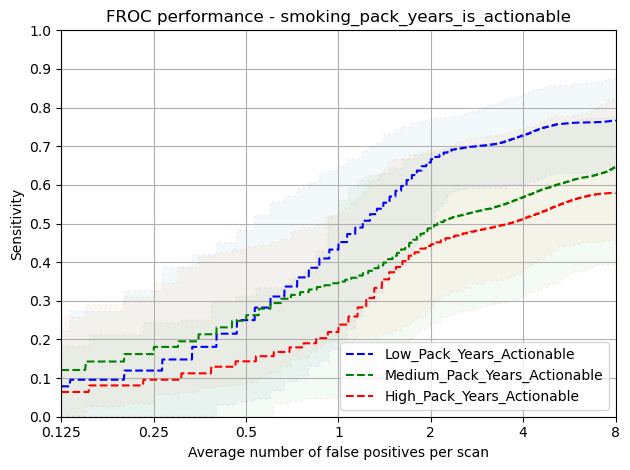

In [18]:
protected_group = 'smoking_pack_years_is_actionable'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/grt123/trained_summit/summit/{flavour}/{protected_group}'
)

### False positive and Miss Investigations

In [19]:
import importlib
import utils

importlib.reload(utils)

<module 'utils' from '/Users/john/Projects/SOTAEvaluationNoduleDetection/notebooks/FairnessInNoduleDetectionAlgorithms/utils.py'>

In [20]:
thresholds = utils.get_thresholds(grt123_summit_summit)
missed_metadata = utils.miss_anaysis_at_fpps(
    model='grt123',
    scans_metadata=scan_metadata,
    scans_path=f'{workspace_path}/metadata/summit/{flavour}/test_scans.csv',
    annotations_path=f'{workspace_path}/models/grt123/bbox_result/trained_summit/summit/{flavour}/{flavour}_metadata.csv',
    exclusions_path=f'{workspace_path}/data/summit/metadata/grt123_annotations_excluded_empty.csv',
    predictions_path=f'{workspace_path}/models/grt123/bbox_result/trained_summit/summit/{flavour}/{flavour}_predictions.csv',
    thresholds=thresholds
)


/Users/john/Projects/SOTAEvaluationNoduleDetection/models/grt123/bbox_result/trained_summit/summit/balanced_female_for_inference/balanced_female_for_inference_metadata.csv
Total number of included nodule annotations: 180
Total number of nodule annotations: 180
Cases: 172
Missed Annotations at 7.1617875 FPPs: 159
/Users/john/Projects/SOTAEvaluationNoduleDetection/models/grt123/bbox_result/trained_summit/summit/balanced_female_for_inference/balanced_female_for_inference_metadata.csv
Total number of included nodule annotations: 180
Total number of nodule annotations: 180
Cases: 172
Missed Annotations at 6.8667235 FPPs: 143
/Users/john/Projects/SOTAEvaluationNoduleDetection/models/grt123/bbox_result/trained_summit/summit/balanced_female_for_inference/balanced_female_for_inference_metadata.csv
Total number of included nodule annotations: 180
Total number of nodule annotations: 180
Cases: 172
Missed Annotations at 6.406053 FPPs: 123
/Users/john/Projects/SOTAEvaluationNoduleDetection/models/g

#### Incremental FROC Scores - Gender/ Ethnic Group/ Nodule Type

In [21]:

hit_and_miss_dict = utils.get_protected_group_by_nodule_type(missed_metadata)


In [32]:


recode_dict = {}
for idx in range(7):
    hmm = {}
    for slice in ['all','actionable']:
        for protected_group in ['MALE','FEMALE','All', 'Asian or Asian British', 'Black', 'White']:
            for type in ['SOLID','NON_SOLID','PART_SOLID','PERIFISSURAL','CALCIFIED']:
            
                try:

                    group = 'gender' if protected_group in ['MALE','FEMALE','All'] else 'ethnic_group'

                    total = hit_and_miss_dict[idx][slice][group][(True,type)][protected_group] + hit_and_miss_dict[idx][slice][group][(False,type)][protected_group]
                    hits = hit_and_miss_dict[idx][slice][group][(False,type)][protected_group]
                    perc_hits = round(100 * (hits/total),0)

                    if hits == 0:
                        perc_hits = 0

                    hmm[f'{slice}_{protected_group}_{type}_Hits%'] = perc_hits
                except:
                    print(f'Error: {idx}, {slice}, {protected_group}, {type}')
                    pass

    recode_dict[idx] = hmm

df = pd.DataFrame.from_dict(recode_dict, orient='index')

# Remove ".0" from each value in the dataframe
df = df.applymap(lambda x: str(x).replace('.0', ''))

# Collapse each column into comma-delimited values
collapsed_df = df.apply(lambda x: ', '.join(x), axis=0)

display(collapsed_df)

from scipy.stats import shapiro, ttest_ind, mannwhitneyu

def calculate_significant_differences(df, group1_name, group2_name):

    if group1_name not in df.columns or group2_name not in df.columns:
        print(f'Error: {group1_name} or {group2_name} not in dataframe')
        return

    group1 = df[group1_name].astype(int).values
    group2 = df[group2_name].astype(int).values

    shapiro_group1 = shapiro(group1)
    shapiro_group2 = shapiro(group2)

    print('*'*50)
    if shapiro_group1[1] > 0.05 and shapiro_group2[1] > 0.05:
        t_test = ttest_ind(group1, group2)
        print(f'Independent T-Test: {round(t_test.statistic,3)}, {round(t_test.pvalue,3)}')
    else:
        manwhitney = mannwhitneyu(group1, group2)
        print(f'Mann-Whitney U Test: {round(manwhitney.statistic,3)}, {round(manwhitney.pvalue,3)}')

for type in ['SOLID','NON_SOLID','PART_SOLID','PERIFISSURAL','CALCIFIED']:

    try:
        print(f'*** {type} ***')
        group1 = f'all_White_{type}_Hits%'
        group2 = f'all_Asian or Asian British_{type}_Hits%'
        calculate_significant_differences(df, group1, group2)
    except:
        pass

Error: 0, all, MALE, SOLID
Error: 0, all, MALE, NON_SOLID
Error: 0, all, MALE, PART_SOLID
Error: 0, all, MALE, PERIFISSURAL
Error: 0, all, MALE, CALCIFIED
Error: 0, all, FEMALE, NON_SOLID
Error: 0, all, FEMALE, PART_SOLID
Error: 0, all, FEMALE, CALCIFIED
Error: 0, all, All, NON_SOLID
Error: 0, all, All, PART_SOLID
Error: 0, all, All, CALCIFIED
Error: 0, all, Asian or Asian British, NON_SOLID
Error: 0, all, Asian or Asian British, PART_SOLID
Error: 0, all, Asian or Asian British, CALCIFIED
Error: 0, all, Black, NON_SOLID
Error: 0, all, Black, PART_SOLID
Error: 0, all, Black, CALCIFIED
Error: 0, all, White, NON_SOLID
Error: 0, all, White, PART_SOLID
Error: 0, all, White, CALCIFIED
Error: 0, actionable, MALE, SOLID
Error: 0, actionable, MALE, NON_SOLID
Error: 0, actionable, MALE, PART_SOLID
Error: 0, actionable, MALE, PERIFISSURAL
Error: 0, actionable, MALE, CALCIFIED
Error: 0, actionable, FEMALE, NON_SOLID
Error: 0, actionable, FEMALE, PART_SOLID
Error: 0, actionable, FEMALE, CALCIFIED
E

all_FEMALE_SOLID_Hits%                                     14, 25, 36, 45, 68, 75, 82
all_FEMALE_PERIFISSURAL_Hits%                              16, 28, 42, 53, 63, 71, 80
all_All_SOLID_Hits%                                        14, 25, 36, 45, 68, 75, 82
all_All_PERIFISSURAL_Hits%                                 16, 28, 42, 53, 63, 71, 80
all_Asian or Asian British_SOLID_Hits%                        0, 8, 8, 15, 54, 62, 69
all_Asian or Asian British_PERIFISSURAL_Hits%              21, 29, 36, 43, 50, 61, 82
all_Black_SOLID_Hits%                                   18, 27, 64, 82, 100, 100, 100
all_Black_PERIFISSURAL_Hits%                                4, 21, 39, 61, 75, 75, 79
all_White_SOLID_Hits%                                      20, 35, 40, 45, 60, 70, 80
all_White_PERIFISSURAL_Hits%                               22, 32, 49, 54, 65, 76, 78
actionable_FEMALE_SOLID_Hits%                              17, 24, 34, 45, 62, 72, 76
actionable_FEMALE_PERIFISSURAL_Hits%                  

*** SOLID ***
**************************************************
Independent T-Test: 1.399, 0.187
*** NON_SOLID ***
*** PART_SOLID ***
*** PERIFISSURAL ***
**************************************************
Independent T-Test: 0.688, 0.504
*** CALCIFIED ***


#### Nodule Characteristic Analysis

,RIGHT,LEFT,NOT_ANSWERED
0.125,0.11,0.07,0.18
0.25,0.23,0.09,0.28
0.5,0.36,0.16,0.38
1,0.48,0.25,0.48
2,0.61,0.45,0.65
4,0.65,0.59,0.75
8,0.73,0.73,0.80
Total Annotations,96.00,44.00,40.00


,UPPER,NOT-UPPER,NOT_ANSWERED
0.125,0.04,0.15,0.18
0.25,0.09,0.28,0.28
0.5,0.19,0.40,0.38
1,0.29,0.51,0.48
2,0.46,0.67,0.65
4,0.53,0.72,0.75
8,0.69,0.76,0.80
Total Annotations,68.00,72.00,40.00


,SOLID,NON_SOLID,PART_SOLID,PERIFISSURAL,CALCIFIED
0.125,0.14,0.00,0.0,0.16,0.00
0.25,0.25,0.00,0.0,0.28,0.00
0.5,0.36,0.05,0.1,0.42,0.00
1,0.45,0.16,0.2,0.53,0.14
2,0.68,0.32,0.4,0.63,0.43
4,0.75,0.37,0.4,0.71,0.57
8,0.82,0.53,0.5,0.80,0.64
Total Annotations,44.00,19.00,10.0,93.00,14.00


,RANDOMISATION_AT_YEAR_1,ALWAYS_SCAN_AT_YEAR_1,3_MONTH_FOLLOW_UP_SCAN,URGENT_REFERRAL
0.125,0.14,0.00,0.00,0.44
0.25,0.26,0.00,0.06,0.44
0.5,0.40,0.06,0.12,0.44
1,0.50,0.18,0.26,0.44
2,0.64,0.35,0.50,0.56
4,0.71,0.41,0.59,0.67
8,0.80,0.53,0.65,0.78
Total Annotations,120.00,17.00,34.00,9.00


,00-04,04-08,08-15,15-20,20-30,30-40
0.125,0.00,0.11,0.19,0.00,0.2,0.5
0.25,0.00,0.25,0.22,0.00,0.2,0.5
0.5,0.22,0.36,0.30,0.00,0.2,0.5
1,0.28,0.48,0.38,0.00,0.4,1.0
2,0.28,0.67,0.49,0.38,0.6,1.0
4,0.39,0.73,0.59,0.38,0.8,1.0
8,0.39,0.82,0.68,0.75,0.8,1.0
Total Annotations,18.00,110.00,37.00,8.00,5.0,2.0


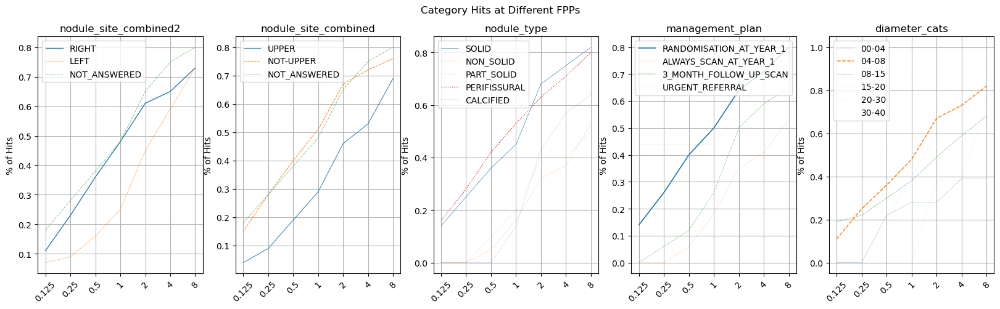

In [33]:
fig, ax = plt.subplots(1, 5, figsize=(20, 5))

nodule_characteristics = {
    'nodule_site_combined2': ['RIGHT', 'LEFT', 'NOT_ANSWERED'],
    'nodule_site_combined': ['UPPER','NOT-UPPER', 'NOT_ANSWERED'],
    'nodule_type': ['SOLID', 'NON_SOLID', 'PART_SOLID', 'PERIFISSURAL', 'CALCIFIED'],
    'management_plan': ['RANDOMISATION_AT_YEAR_1','ALWAYS_SCAN_AT_YEAR_1', '3_MONTH_FOLLOW_UP_SCAN', 'URGENT_REFERRAL'],
    'diameter_cats': diameter_lbs,
}

for ivx, (var, order) in enumerate(nodule_characteristics.items()):
    annotations = pd.read_csv(f'{workspace_path}/models/grt123/bbox_result/trained_summit/summit/{flavour}/{flavour}_metadata.csv')
    # annotations = annotations[annotations['management_plan'] != 'RANDOMISATION_AT_YEAR_1']

    total_vc = annotations[var].value_counts().sort_index().rename('Total Annotations')

    operating_points = ['0.125', '0.25', '0.5', '1', '2', '4', '8']

    results = []

    for idx, metadata in enumerate(missed_metadata):
        results.append(
            pd.crosstab(
                metadata[var], 
                metadata['miss'],
                normalize='index'
            )[False]
            .rename(f'{operating_points[idx]}')
            .reindex(order)
            
        )

    df = pd.concat(results, axis=1).fillna(0).round(2).merge(total_vc.to_frame(), left_index=True, right_index=True)

    display(df.T)


    line_styles = ['-', '--', '-.', ':', '-', '--', '-.']
    weights = df.pop('Total Annotations')

    for isx, column in enumerate(df.T):    
            ax[ivx].plot(df.T[column], label=column, linestyle=line_styles[isx], linewidth=weights[isx]/100)
    
    ax[ivx].set_xticklabels(labels=df.columns, rotation=45)
    ax[ivx].set_title(var)
    ax[ivx].legend()
    ax[ivx].set_ylabel('% of Hits')
    ax[ivx].grid(visible=True, which='both')

plt.suptitle('Category Hits at Different FPPs')
plt.show()

In [34]:
missed_at_lowest = missed_metadata[0]
hits = missed_at_lowest[missed_at_lowest['miss'] == False]

(
    pd.crosstab(
        [
            hits['diameter_cats'],
            hits['nodule_type']
        ], 
        hits['nodule_site_combined'],
        normalize='all'
    )[['UPPER','NOT-UPPER']]
    .apply(lambda x: round(100 * x, 1))
)

nodule_site_combined        UPPER  NOT-UPPER
diameter_cats nodule_type                   
04-08         PERIFISSURAL    9.5       23.8
              SOLID           0.0        4.8
08-15         PERIFISSURAL    0.0        4.8
              SOLID           4.8        9.5
20-30         SOLID           0.0        4.8
30-40         SOLID           0.0        4.8

In [35]:
thresholds = get_thresholds(grt123_summit_summit)

scans = pd.read_csv(f'{workspace_path}/metadata/summit/{flavour}/test_scans.csv')
predictions = pd.read_csv(f'{workspace_path}/models/grt123/bbox_result/trained_summit/summit/{flavour}/{flavour}_predictions.csv')
annotations = pd.read_csv(f'{workspace_path}/models/grt123/bbox_result/trained_summit/summit/{flavour}/{flavour}_metadata.csv')

false_positives_fpps = false_positive_analysis(
    thresholds=thresholds,    
    predictions=predictions,
    annotations=annotations
)

predictions: 41 at threshold: 7.1617875
distance false positives: 20 at threshold: 7.1617875
predictions: 79 at threshold: 6.8667235
distance false positives: 42 at threshold: 6.8667235
predictions: 146 at threshold: 6.406053
distance false positives: 89 at threshold: 6.406053
predictions: 247 at threshold: 6.0039
distance false positives: 171 at threshold: 6.0039
predictions: 445 at threshold: 5.4247413
distance false positives: 340 at threshold: 5.4247413
predictions: 805 at threshold: 4.62345
distance false positives: 687 at threshold: 4.62345
predictions: 1510 at threshold: 3.415341
distance false positives: 1375 at threshold: 3.415341


#### Examples of False Positives

None
[[138.755      157.94        83.79000305   2.26562405]]
summit-7472-cwh_Y0_BASELINE_A - 137.83809 157.71877 85.762535 11.574532
False Positive: True
IoU False Positive: 0.008905451229052633


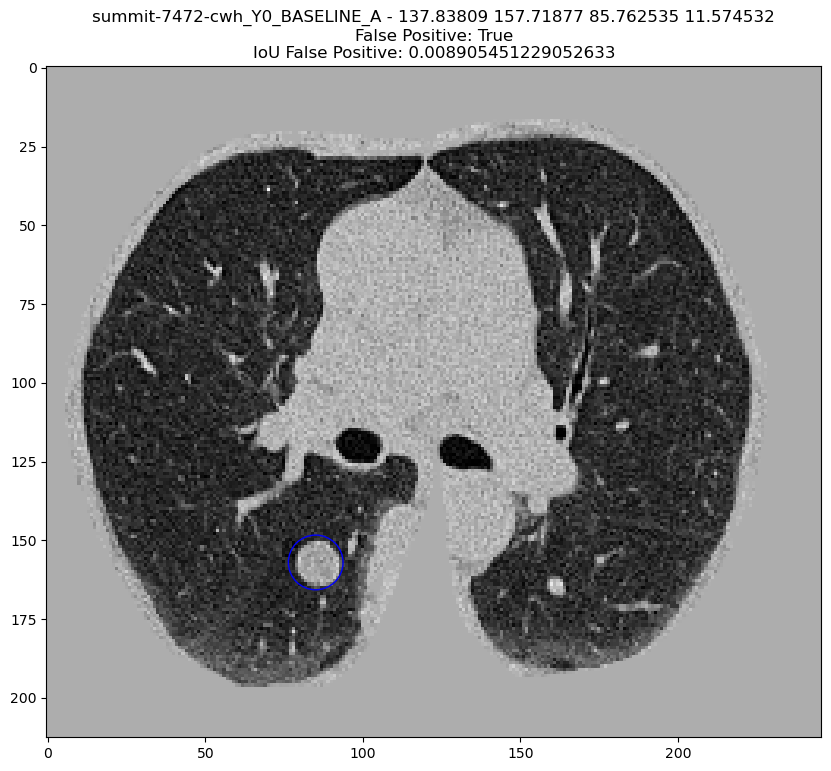

None
[[ 50.72       131.18       140.48        10.02421441]]
summit-5968-bsv_Y0_BASELINE_A - 149.37796 32.80975 62.243927 4.234077
False Positive: True
IoU False Positive: 0.0


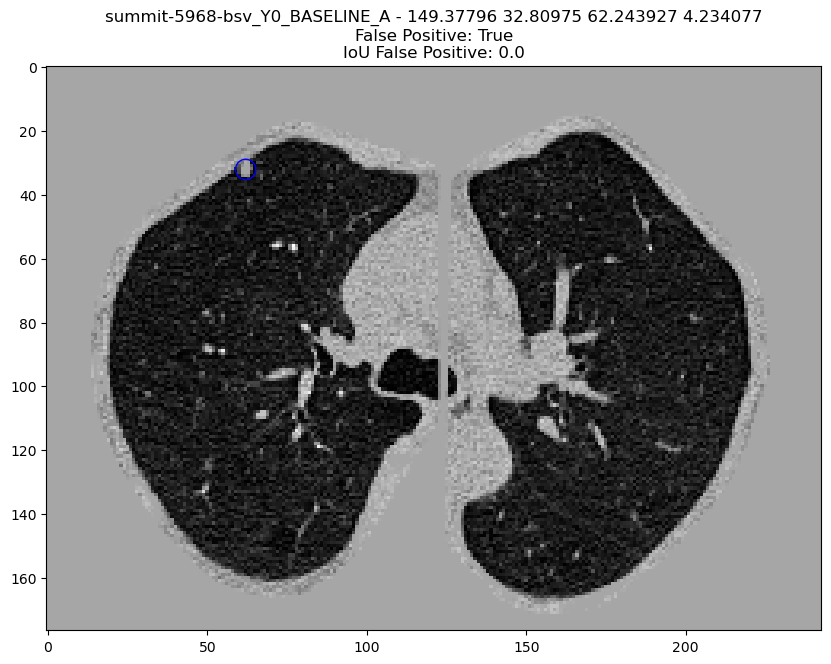

None
[[ 33.855      150.53        40.10999695   3.203125  ]
 [149.565      104.99       120.32999695   8.3921875 ]]
summit-7787-sdx_Y0_BASELINE_A - 68.20375 16.679007 38.57945 4.0822935
False Positive: True
IoU False Positive: 0.0


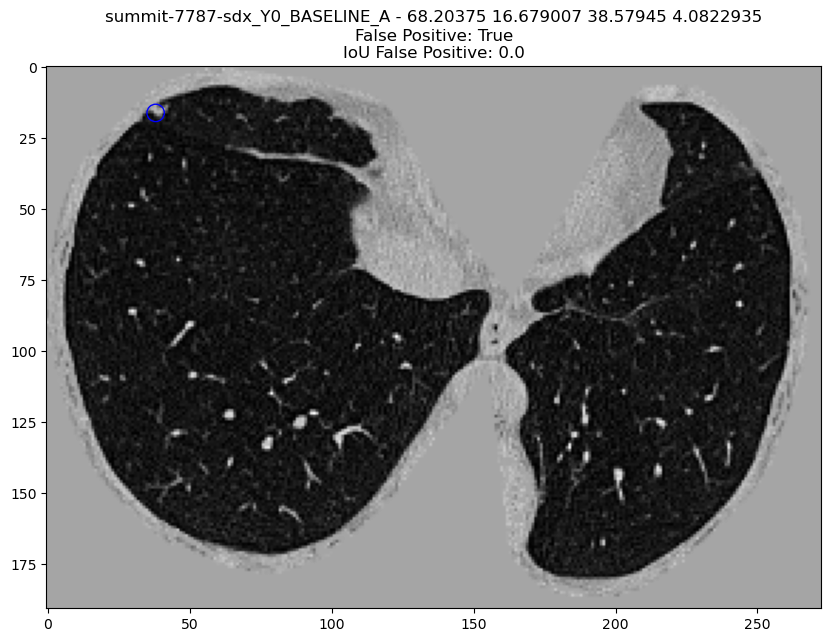

None
[[226.975      145.34       181.18000305   4.92284902]]
summit-7789-sfh_Y0_BASELINE_A - 96.98064 129.20308 264.70905 3.8758724
False Positive: True
IoU False Positive: 0.0


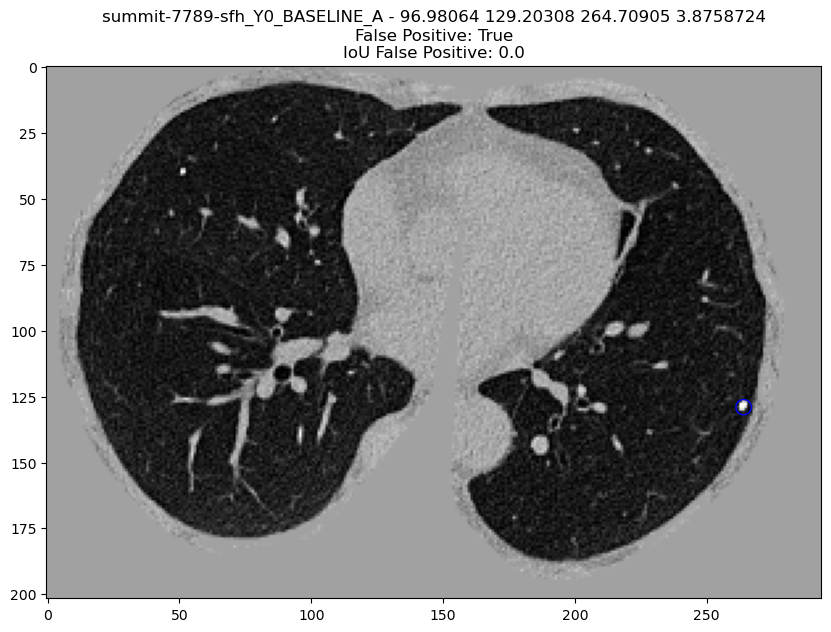

None
[[159.33       132.36       108.2299939    3.73242342]]
summit-6933-ckz_Y0_BASELINE_A - 60.092243 9.336255 80.774864 3.2743056
False Positive: True
IoU False Positive: 0.0


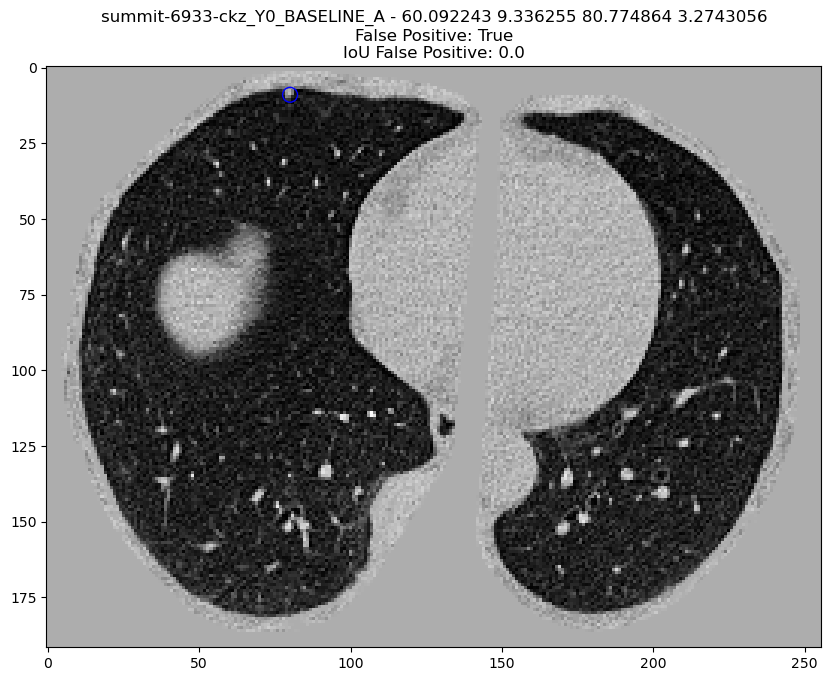

None
[[0 0 0 0]]
summit-9938-mxd_Y0_BASELINE_A - 228.6544 38.182446 194.82388 4.6697483
False Positive: True
IoU False Positive: nan


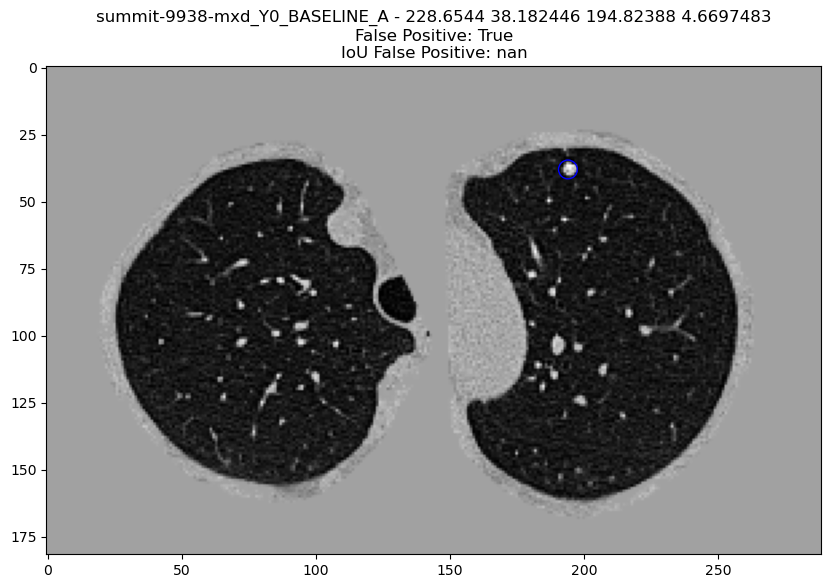

None
[[180.445       72.29        54.16999695   6.31152207]]
summit-5225-ncj_Y0_BASELINE_A - 86.12119 64.47107 237.70828 7.58824
False Positive: True
IoU False Positive: 0.0


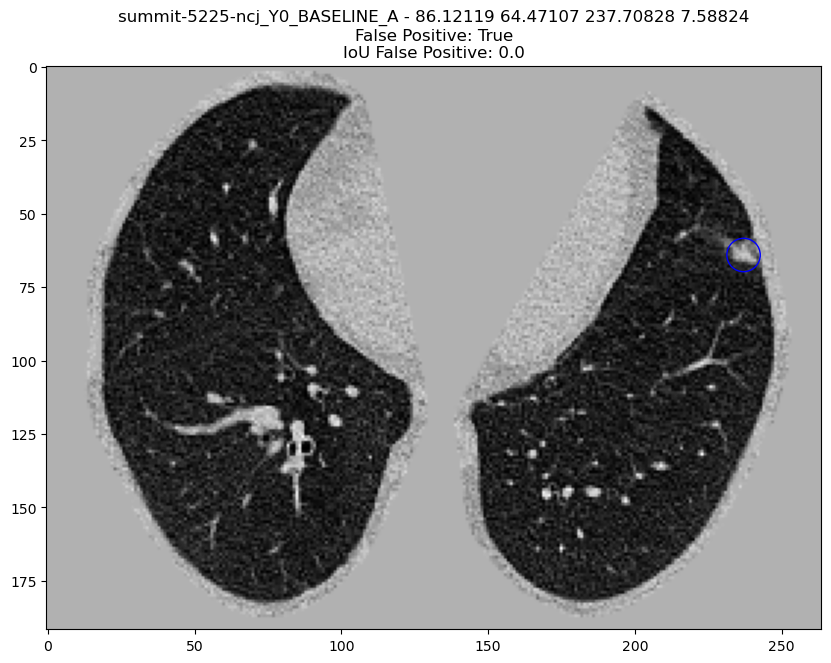

None
[[121.665      137.25999695 252.88999695   3.84882953]]
summit-8636-naw_Y0_BASELINE_A - 128.51929 46.08768 37.824142 5.1204867
False Positive: True
IoU False Positive: 0.0


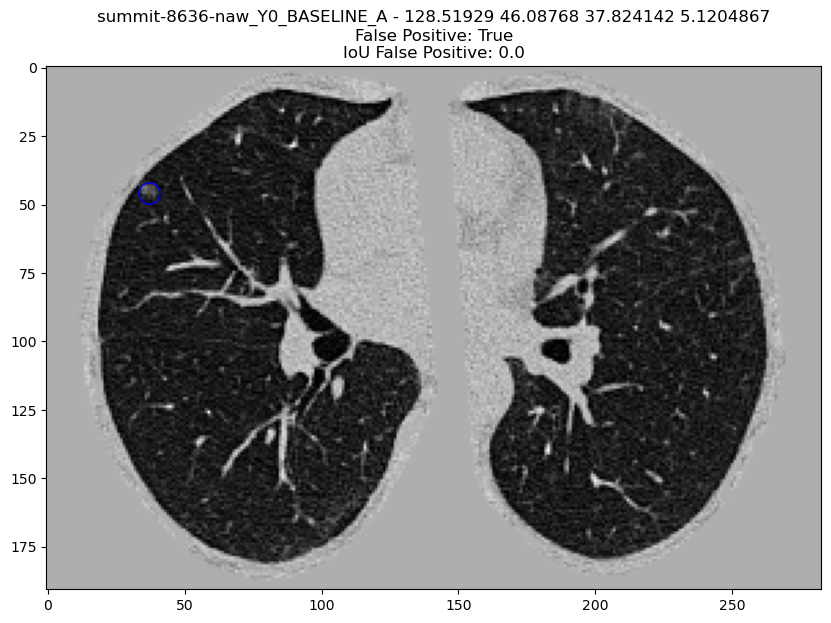

None
[[0 0 0 0]]
summit-2856-bzu_Y0_BASELINE_A - 54.57423 144.52544 81.12094 3.546598
False Positive: True
IoU False Positive: nan


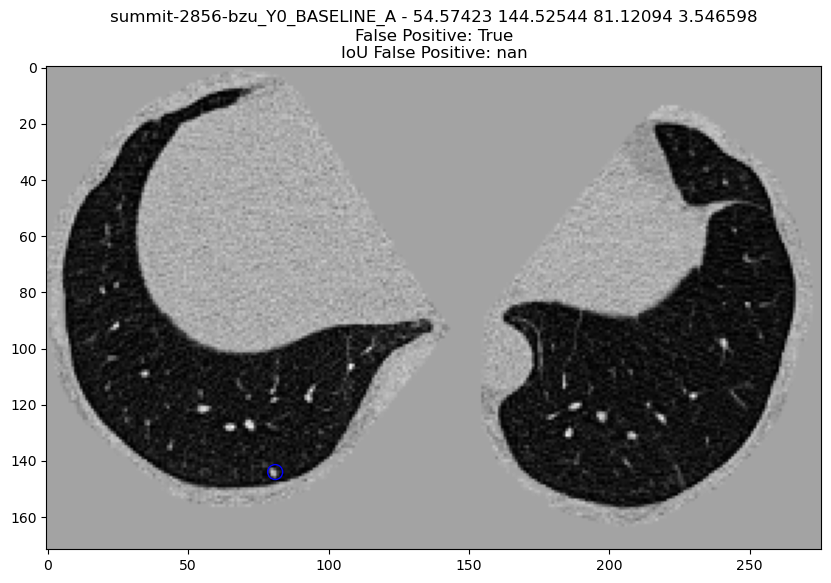

None
[[0 0 0 0]]
summit-5938-huw_Y0_BASELINE_A - 57.089237 122.35899 12.746154 4.693171
False Positive: True
IoU False Positive: nan


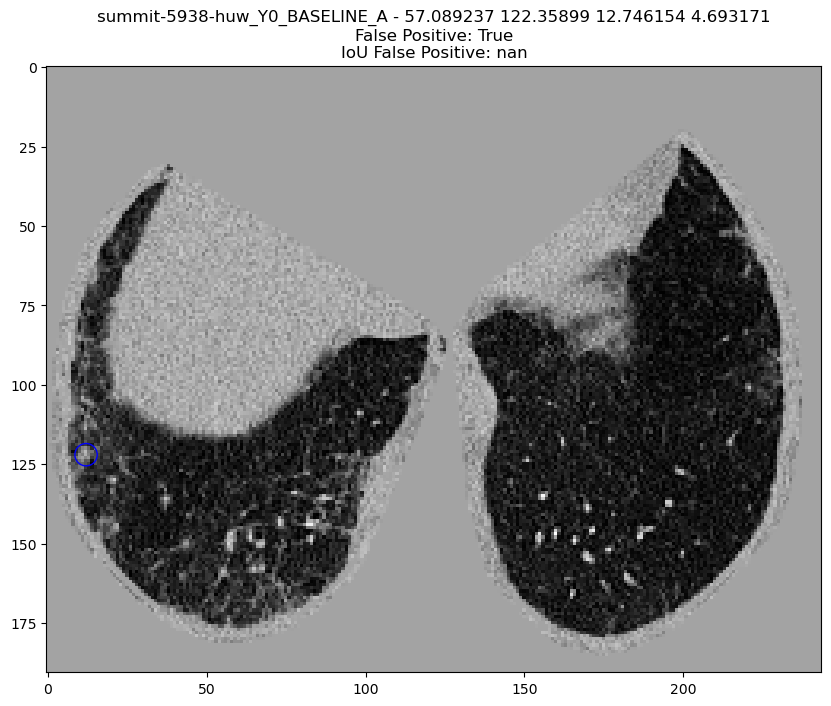

None
[[118.43        31.75        72.0799939    4.13046956]]
summit-4363-qbh_Y0_BASELINE_A - 180.42232 34.24243 193.91797 4.8590307
False Positive: True
IoU False Positive: 0.0


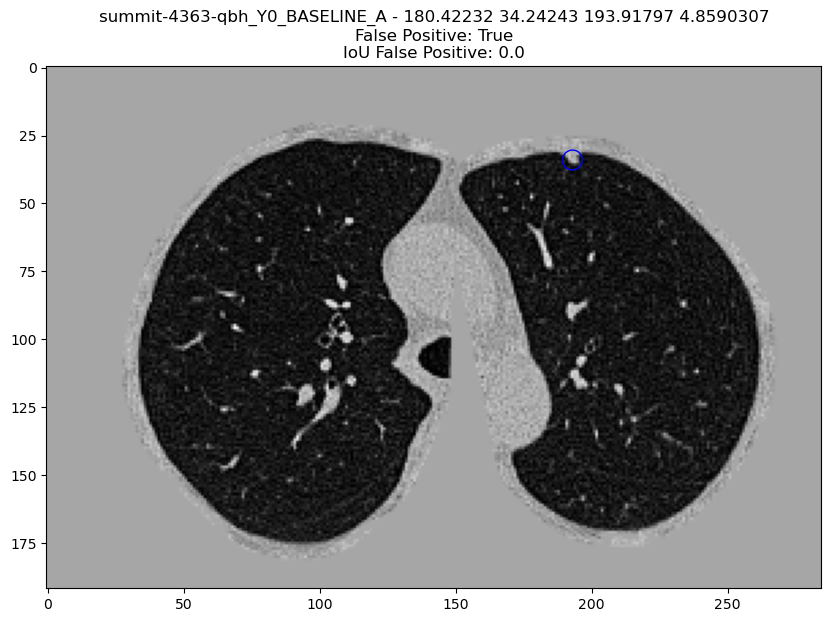

None
[[0 0 0 0]]
summit-2765-stn_Y0_BASELINE_A - 88.37396 14.113887 82.333466 3.8642187
False Positive: True
IoU False Positive: nan


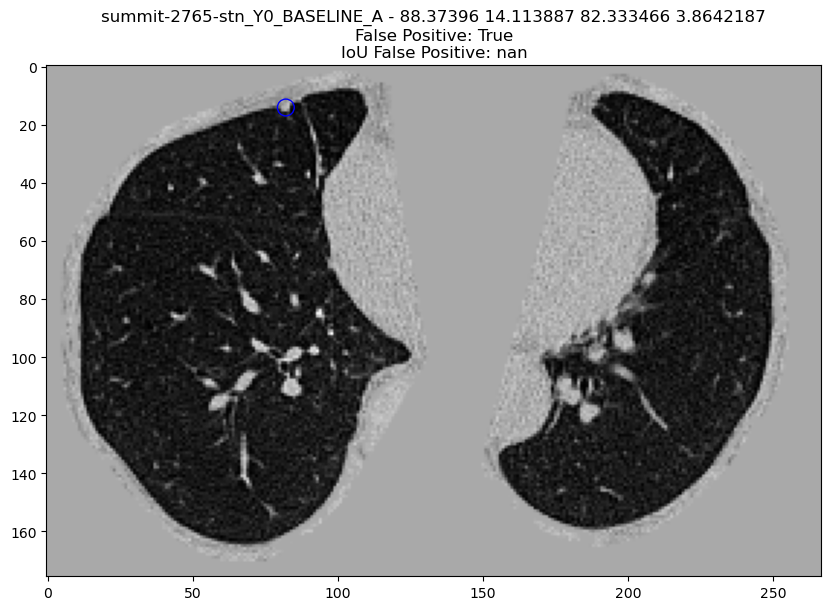

In [38]:
cnt = 0

df = false_positives_fpps['0.125']

for idx, row in df[df.distance_false_positive].sort_values(by='threshold', ascending=False).iterrows():
    study_id = row['name']
    x = row['row']
    y = row['col']
    z = row['index']
    diameter = row['diameter']
    

    copy_numpy_from_cluster(study_id)
    show_numpy_candidate_location(study_id, x, y, z, diameter, row.distance_false_positive, row.iou_false_positive)
    cnt+=1
    if cnt == 12:
        break

## MONAI Detection

/Users/john/Projects/SOTAEvaluationNoduleDetection/models/detection/result/trained_summit/summit/balanced_female_for_inference/result_balanced_female_for_inference.json
/Users/john/Projects/SOTAEvaluationNoduleDetection/models/detection/result/trained_summit/summit/balanced_female_for_inference/annotations.csv
Total number of included nodule annotations: 180
Total number of nodule annotations: 180
Cases: 172


100%|██████████| 1000/1000 [00:03<00:00, 278.99it/s]


,0,159,476,1111,2381,4920,9999
0,0.194 (0.103 - 0.319),0.328 (0.245 - 0.408),0.469 (0.36 - 0.571),0.614 (0.539 - 0.693),0.722 (0.645 - 0.792),0.785 (0.72 - 0.846),0.884 (0.831 - 0.932)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.194,0.103,0.319
159,0.250,0.328,0.245,0.408
476,0.500,0.469,0.360,0.571
1111,1.000,0.614,0.539,0.693
2381,2.000,0.722,0.645,0.792
4920,4.000,0.785,0.720,0.846
9999,8.000,0.884,0.831,0.932


Mean Sensitivity: 0.57 Low Sensitivity: 0.49 High Sensitivity: 0.652


,True positives,165
0,False positives,3246.000
1,False negatives,15.000
2,True negatives,0.000
3,Total number of candidates,3492.000
4,Total number of nodules,180.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,81.000
7,Sensitivity,0.917
8,Average number of candidates per scan,20.302


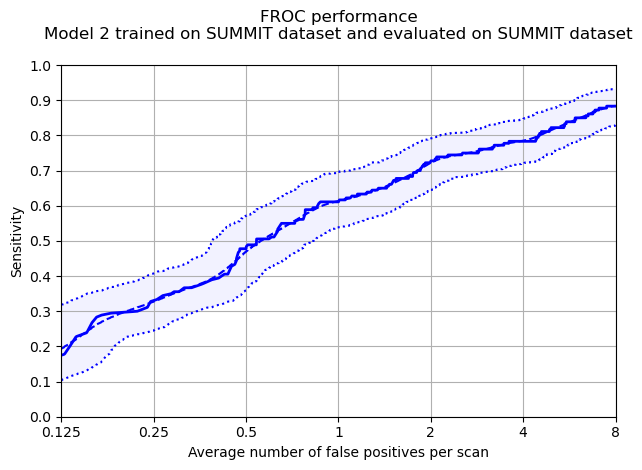

In [39]:

detection_predictions_path = combine_predictions(f'{workspace_path}/models/detection/result/trained_summit/summit/{flavour}', 'test')
detection_predictions = pd.read_csv(detection_predictions_path)

annotations = (
    pd.read_csv(f'{workspace_path}/metadata/summit/{flavour}/test_metadata.csv')
    .assign(name=lambda df: df.participant_id + '_Y0_BASELINE_A')
    .assign(row=lambda df: df['nodule_x_coordinate'])
    .assign(col=lambda df: df['nodule_y_coordinate'])
    .assign(index=lambda df: df['nodule_z_coordinate'])
    .assign(diameter=lambda df: df['nodule_diameter_mm'])
    .assign(diameter_cats=lambda df: pd.cut(
        df['nodule_diameter_mm'],
        bins=diameter_cats,
        labels=diameter_lbs
    ))
    .assign(nodule_site_combined=lambda df: df['nodule_site'].apply(combine_site))
    .assign(nodule_site_combined2=lambda df: df['nodule_site'].apply(combine_site2))
)

annotations.to_csv(f'{workspace_path}/models/detection/result/trained_summit/summit/{flavour}/annotations.csv', index=False)

detection_summit_summit = noduleCADEvaluation(
    annotations_filename=f'{workspace_path}/models/detection/result/trained_summit/summit/{flavour}/annotations.csv',
    annotations_excluded_filename=f'{workspace_path}/data/summit/metadata/annotations_excluded_empty.csv',
    seriesuids_filename=f'{workspace_path}/metadata/summit/{flavour}/test_scans.csv',
    results_filename=detection_predictions_path,
    filter='\nModel 2 trained on SUMMIT dataset and evaluated on SUMMIT dataset\n',
    outputDir=f'{workspace_path}/results/detection/trained_summit/summit/{flavour}',
)
caluclate_cpm_from_bootstrapping(f'{workspace_path}/results/detection/trained_summit/summit/{flavour}/froc_predictions_bootstrapping.csv')
show_metrics(f'{workspace_path}/results/detection/trained_summit/summit/{flavour}/CADAnalysis.txt')


### Gender analysis

Protected Group: FEMALE


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,24.0,52.0,6.0,11.0,8.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpr6w43005/annotations.csv
Total number of included nodule annotations: 179
Total number of nodule annotations: 179
Cases: 170


100%|██████████| 1000/1000 [00:03<00:00, 275.98it/s]


,0,159,476,1111,2381,4920,9999
0,0.204 (0.098 - 0.328),0.337 (0.252 - 0.419),0.474 (0.359 - 0.583),0.615 (0.53 - 0.702),0.725 (0.642 - 0.802),0.785 (0.719 - 0.851),0.884 (0.828 - 0.934)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.204,0.098,0.328
159,0.250,0.337,0.252,0.419
476,0.500,0.474,0.359,0.583
1111,1.000,0.615,0.530,0.702
2381,2.000,0.725,0.642,0.802
4920,4.000,0.785,0.719,0.851
9999,8.000,0.884,0.828,0.934


Mean Sensitivity: 0.57 Low Sensitivity: 0.49 High Sensitivity: 0.66


,True positives,164
0,False positives,3223.000
1,False negatives,15.000
2,True negatives,0.000
3,Total number of candidates,3468.000
4,Total number of nodules,179.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,81.000
7,Sensitivity,0.916
8,Average number of candidates per scan,20.400


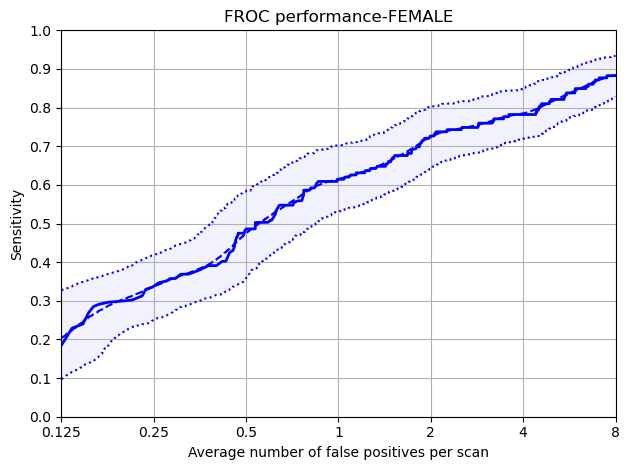

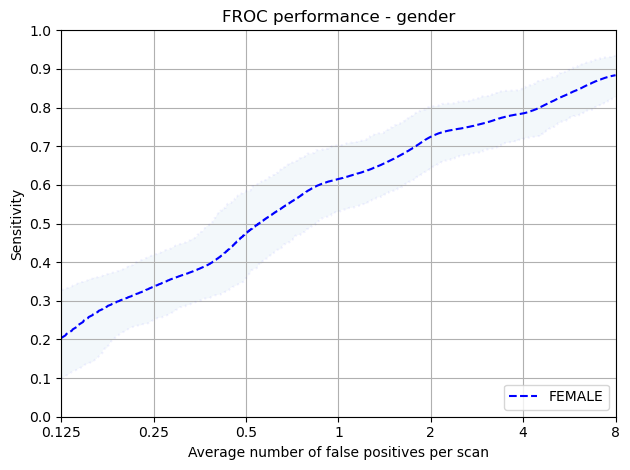

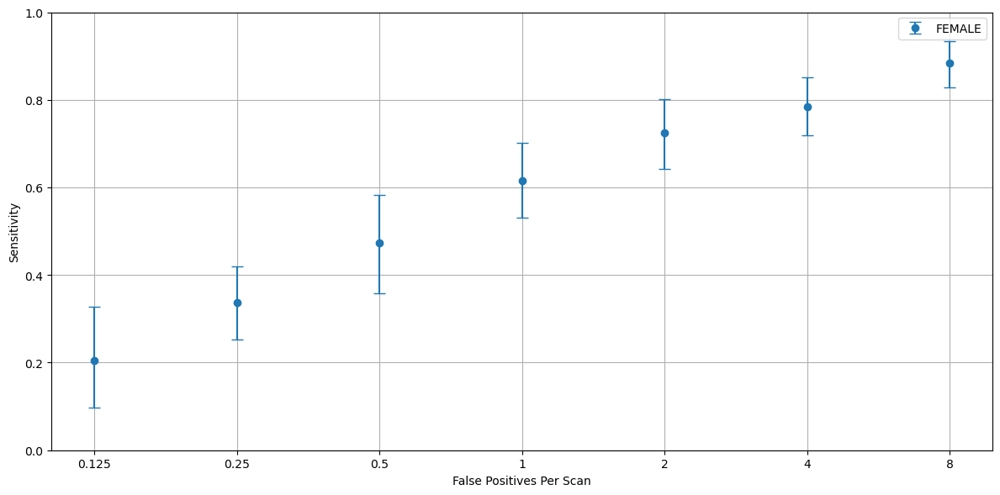

In [40]:


annotations = pd.read_csv(f'{workspace_path}/models/detection/result/trained_summit/summit/{flavour}/annotations.csv')

predictions = pd.read_csv(detection_predictions_path)

protected_group = 'gender'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/detection/trained_summit/summit/{flavour}/{protected_group}'
)
display_plots_with_error_bars('detection', flavour, 'Gender', data_dict)

### Age analysis

Protected Group: 60-64


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,15.0,51.0,12.0,10.0,12.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmptur4afng/annotations.csv
Total number of included nodule annotations: 41
Total number of nodule annotations: 41
Cases: 40


100%|██████████| 1000/1000 [00:01<00:00, 864.32it/s]


,0,159,476,1111,2381,4920,9999
0,0.089 (0.0 - 0.276),0.197 (0.057 - 0.356),0.356 (0.196 - 0.543),0.544 (0.368 - 0.72),0.688 (0.514 - 0.861),0.789 (0.6 - 0.938),0.878 (0.788 - 0.967)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.089,0.000,0.276
159,0.250,0.197,0.057,0.356
476,0.500,0.356,0.196,0.543
1111,1.000,0.544,0.368,0.720
2381,2.000,0.688,0.514,0.861
4920,4.000,0.789,0.600,0.938
9999,8.000,0.878,0.788,0.967


Mean Sensitivity: 0.51 Low Sensitivity: 0.36 High Sensitivity: 0.666


,True positives,39
0,False positives,683.000
1,False negatives,2.000
2,True negatives,0.000
3,Total number of candidates,740.000
4,Total number of nodules,41.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,18.000
7,Sensitivity,0.951
8,Average number of candidates per scan,18.500


Protected Group: 75+


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,17.0,8.0,25.0,42.0,8.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpiypw5i7r/annotations.csv
Total number of included nodule annotations: 12
Total number of nodule annotations: 12
Cases: 7


100%|██████████| 1000/1000 [00:00<00:00, 1444.27it/s]


,0,159,476,1111,2381,4920,9999
0,0.13 (0.0 - 0.5),0.244 (0.0 - 0.647),0.401 (0.0 - 0.769),0.509 (0.167 - 0.889),0.653 (0.312 - 0.923),0.727 (0.467 - 0.933),0.818 (0.625 - 1.0)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.130,0.000,0.500
159,0.250,0.244,0.000,0.647
476,0.500,0.401,0.000,0.769
1111,1.000,0.509,0.167,0.889
2381,2.000,0.653,0.312,0.923
4920,4.000,0.727,0.467,0.933
9999,8.000,0.818,0.625,1.000


Mean Sensitivity: 0.5 Low Sensitivity: 0.22 High Sensitivity: 0.809


,True positives,10
0,False positives,195.000
1,False negatives,2.000
2,True negatives,0.000
3,Total number of candidates,218.000
4,Total number of nodules,12.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,13.000
7,Sensitivity,0.833
8,Average number of candidates per scan,31.143


Protected Group: 55-59


,SOLID,PERIFISSURAL,NON_SOLID,CALCIFIED
nodule_type,21.0,72.0,5.0,3.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpdlac_qy_/annotations.csv
Total number of included nodule annotations: 39
Total number of nodule annotations: 39
Cases: 56


100%|██████████| 1000/1000 [00:01<00:00, 650.44it/s]


,0,159,476,1111,2381,4920,9999
0,0.279 (0.114 - 0.512),0.448 (0.267 - 0.645),0.582 (0.405 - 0.786),0.672 (0.52 - 0.833),0.789 (0.625 - 0.926),0.834 (0.667 - 0.968),0.897 (0.756 - 1.0)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.279,0.114,0.512
159,0.250,0.448,0.267,0.645
476,0.500,0.582,0.405,0.786
1111,1.000,0.672,0.520,0.833
2381,2.000,0.789,0.625,0.926
4920,4.000,0.834,0.667,0.968
9999,8.000,0.897,0.756,1.000


Mean Sensitivity: 0.64 Low Sensitivity: 0.48 High Sensitivity: 0.81


,True positives,36
0,False positives,889.000
1,False negatives,3.000
2,True negatives,0.000
3,Total number of candidates,932.000
4,Total number of nodules,39.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,7.000
7,Sensitivity,0.923
8,Average number of candidates per scan,16.643


Protected Group: 70-75


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,34.0,46.0,3.0,14.0,3.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpxnza35gz/annotations.csv
Total number of included nodule annotations: 35
Total number of nodule annotations: 35
Cases: 33


100%|██████████| 1000/1000 [00:01<00:00, 887.30it/s]


,0,159,476,1111,2381,4920,9999
0,0.191 (0.028 - 0.5),0.346 (0.073 - 0.562),0.442 (0.243 - 0.667),0.645 (0.432 - 0.833),0.683 (0.533 - 0.837),0.71 (0.543 - 0.879),0.795 (0.657 - 0.929)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.191,0.028,0.500
159,0.250,0.346,0.073,0.562
476,0.500,0.442,0.243,0.667
1111,1.000,0.645,0.432,0.833
2381,2.000,0.683,0.533,0.837
4920,4.000,0.710,0.543,0.879
9999,8.000,0.795,0.657,0.929


Mean Sensitivity: 0.54 Low Sensitivity: 0.36 High Sensitivity: 0.744


,True positives,29
0,False positives,659.000
1,False negatives,6.000
2,True negatives,0.000
3,Total number of candidates,700.000
4,Total number of nodules,35.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,12.000
7,Sensitivity,0.829
8,Average number of candidates per scan,21.212


Protected Group: 65-69


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,29.0,52.0,2.0,6.0,12.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpukoe85yl/annotations.csv
Total number of included nodule annotations: 52
Total number of nodule annotations: 52
Cases: 38


100%|██████████| 1000/1000 [00:01<00:00, 798.83it/s]


,0,159,476,1111,2381,4920,9999
0,0.344 (0.175 - 0.514),0.439 (0.261 - 0.676),0.58 (0.373 - 0.754),0.68 (0.5 - 0.825),0.786 (0.647 - 0.897),0.831 (0.744 - 0.921),0.934 (0.817 - 1.0)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.344,0.175,0.514
159,0.250,0.439,0.261,0.676
476,0.500,0.580,0.373,0.754
1111,1.000,0.680,0.500,0.825
2381,2.000,0.786,0.647,0.897
4920,4.000,0.831,0.744,0.921
9999,8.000,0.934,0.817,1.000


Mean Sensitivity: 0.66 Low Sensitivity: 0.5 High Sensitivity: 0.798


,True positives,50
0,False positives,797.000
1,False negatives,2.000
2,True negatives,0.000
3,Total number of candidates,878.000
4,Total number of nodules,52.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,31.000
7,Sensitivity,0.962
8,Average number of candidates per scan,23.105


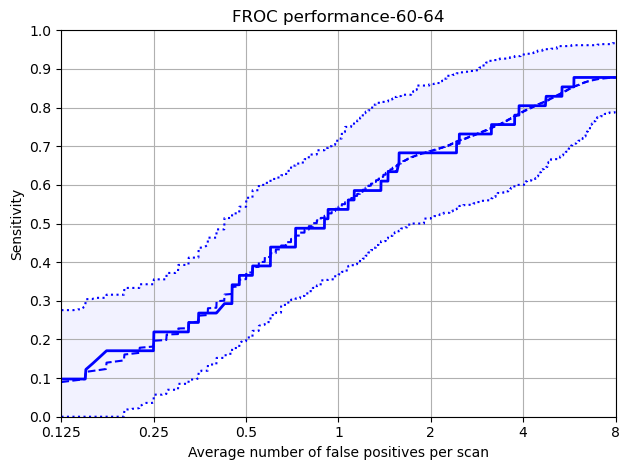

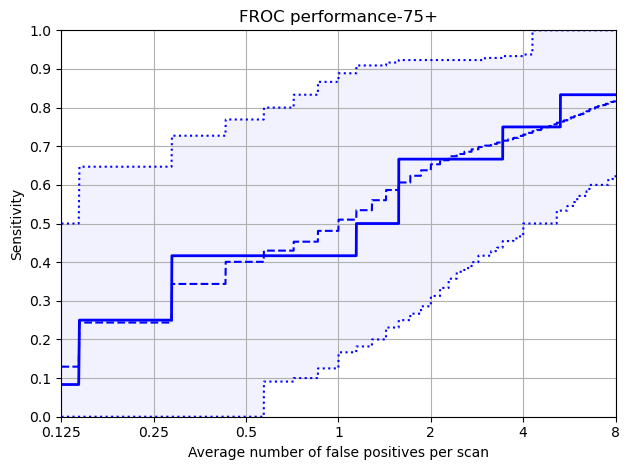

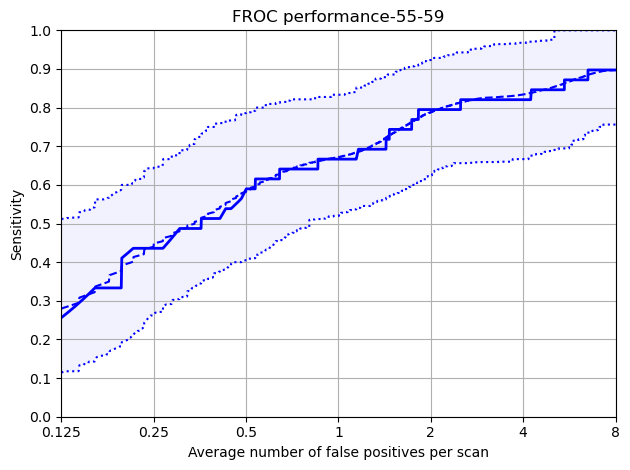

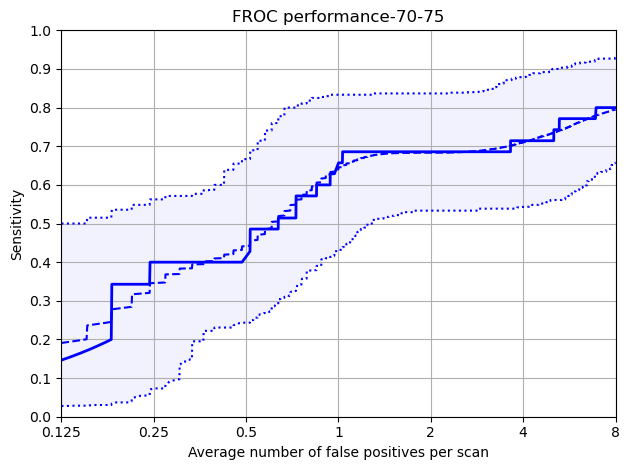

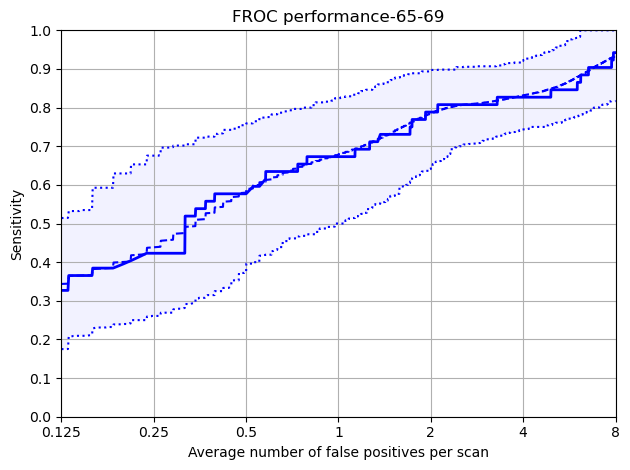

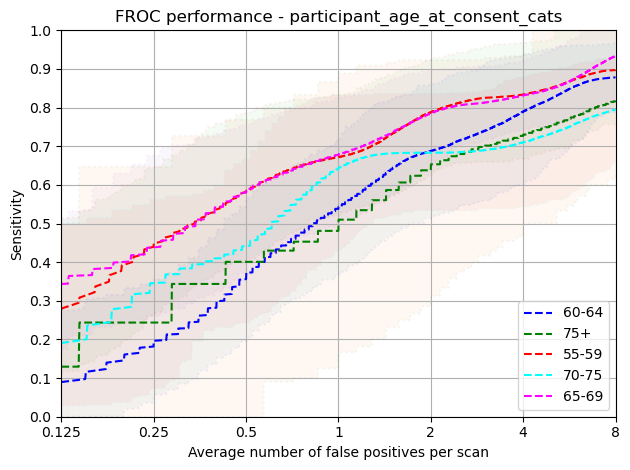

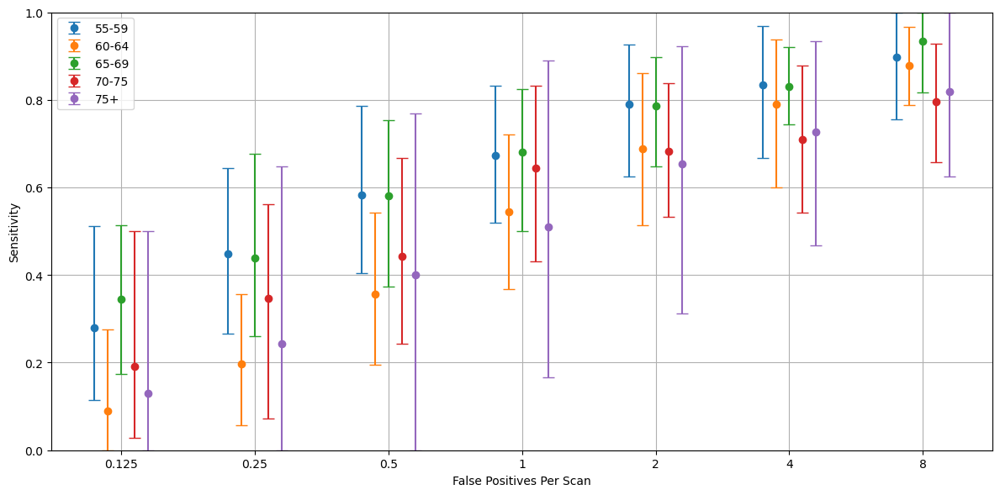

In [41]:
protected_group = 'participant_age_at_consent_cats'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/detection/trained_summit/summit/{flavour}/{protected_group}'
)
display_plots_with_error_bars('detection', flavour, 'Age', data_dict, ['55-59','60-64','65-69','70-75','75+'])

### Ethnicity Analysis

Protected Group: Black


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,23.0,64.0,5.0,2.0,7.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpe4ubfpix/annotations.csv
Total number of included nodule annotations: 44
Total number of nodule annotations: 44
Cases: 56


100%|██████████| 1000/1000 [00:01<00:00, 757.77it/s]


,0,159,476,1111,2381,4920,9999
0,0.482 (0.243 - 0.679),0.615 (0.428 - 0.806),0.761 (0.574 - 0.902),0.8 (0.65 - 0.929),0.886 (0.773 - 0.973),0.913 (0.838 - 0.98),0.951 (0.868 - 1.0)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.482,0.243,0.679
159,0.250,0.615,0.428,0.806
476,0.500,0.761,0.574,0.902
1111,1.000,0.800,0.650,0.929
2381,2.000,0.886,0.773,0.973
4920,4.000,0.913,0.838,0.980
9999,8.000,0.951,0.868,1.000


Mean Sensitivity: 0.77 Low Sensitivity: 0.62 High Sensitivity: 0.896


,True positives,42
0,False positives,817.000
1,False negatives,2.000
2,True negatives,0.000
3,Total number of candidates,871.000
4,Total number of nodules,44.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,12.000
7,Sensitivity,0.955
8,Average number of candidates per scan,15.554


Protected Group: White


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,26.0,47.0,6.0,12.0,9.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpvxbeu7ge/annotations.csv
Total number of included nodule annotations: 78
Total number of nodule annotations: 78
Cases: 58


100%|██████████| 1000/1000 [00:01<00:00, 570.10it/s]


,0,159,476,1111,2381,4920,9999
0,0.119 (0.017 - 0.277),0.263 (0.115 - 0.388),0.392 (0.258 - 0.563),0.555 (0.432 - 0.689),0.661 (0.533 - 0.797),0.733 (0.622 - 0.847),0.828 (0.716 - 0.925)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.119,0.017,0.277
159,0.250,0.263,0.115,0.388
476,0.500,0.392,0.258,0.563
1111,1.000,0.555,0.432,0.689
2381,2.000,0.661,0.533,0.797
4920,4.000,0.733,0.622,0.847
9999,8.000,0.828,0.716,0.925


Mean Sensitivity: 0.51 Low Sensitivity: 0.38 High Sensitivity: 0.641


,True positives,72
0,False positives,1329.000
1,False negatives,6.000
2,True negatives,0.000
3,Total number of candidates,1432.000
4,Total number of nodules,78.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,31.000
7,Sensitivity,0.923
8,Average number of candidates per scan,24.690


Protected Group: Asian or Asian British


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,23.0,49.0,5.0,16.0,7.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpt7_5cxzo/annotations.csv
Total number of included nodule annotations: 57
Total number of nodule annotations: 57
Cases: 58


100%|██████████| 1000/1000 [00:01<00:00, 682.91it/s]


,0,159,476,1111,2381,4920,9999
0,0.142 (0.027 - 0.293),0.22 (0.098 - 0.353),0.334 (0.17 - 0.518),0.517 (0.377 - 0.653),0.646 (0.531 - 0.772),0.772 (0.667 - 0.887),0.86 (0.75 - 0.955)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.142,0.027,0.293
159,0.250,0.220,0.098,0.353
476,0.500,0.334,0.170,0.518
1111,1.000,0.517,0.377,0.653
2381,2.000,0.646,0.531,0.772
4920,4.000,0.772,0.667,0.887
9999,8.000,0.860,0.750,0.955


Mean Sensitivity: 0.5 Low Sensitivity: 0.37 High Sensitivity: 0.633


,True positives,50
0,False positives,1077.000
1,False negatives,7.000
2,True negatives,0.000
3,Total number of candidates,1165.000
4,Total number of nodules,57.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,38.000
7,Sensitivity,0.877
8,Average number of candidates per scan,20.086


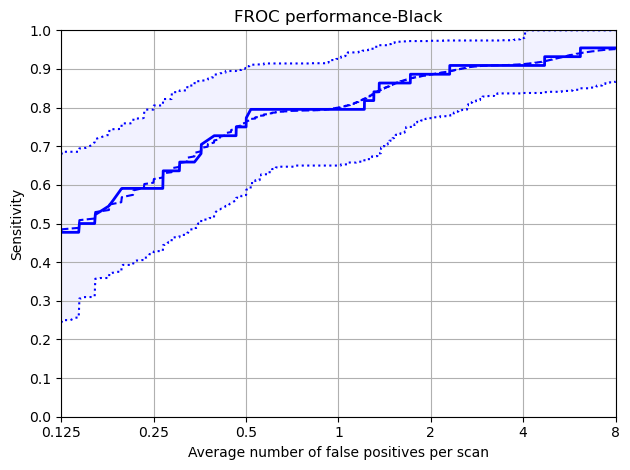

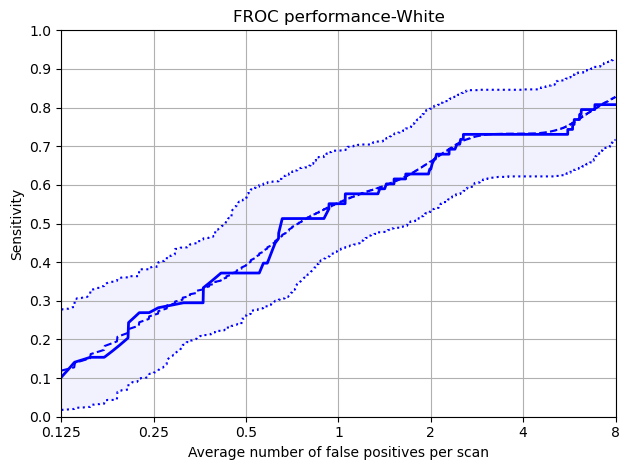

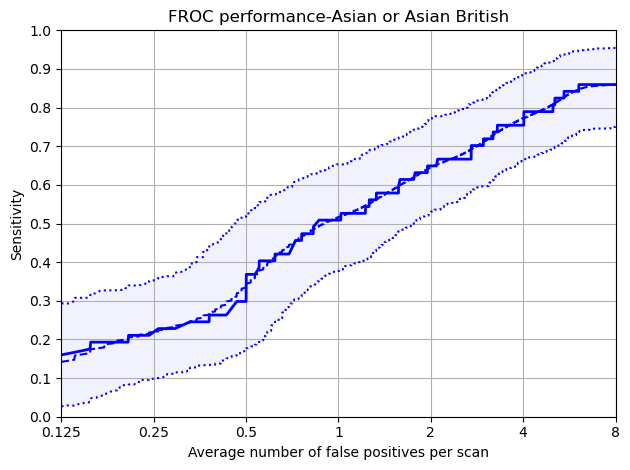

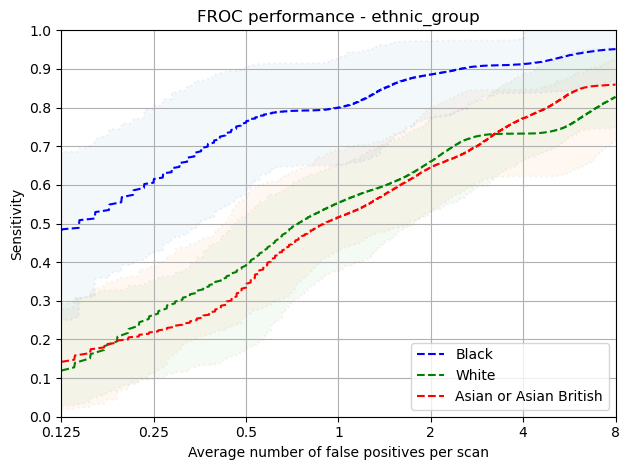

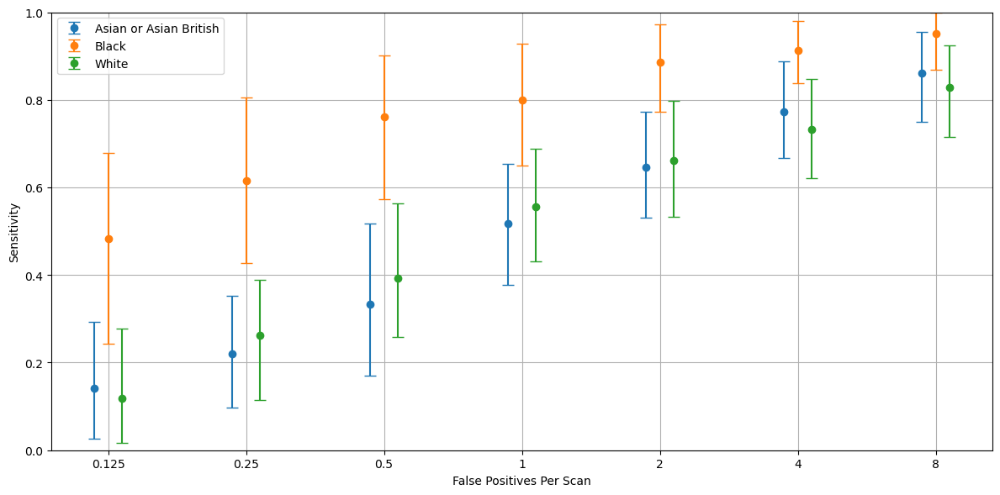

In [42]:
protected_group = 'ethnic_group'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/detection/trained_summit/summit/{flavour}/{protected_group}'
)
display_plots_with_error_bars('detection', flavour,'Ethnic Group', data_dict, order=['Asian or Asian British','Black','White'])

### IMDRank_tertile

Protected Group: High


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,31.0,40.0,5.0,19.0,5.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpv5odxkr_/annotations.csv
Total number of included nodule annotations: 42
Total number of nodule annotations: 42
Cases: 44


100%|██████████| 1000/1000 [00:01<00:00, 830.68it/s]


,0,159,476,1111,2381,4920,9999
0,0.147 (0.0 - 0.429),0.351 (0.122 - 0.58),0.506 (0.311 - 0.692),0.609 (0.466 - 0.769),0.671 (0.538 - 0.806),0.703 (0.568 - 0.853),0.829 (0.675 - 0.946)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.147,0.000,0.429
159,0.250,0.351,0.122,0.580
476,0.500,0.506,0.311,0.692
1111,1.000,0.609,0.466,0.769
2381,2.000,0.671,0.538,0.806
4920,4.000,0.703,0.568,0.853
9999,8.000,0.829,0.675,0.946


Mean Sensitivity: 0.55 Low Sensitivity: 0.38 High Sensitivity: 0.725


,True positives,37
0,False positives,789.000
1,False negatives,5.000
2,True negatives,0.000
3,Total number of candidates,846.000
4,Total number of nodules,42.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,20.000
7,Sensitivity,0.881
8,Average number of candidates per scan,19.227


Protected Group: Medium


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,23.0,43.0,8.0,13.0,12.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp0ipj0hti/annotations.csv
Total number of included nodule annotations: 60
Total number of nodule annotations: 60
Cases: 54


100%|██████████| 1000/1000 [00:01<00:00, 678.65it/s]


,0,159,476,1111,2381,4920,9999
0,0.255 (0.091 - 0.417),0.29 (0.159 - 0.444),0.411 (0.222 - 0.627),0.596 (0.462 - 0.736),0.729 (0.603 - 0.855),0.787 (0.667 - 0.909),0.9 (0.806 - 0.978)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.255,0.091,0.417
159,0.250,0.290,0.159,0.444
476,0.500,0.411,0.222,0.627
1111,1.000,0.596,0.462,0.736
2381,2.000,0.729,0.603,0.855
4920,4.000,0.787,0.667,0.909
9999,8.000,0.900,0.806,0.978


Mean Sensitivity: 0.57 Low Sensitivity: 0.43 High Sensitivity: 0.709


,True positives,56
0,False positives,1090.000
1,False negatives,4.000
2,True negatives,0.000
3,Total number of candidates,1180.000
4,Total number of nodules,60.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,34.000
7,Sensitivity,0.933
8,Average number of candidates per scan,21.852


Protected Group: Low


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,21.0,64.0,4.0,4.0,7.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp2on6iv27/annotations.csv
Total number of included nodule annotations: 75
Total number of nodule annotations: 75
Cases: 68


100%|██████████| 1000/1000 [00:01<00:00, 596.90it/s]


,0,159,476,1111,2381,4920,9999
0,0.157 (0.032 - 0.341),0.327 (0.177 - 0.491),0.504 (0.341 - 0.67),0.63 (0.5 - 0.754),0.754 (0.629 - 0.863),0.831 (0.746 - 0.91),0.891 (0.795 - 0.962)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.157,0.032,0.341
159,0.250,0.327,0.177,0.491
476,0.500,0.504,0.341,0.670
1111,1.000,0.630,0.500,0.754
2381,2.000,0.754,0.629,0.863
4920,4.000,0.831,0.746,0.910
9999,8.000,0.891,0.795,0.962


Mean Sensitivity: 0.58 Low Sensitivity: 0.46 High Sensitivity: 0.713


,True positives,69
0,False positives,1292.000
1,False negatives,6.000
2,True negatives,0.000
3,Total number of candidates,1388.000
4,Total number of nodules,75.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,27.000
7,Sensitivity,0.920
8,Average number of candidates per scan,20.412


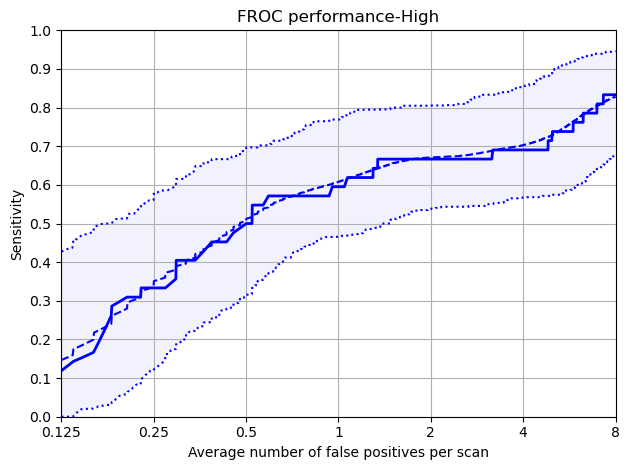

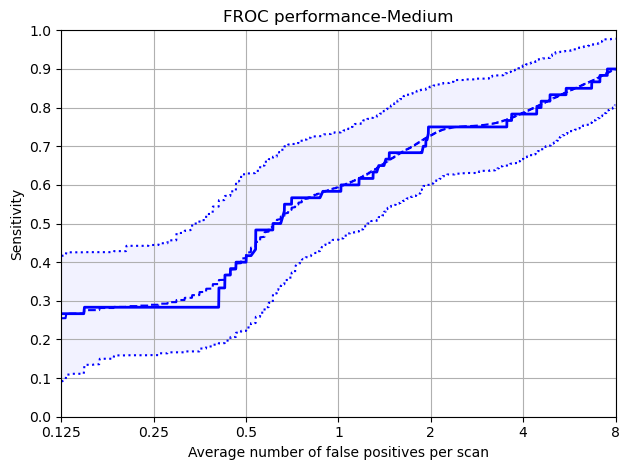

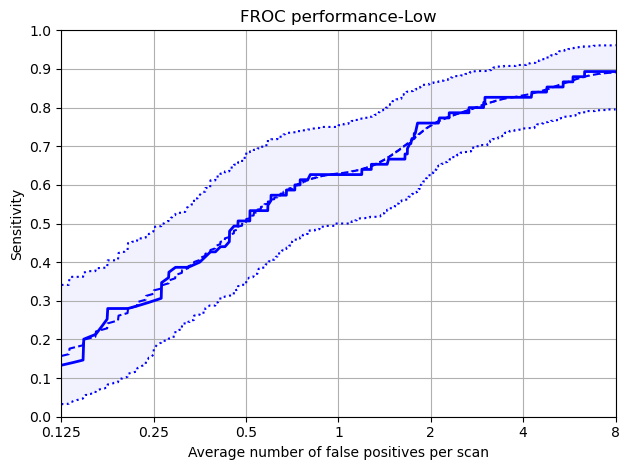

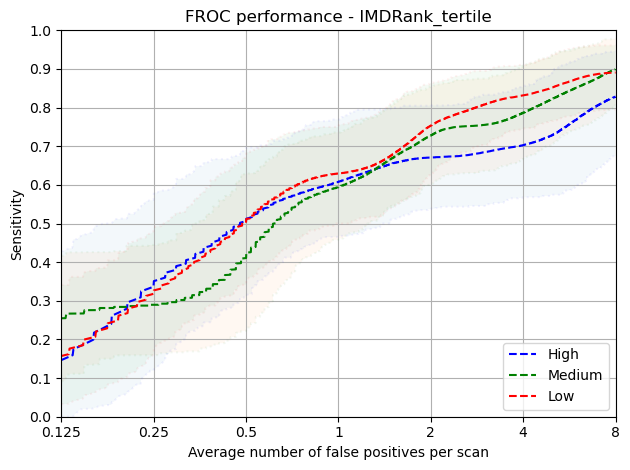

In [43]:
protected_group = 'IMDRank_tertile'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/detection/trained_summit/summit/{flavour}/{protected_group}'
)

### Smoking Pack Years


Protected Group: Medium (35-50)


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,30.0,52.0,5.0,5.0,9.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpdjfw4nr5/annotations.csv
Total number of included nodule annotations: 64
Total number of nodule annotations: 64
Cases: 64


100%|██████████| 1000/1000 [00:01<00:00, 633.71it/s]


,0,159,476,1111,2381,4920,9999
0,0.157 (0.044 - 0.355),0.325 (0.151 - 0.48),0.462 (0.311 - 0.647),0.617 (0.462 - 0.766),0.727 (0.579 - 0.862),0.839 (0.724 - 0.939),0.901 (0.803 - 0.98)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.157,0.044,0.355
159,0.250,0.325,0.151,0.480
476,0.500,0.462,0.311,0.647
1111,1.000,0.617,0.462,0.766
2381,2.000,0.727,0.579,0.862
4920,4.000,0.839,0.724,0.939
9999,8.000,0.901,0.803,0.980


Mean Sensitivity: 0.58 Low Sensitivity: 0.44 High Sensitivity: 0.718


,True positives,58
0,False positives,1197.000
1,False negatives,6.000
2,True negatives,0.000
3,Total number of candidates,1287.000
4,Total number of nodules,64.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,32.000
7,Sensitivity,0.906
8,Average number of candidates per scan,20.109


Protected Group: Low (15-35)


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,24.0,63.0,4.0,7.0,3.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpsqc3if2i/annotations.csv
Total number of included nodule annotations: 76
Total number of nodule annotations: 76
Cases: 77


100%|██████████| 1000/1000 [00:01<00:00, 549.65it/s]


,0,159,476,1111,2381,4920,9999
0,0.273 (0.109 - 0.425),0.374 (0.245 - 0.5),0.592 (0.403 - 0.733),0.711 (0.605 - 0.808),0.776 (0.685 - 0.859),0.805 (0.716 - 0.892),0.904 (0.835 - 0.962)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.273,0.109,0.425
159,0.250,0.374,0.245,0.500
476,0.500,0.592,0.403,0.733
1111,1.000,0.711,0.605,0.808
2381,2.000,0.776,0.685,0.859
4920,4.000,0.805,0.716,0.892
9999,8.000,0.904,0.835,0.962


Mean Sensitivity: 0.63 Low Sensitivity: 0.51 High Sensitivity: 0.74


,True positives,71
0,False positives,1444.000
1,False negatives,5.000
2,True negatives,0.000
3,Total number of candidates,1543.000
4,Total number of nodules,76.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,28.000
7,Sensitivity,0.934
8,Average number of candidates per scan,20.039


Protected Group: High (50+)


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,15.0,31.0,10.0,28.0,15.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpmxf432dd/annotations.csv
Total number of included nodule annotations: 39
Total number of nodule annotations: 39
Cases: 31


100%|██████████| 1000/1000 [00:01<00:00, 922.98it/s]


,0,159,476,1111,2381,4920,9999
0,0.176 (0.0 - 0.385),0.272 (0.111 - 0.433),0.332 (0.174 - 0.475),0.421 (0.286 - 0.543),0.555 (0.395 - 0.76),0.671 (0.5 - 0.852),0.818 (0.667 - 0.943)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.176,0.000,0.385
159,0.250,0.272,0.111,0.433
476,0.500,0.332,0.174,0.475
1111,1.000,0.421,0.286,0.543
2381,2.000,0.555,0.395,0.760
4920,4.000,0.671,0.500,0.852
9999,8.000,0.818,0.667,0.943


Mean Sensitivity: 0.46 Low Sensitivity: 0.3 High Sensitivity: 0.627


,True positives,35
0,False positives,582.000
1,False negatives,4.000
2,True negatives,0.000
3,Total number of candidates,638.000
4,Total number of nodules,39.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,21.000
7,Sensitivity,0.897
8,Average number of candidates per scan,20.581


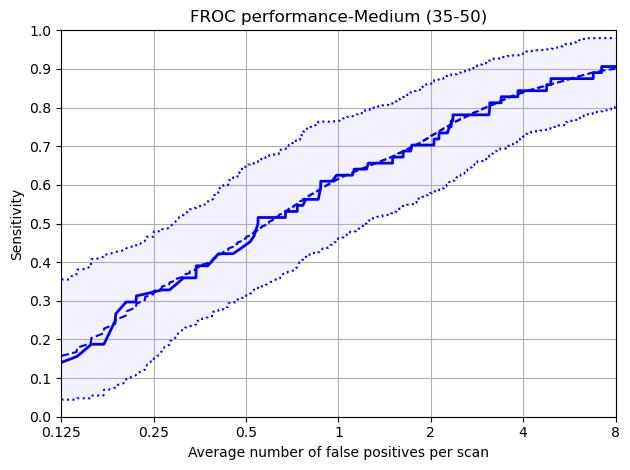

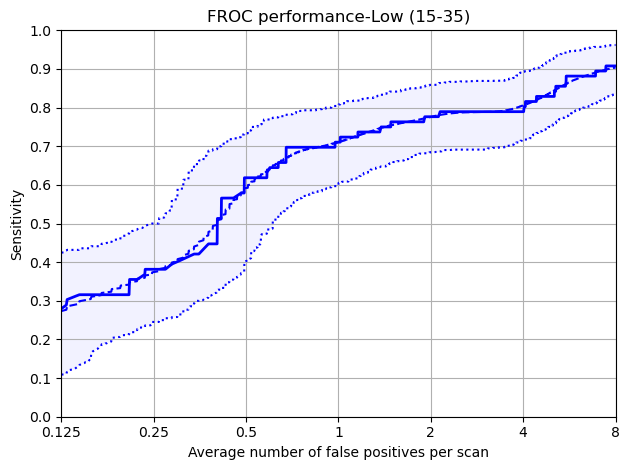

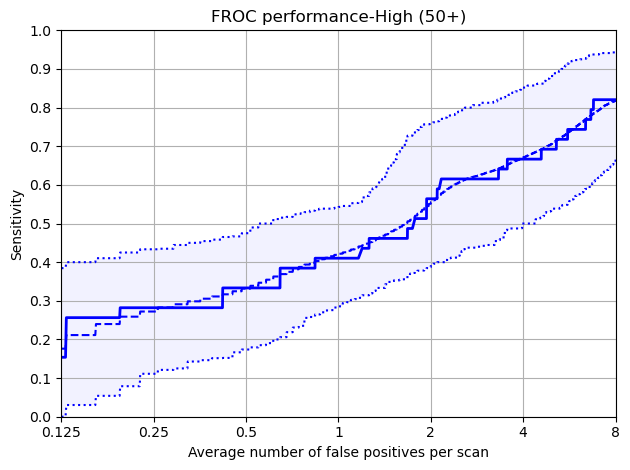

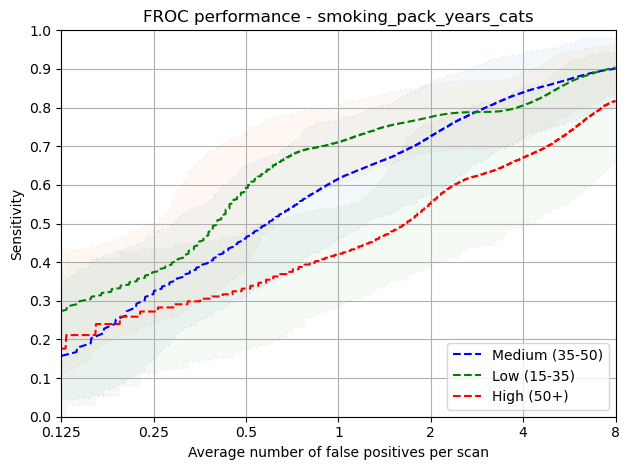

In [44]:
protected_group = 'smoking_pack_years_cats'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/detection/trained_summit/summit/{flavour}/{protected_group}'
)

### Actionable Vs Non-Actionable

Protected Group: Non-Actionable


,SOLID,PERIFISSURAL,NON_SOLID
nodule_type,17.0,81.0,2.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp3x0o__8r/annotations.csv
Total number of included nodule annotations: 84
Total number of nodule annotations: 84
Cases: 125


100%|██████████| 1000/1000 [00:02<00:00, 425.33it/s]


,0,159,476,1111,2381,4920,9999
0,0.226 (0.088 - 0.412),0.407 (0.291 - 0.527),0.57 (0.407 - 0.728),0.715 (0.62 - 0.805),0.813 (0.729 - 0.896),0.882 (0.814 - 0.95),0.953 (0.904 - 0.99)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.226,0.088,0.412
159,0.250,0.407,0.291,0.527
476,0.500,0.570,0.407,0.728
1111,1.000,0.715,0.620,0.805
2381,2.000,0.813,0.729,0.896
4920,4.000,0.882,0.814,0.950
9999,8.000,0.953,0.904,0.990


Mean Sensitivity: 0.65 Low Sensitivity: 0.55 High Sensitivity: 0.758


,True positives,82
0,False positives,1921.000
1,False negatives,2.000
2,True negatives,0.000
3,Total number of candidates,2023.000
4,Total number of nodules,84.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,20.000
7,Sensitivity,0.976
8,Average number of candidates per scan,16.184


Protected Group: Actonable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,31.0,26.0,11.0,18.0,15.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpwquxyd32/annotations.csv
Total number of included nodule annotations: 95
Total number of nodule annotations: 95
Cases: 46


100%|██████████| 1000/1000 [00:01<00:00, 564.89it/s]


,0,159,476,1111,2381,4920,9999
0,0.213 (0.087 - 0.326),0.273 (0.17 - 0.38),0.38 (0.238 - 0.519),0.508 (0.368 - 0.643),0.619 (0.476 - 0.753),0.694 (0.583 - 0.804),0.773 (0.667 - 0.88)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.213,0.087,0.326
159,0.250,0.273,0.170,0.380
476,0.500,0.380,0.238,0.519
1111,1.000,0.508,0.368,0.643
2381,2.000,0.619,0.476,0.753
4920,4.000,0.694,0.583,0.804
9999,8.000,0.773,0.667,0.880


Mean Sensitivity: 0.49 Low Sensitivity: 0.37 High Sensitivity: 0.615


,True positives,82
0,False positives,1302.000
1,False negatives,13.000
2,True negatives,0.000
3,Total number of candidates,1445.000
4,Total number of nodules,95.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,61.000
7,Sensitivity,0.863
8,Average number of candidates per scan,31.413


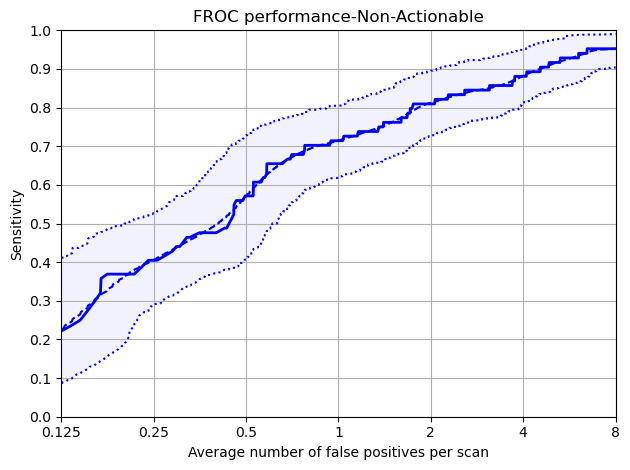

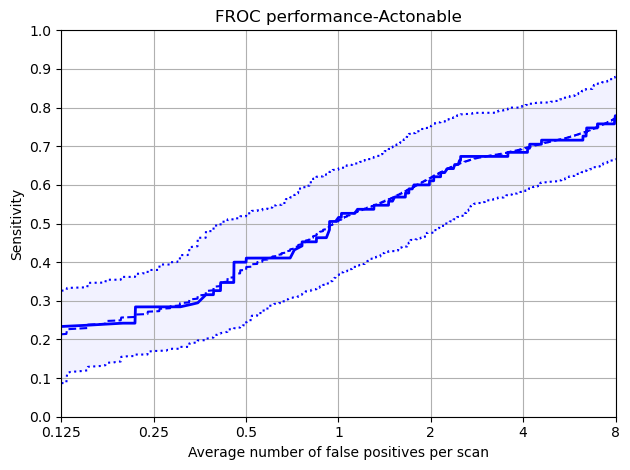

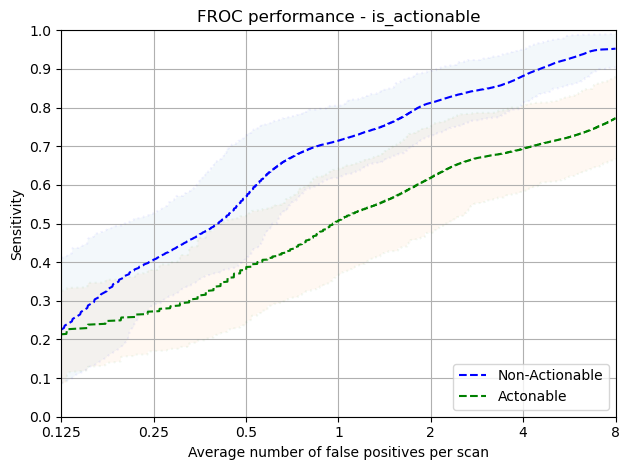

In [45]:
protected_group = 'is_actionable'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/detection/trained_summit/summit/{flavour}/{protected_group}'
)

### Actionable Gender

Protected Group: Female


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,31.0,26.0,11.0,18.0,15.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpmp4532y3/annotations.csv
Total number of included nodule annotations: 95
Total number of nodule annotations: 95
Cases: 46


100%|██████████| 1000/1000 [00:01<00:00, 549.21it/s]


,0,159,476,1111,2381,4920,9999
0,0.215 (0.084 - 0.337),0.273 (0.158 - 0.391),0.378 (0.238 - 0.532),0.509 (0.367 - 0.647),0.619 (0.469 - 0.747),0.694 (0.58 - 0.798),0.775 (0.663 - 0.879)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.215,0.084,0.337
159,0.250,0.273,0.158,0.391
476,0.500,0.378,0.238,0.532
1111,1.000,0.509,0.367,0.647
2381,2.000,0.619,0.469,0.747
4920,4.000,0.694,0.580,0.798
9999,8.000,0.775,0.663,0.879


Mean Sensitivity: 0.49 Low Sensitivity: 0.37 High Sensitivity: 0.619


,True positives,82
0,False positives,1302.000
1,False negatives,13.000
2,True negatives,0.000
3,Total number of candidates,1445.000
4,Total number of nodules,95.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,61.000
7,Sensitivity,0.863
8,Average number of candidates per scan,31.413


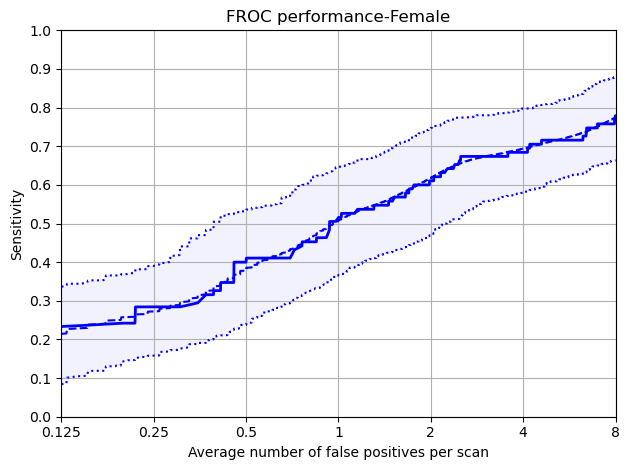

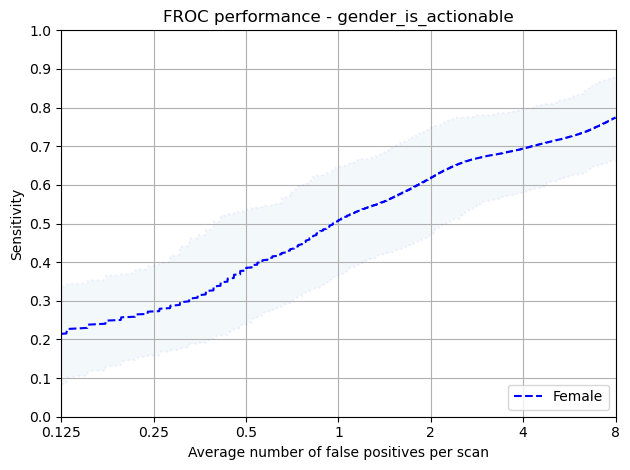

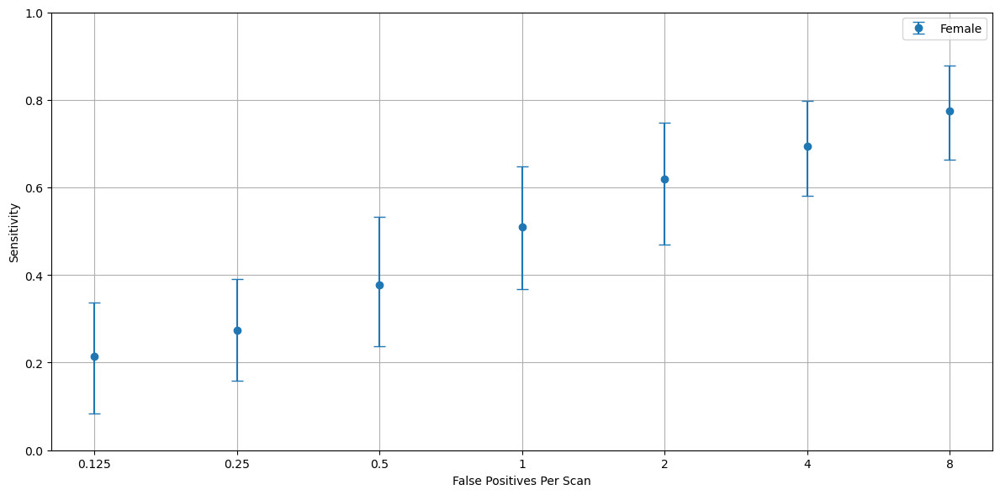

In [46]:
protected_group = 'gender_is_actionable'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/detection/trained_summit/summit/{flavour}/{protected_group}'
)
display_plots_with_error_bars('detection', flavour,'Actionable, Gender', data_dict)

### Non-Actionable Gender

Protected Group: Female


,SOLID,PERIFISSURAL,NON_SOLID
nodule_type,17.0,81.0,2.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp34hklxmb/annotations.csv
Total number of included nodule annotations: 84
Total number of nodule annotations: 84
Cases: 125


100%|██████████| 1000/1000 [00:02<00:00, 405.06it/s]


,0,159,476,1111,2381,4920,9999
0,0.228 (0.091 - 0.429),0.409 (0.297 - 0.535),0.575 (0.413 - 0.734),0.716 (0.615 - 0.806),0.815 (0.728 - 0.896),0.883 (0.81 - 0.95),0.955 (0.904 - 0.99)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.228,0.091,0.429
159,0.250,0.409,0.297,0.535
476,0.500,0.575,0.413,0.734
1111,1.000,0.716,0.615,0.806
2381,2.000,0.815,0.728,0.896
4920,4.000,0.883,0.810,0.950
9999,8.000,0.955,0.904,0.990


Mean Sensitivity: 0.65 Low Sensitivity: 0.55 High Sensitivity: 0.763


,True positives,82
0,False positives,1921.000
1,False negatives,2.000
2,True negatives,0.000
3,Total number of candidates,2023.000
4,Total number of nodules,84.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,20.000
7,Sensitivity,0.976
8,Average number of candidates per scan,16.184


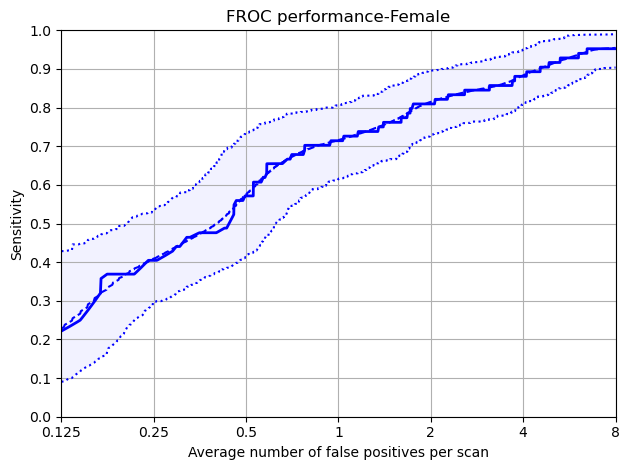

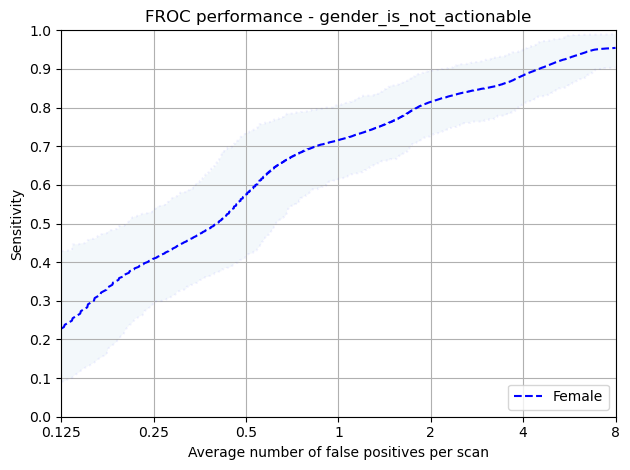

In [47]:
protected_group = 'gender_is_not_actionable'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/detection/trained_summit/summit/{flavour}/{protected_group}'
)


### Actionable Ethnic Group

Protected Group: White


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,27.0,27.0,11.0,18.0,16.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpjz27yngy/annotations.csv
Total number of included nodule annotations: 44
Total number of nodule annotations: 44
Cases: 18


100%|██████████| 1000/1000 [00:01<00:00, 936.49it/s]


,0,159,476,1111,2381,4920,9999
0,0.268 (0.097 - 0.426),0.317 (0.159 - 0.5),0.417 (0.239 - 0.615),0.533 (0.348 - 0.725),0.627 (0.435 - 0.854),0.701 (0.528 - 0.865),0.751 (0.548 - 0.921)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.268,0.097,0.426
159,0.250,0.317,0.159,0.500
476,0.500,0.417,0.239,0.615
1111,1.000,0.533,0.348,0.725
2381,2.000,0.627,0.435,0.854
4920,4.000,0.701,0.528,0.865
9999,8.000,0.751,0.548,0.921


Mean Sensitivity: 0.52 Low Sensitivity: 0.34 High Sensitivity: 0.701


,True positives,40
0,False positives,586.000
1,False negatives,4.000
2,True negatives,0.000
3,Total number of candidates,652.000
4,Total number of nodules,44.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,26.000
7,Sensitivity,0.909
8,Average number of candidates per scan,36.222


Protected Group: Asian or Asian British


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,31.0,22.0,9.0,25.0,12.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmppiahvzbo/annotations.csv
Total number of included nodule annotations: 32
Total number of nodule annotations: 32
Cases: 19


100%|██████████| 1000/1000 [00:00<00:00, 1053.67it/s]


,0,159,476,1111,2381,4920,9999
0,0.097 (0.0 - 0.269),0.145 (0.0 - 0.286),0.184 (0.038 - 0.368),0.396 (0.185 - 0.593),0.555 (0.4 - 0.704),0.649 (0.5 - 0.788),0.746 (0.593 - 0.897)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.097,0.000,0.269
159,0.250,0.145,0.000,0.286
476,0.500,0.184,0.038,0.368
1111,1.000,0.396,0.185,0.593
2381,2.000,0.555,0.400,0.704
4920,4.000,0.649,0.500,0.788
9999,8.000,0.746,0.593,0.897


Mean Sensitivity: 0.4 Low Sensitivity: 0.25 High Sensitivity: 0.558


,True positives,25
0,False positives,491.000
1,False negatives,7.000
2,True negatives,0.000
3,Total number of candidates,544.000
4,Total number of nodules,32.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,28.000
7,Sensitivity,0.781
8,Average number of candidates per scan,28.632


Protected Group: Black


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,37.0,32.0,11.0,5.0,16.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpvz37i59n/annotations.csv
Total number of included nodule annotations: 19
Total number of nodule annotations: 19
Cases: 11


100%|██████████| 1000/1000 [00:00<00:00, 1436.16it/s]


,0,159,476,1111,2381,4920,9999
0,0.369 (0.053 - 0.794),0.466 (0.067 - 0.826),0.611 (0.25 - 0.895),0.682 (0.308 - 1.0),0.752 (0.4 - 1.0),0.815 (0.571 - 1.0),0.857 (0.667 - 1.0)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.369,0.053,0.794
159,0.250,0.466,0.067,0.826
476,0.500,0.611,0.250,0.895
1111,1.000,0.682,0.308,1.000
2381,2.000,0.752,0.400,1.000
4920,4.000,0.815,0.571,1.000
9999,8.000,0.857,0.667,1.000


Mean Sensitivity: 0.65 Low Sensitivity: 0.33 High Sensitivity: 0.931


,True positives,17
0,False positives,225.000
1,False negatives,2.000
2,True negatives,0.000
3,Total number of candidates,249.000
4,Total number of nodules,19.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,7.000
7,Sensitivity,0.895
8,Average number of candidates per scan,22.636


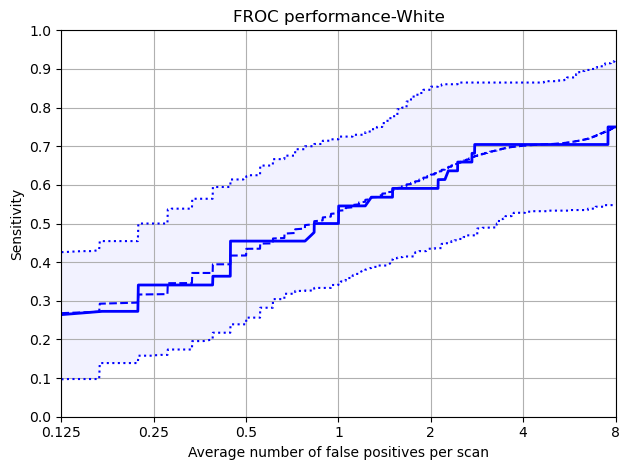

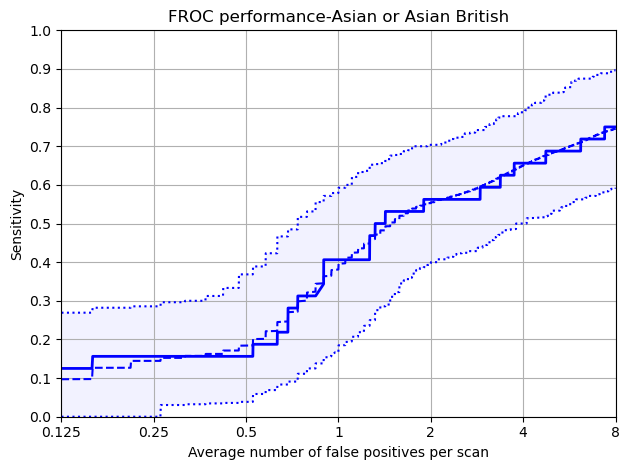

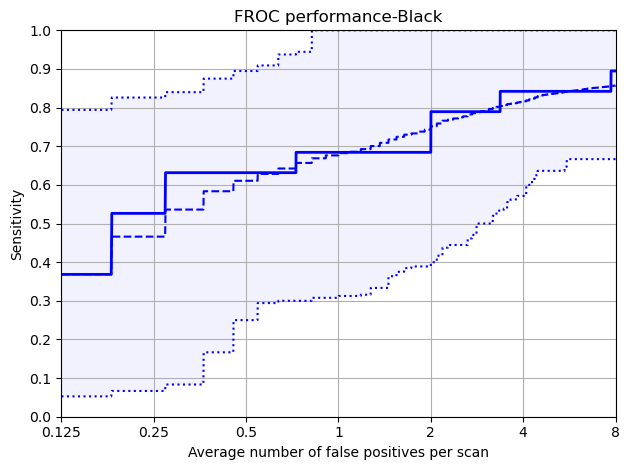

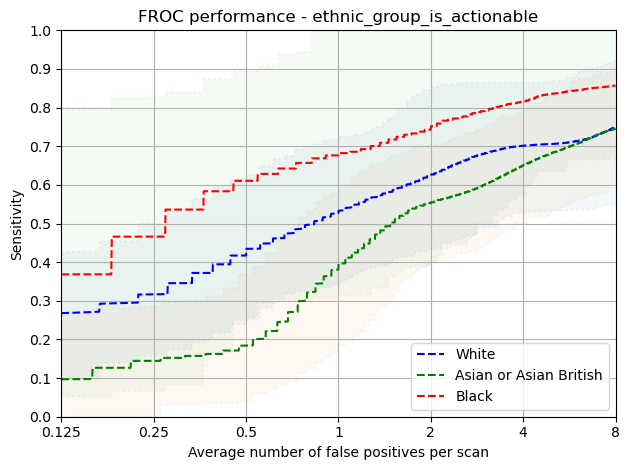

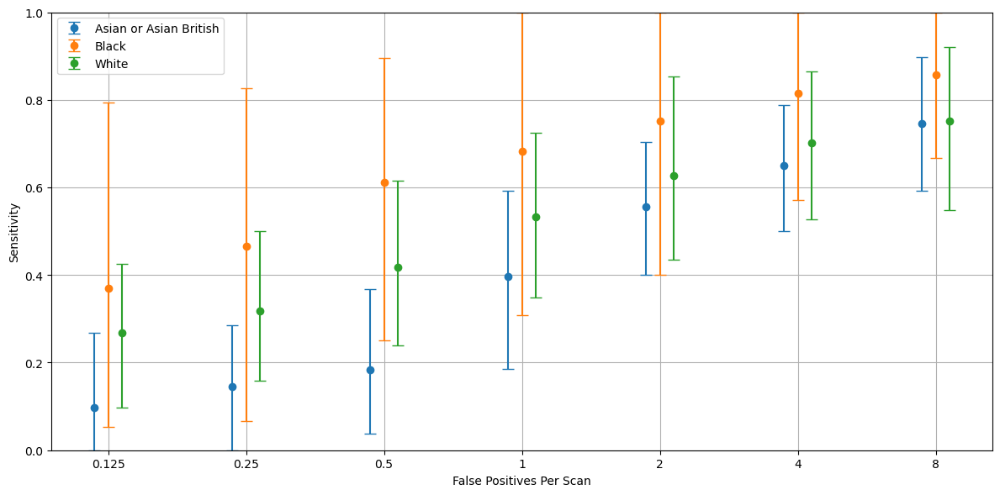

In [48]:
protected_group = 'ethnic_group_is_actionable'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/detection/trained_summit/summit/{flavour}/{protected_group}'
)
display_plots_with_error_bars('detection', flavour,'Actionable, Ethnic Group', data_dict, order=['Asian or Asian British','Black','White'])

### NonActionable - Ethnic Group

Protected Group: Black


,SOLID,PERIFISSURAL
nodule_type,12.0,88.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpjokaxjrk/annotations.csv
Total number of included nodule annotations: 25
Total number of nodule annotations: 25
Cases: 46


100%|██████████| 1000/1000 [00:01<00:00, 876.27it/s]


,0,159,476,1111,2381,4920,9999
0,0.546 (0.129 - 0.818),0.678 (0.469 - 0.917),0.855 (0.652 - 1.0),0.898 (0.773 - 1.0),0.96 (0.885 - 1.0),0.963 (0.889 - 1.0),1.0 (1.0 - 1.0)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.546,0.129,0.818
159,0.250,0.678,0.469,0.917
476,0.500,0.855,0.652,1.000
1111,1.000,0.898,0.773,1.000
2381,2.000,0.960,0.885,1.000
4920,4.000,0.963,0.889,1.000
9999,8.000,1.000,1.000,1.000


Mean Sensitivity: 0.84 Low Sensitivity: 0.69 High Sensitivity: 0.962


,True positives,25
0,False positives,592.000
1,False negatives,0.000
2,True negatives,0.000
3,Total number of candidates,622.000
4,Total number of nodules,25.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,5.000
7,Sensitivity,1.000
8,Average number of candidates per scan,13.522


Protected Group: White


,SOLID,PERIFISSURAL,NON_SOLID
nodule_type,24.0,74.0,3.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp_j_b59ba/annotations.csv
Total number of included nodule annotations: 34
Total number of nodule annotations: 34
Cases: 41


100%|██████████| 1000/1000 [00:01<00:00, 812.41it/s]


,0,159,476,1111,2381,4920,9999
0,0.11 (0.0 - 0.294),0.237 (0.036 - 0.444),0.409 (0.233 - 0.645),0.611 (0.438 - 0.8),0.727 (0.562 - 0.893),0.773 (0.63 - 0.914),0.874 (0.737 - 0.976)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.110,0.000,0.294
159,0.250,0.237,0.036,0.444
476,0.500,0.409,0.233,0.645
1111,1.000,0.611,0.438,0.800
2381,2.000,0.727,0.562,0.893
4920,4.000,0.773,0.630,0.914
9999,8.000,0.874,0.737,0.976


Mean Sensitivity: 0.53 Low Sensitivity: 0.38 High Sensitivity: 0.709


,True positives,32
0,False positives,743.000
1,False negatives,2.000
2,True negatives,0.000
3,Total number of candidates,780.000
4,Total number of nodules,34.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,5.000
7,Sensitivity,0.941
8,Average number of candidates per scan,19.024


Protected Group: Asian or Asian British


,SOLID,PERIFISSURAL,NON_SOLID
nodule_type,12.0,84.0,4.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpy66c28u0/annotations.csv
Total number of included nodule annotations: 25
Total number of nodule annotations: 25
Cases: 40


100%|██████████| 1000/1000 [00:01<00:00, 902.33it/s]


,0,159,476,1111,2381,4920,9999
0,0.208 (0.0 - 0.52),0.341 (0.091 - 0.667),0.526 (0.235 - 0.778),0.665 (0.5 - 0.85),0.771 (0.588 - 0.938),0.93 (0.815 - 1.0),1.0 (1.0 - 1.0)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.208,0.000,0.520
159,0.250,0.341,0.091,0.667
476,0.500,0.526,0.235,0.778
1111,1.000,0.665,0.500,0.850
2381,2.000,0.771,0.588,0.938
4920,4.000,0.930,0.815,1.000
9999,8.000,1.000,1.000,1.000


Mean Sensitivity: 0.63 Low Sensitivity: 0.46 High Sensitivity: 0.822


,True positives,25
0,False positives,586.000
1,False negatives,0.000
2,True negatives,0.000
3,Total number of candidates,621.000
4,Total number of nodules,25.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,10.000
7,Sensitivity,1.000
8,Average number of candidates per scan,15.525


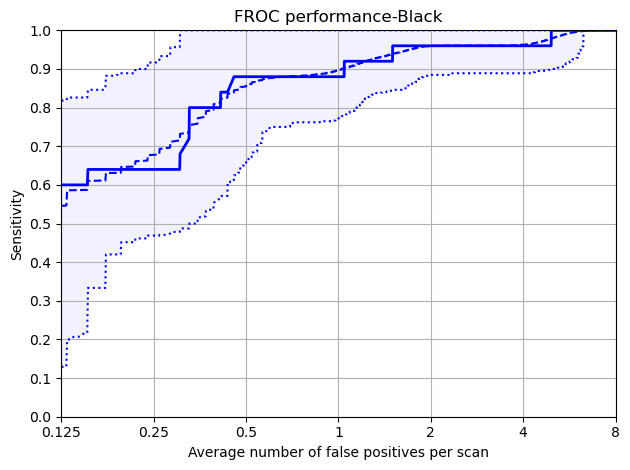

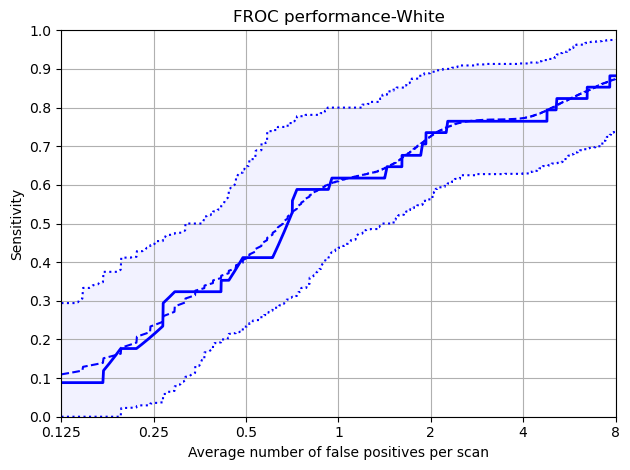

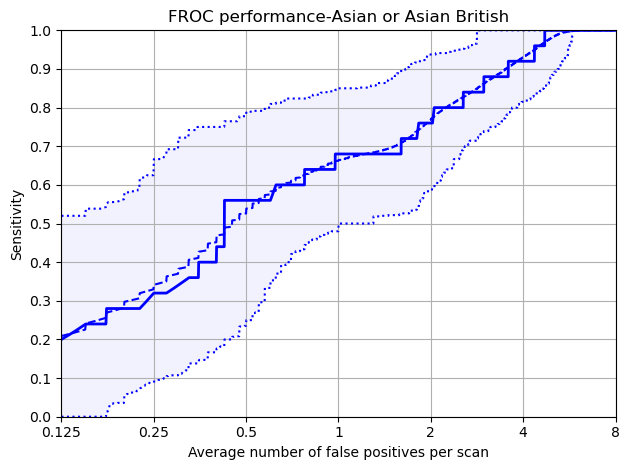

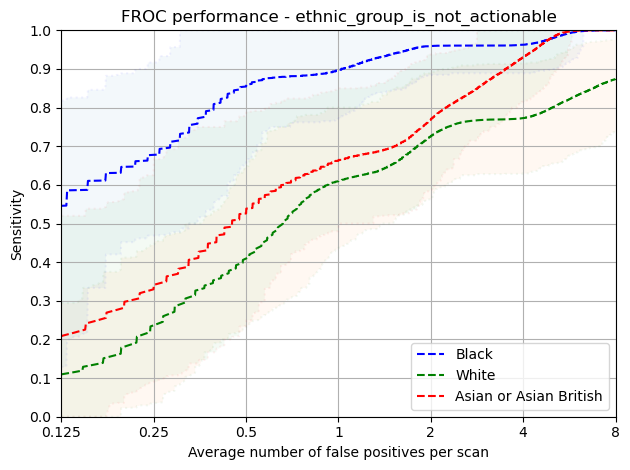

In [49]:
protected_group = 'ethnic_group_is_not_actionable'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/detection/trained_summit/summit/{flavour}/{protected_group}'
)

### Actionable IMDRank

Protected Group: Medium_IMDRank_Actionable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,23.0,13.0,16.0,26.0,23.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpw6cs2l78/annotations.csv
Total number of included nodule annotations: 31
Total number of nodule annotations: 31
Cases: 18


100%|██████████| 1000/1000 [00:00<00:00, 1016.13it/s]


,0,159,476,1111,2381,4920,9999
0,0.101 (0.0 - 0.241),0.122 (0.0 - 0.296),0.219 (0.036 - 0.469),0.413 (0.229 - 0.615),0.583 (0.385 - 0.821),0.699 (0.526 - 0.886),0.858 (0.69 - 1.0)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.101,0.000,0.241
159,0.250,0.122,0.000,0.296
476,0.500,0.219,0.036,0.469
1111,1.000,0.413,0.229,0.615
2381,2.000,0.583,0.385,0.821
4920,4.000,0.699,0.526,0.886
9999,8.000,0.858,0.690,1.000


Mean Sensitivity: 0.43 Low Sensitivity: 0.27 High Sensitivity: 0.618


,True positives,29
0,False positives,490.000
1,False negatives,2.000
2,True negatives,0.000
3,Total number of candidates,547.000
4,Total number of nodules,31.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,28.000
7,Sensitivity,0.935
8,Average number of candidates per scan,30.389


Protected Group: Low_IMDRank_Actionable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,33.0,41.0,8.0,5.0,13.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp11jwuw_t/annotations.csv
Total number of included nodule annotations: 39
Total number of nodule annotations: 39
Cases: 19


100%|██████████| 1000/1000 [00:00<00:00, 1022.67it/s]


,0,159,476,1111,2381,4920,9999
0,0.272 (0.022 - 0.452),0.335 (0.156 - 0.5),0.486 (0.241 - 0.725),0.65 (0.438 - 0.824),0.744 (0.545 - 0.907),0.812 (0.68 - 0.93),0.833 (0.697 - 0.957)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.272,0.022,0.452
159,0.250,0.335,0.156,0.500
476,0.500,0.486,0.241,0.725
1111,1.000,0.650,0.438,0.824
2381,2.000,0.744,0.545,0.907
4920,4.000,0.812,0.680,0.930
9999,8.000,0.833,0.697,0.957


Mean Sensitivity: 0.59 Low Sensitivity: 0.4 High Sensitivity: 0.756


,True positives,33
0,False positives,495.000
1,False negatives,6.000
2,True negatives,0.000
3,Total number of candidates,548.000
4,Total number of nodules,39.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,20.000
7,Sensitivity,0.846
8,Average number of candidates per scan,28.842


Protected Group: High_IMDRank_Actionable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,36.0,20.0,8.0,28.0,8.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpau8wu3oi/annotations.csv
Total number of included nodule annotations: 25
Total number of nodule annotations: 25
Cases: 11


100%|██████████| 1000/1000 [00:00<00:00, 1205.70it/s]


,0,159,476,1111,2381,4920,9999
0,0.185 (0.0 - 0.517),0.287 (0.0 - 0.542),0.421 (0.222 - 0.6),0.475 (0.3 - 0.733),0.543 (0.333 - 0.75),0.558 (0.364 - 0.76),0.59 (0.364 - 0.867)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.185,0.000,0.517
159,0.250,0.287,0.000,0.542
476,0.500,0.421,0.222,0.600
1111,1.000,0.475,0.300,0.733
2381,2.000,0.543,0.333,0.750
4920,4.000,0.558,0.364,0.760
9999,8.000,0.590,0.364,0.867


Mean Sensitivity: 0.44 Low Sensitivity: 0.23 High Sensitivity: 0.681


,True positives,20
0,False positives,317.000
1,False negatives,5.000
2,True negatives,0.000
3,Total number of candidates,350.000
4,Total number of nodules,25.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,13.000
7,Sensitivity,0.800
8,Average number of candidates per scan,31.818


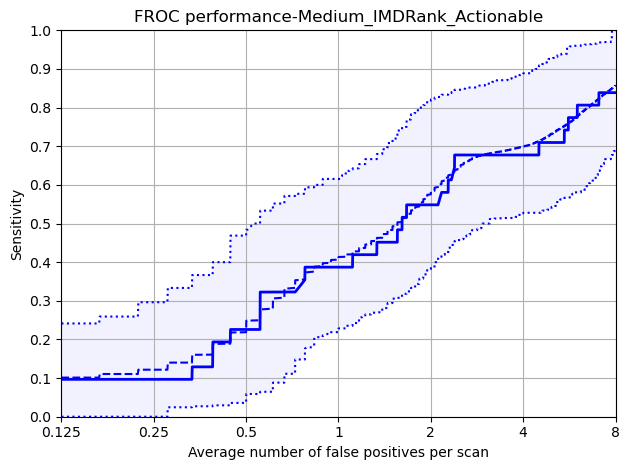

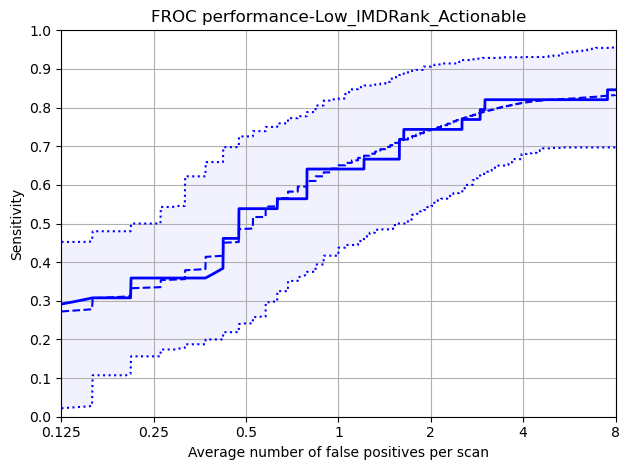

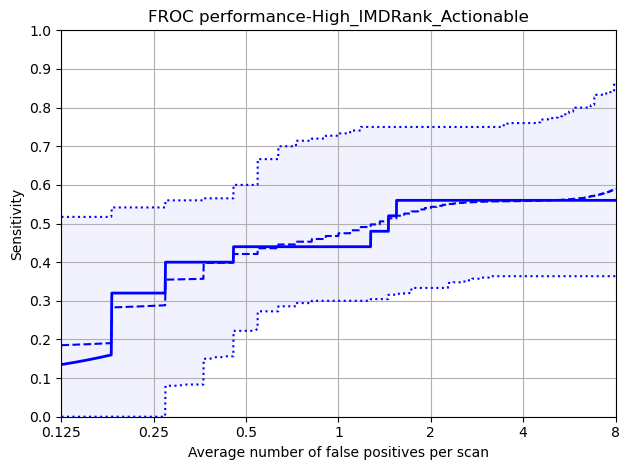

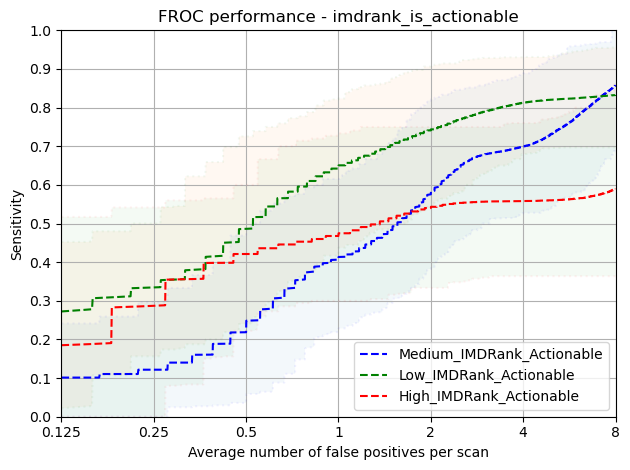

In [50]:
protected_group = 'imdrank_is_actionable'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/detection/trained_summit/summit/{flavour}/{protected_group}'
)

### Actionable Smoking Status

Protected Group: Low_Pack_Years_Actionable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,40.0,33.0,10.0,10.0,7.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpsi_p7cwo/annotations.csv
Total number of included nodule annotations: 30
Total number of nodule annotations: 30
Cases: 15


100%|██████████| 1000/1000 [00:00<00:00, 1016.54it/s]


,0,159,476,1111,2381,4920,9999
0,0.216 (0.062 - 0.432),0.29 (0.083 - 0.63),0.476 (0.143 - 0.789),0.69 (0.462 - 0.853),0.758 (0.636 - 0.87),0.763 (0.64 - 0.871),0.813 (0.682 - 0.941)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.216,0.062,0.432
159,0.250,0.290,0.083,0.630
476,0.500,0.476,0.143,0.789
1111,1.000,0.690,0.462,0.853
2381,2.000,0.758,0.636,0.870
4920,4.000,0.763,0.640,0.871
9999,8.000,0.813,0.682,0.941


Mean Sensitivity: 0.57 Low Sensitivity: 0.39 High Sensitivity: 0.769


,True positives,26
0,False positives,495.000
1,False negatives,4.000
2,True negatives,0.000
3,Total number of candidates,537.000
4,Total number of nodules,30.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,16.000
7,Sensitivity,0.867
8,Average number of candidates per scan,35.800


Protected Group: Medium_Pack_Years_Actionable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,35.0,29.0,9.0,9.0,18.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp0kt4ls_l/annotations.csv
Total number of included nodule annotations: 34
Total number of nodule annotations: 34
Cases: 20


100%|██████████| 1000/1000 [00:00<00:00, 1086.60it/s]


,0,159,476,1111,2381,4920,9999
0,0.168 (0.0 - 0.4),0.29 (0.097 - 0.462),0.369 (0.222 - 0.556),0.484 (0.284 - 0.744),0.595 (0.35 - 0.862),0.714 (0.476 - 0.909),0.79 (0.6 - 0.949)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.168,0.000,0.400
159,0.250,0.290,0.097,0.462
476,0.500,0.369,0.222,0.556
1111,1.000,0.484,0.284,0.744
2381,2.000,0.595,0.350,0.862
4920,4.000,0.714,0.476,0.909
9999,8.000,0.790,0.600,0.949


Mean Sensitivity: 0.49 Low Sensitivity: 0.29 High Sensitivity: 0.697


,True positives,28
0,False positives,443.000
1,False negatives,6.000
2,True negatives,0.000
3,Total number of candidates,495.000
4,Total number of nodules,34.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,24.000
7,Sensitivity,0.824
8,Average number of candidates per scan,24.750


Protected Group: High_Pack_Years_Actionable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,16.0,16.0,13.0,35.0,19.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpd2iayzgx/annotations.csv
Total number of included nodule annotations: 31
Total number of nodule annotations: 31
Cases: 13


100%|██████████| 1000/1000 [00:00<00:00, 1173.99it/s]


,0,159,476,1111,2381,4920,9999
0,0.189 (0.0 - 0.333),0.216 (0.061 - 0.364),0.273 (0.091 - 0.444),0.403 (0.226 - 0.577),0.541 (0.333 - 0.778),0.617 (0.393 - 0.833),0.718 (0.515 - 0.917)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.189,0.000,0.333
159,0.250,0.216,0.061,0.364
476,0.500,0.273,0.091,0.444
1111,1.000,0.403,0.226,0.577
2381,2.000,0.541,0.333,0.778
4920,4.000,0.617,0.393,0.833
9999,8.000,0.718,0.515,0.917


Mean Sensitivity: 0.42 Low Sensitivity: 0.23 High Sensitivity: 0.607


,True positives,28
0,False positives,364.000
1,False negatives,3.000
2,True negatives,0.000
3,Total number of candidates,413.000
4,Total number of nodules,31.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,21.000
7,Sensitivity,0.903
8,Average number of candidates per scan,31.769


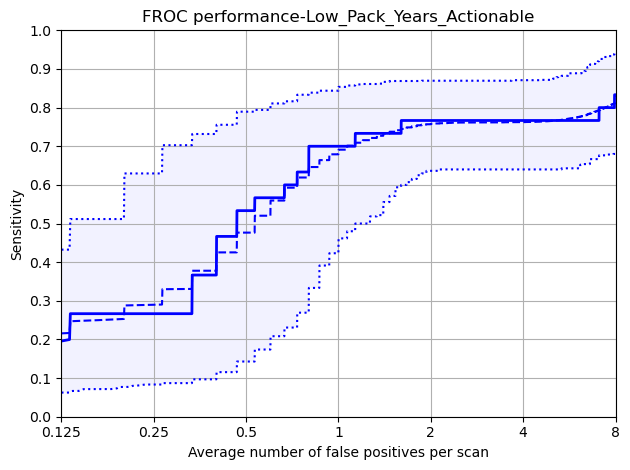

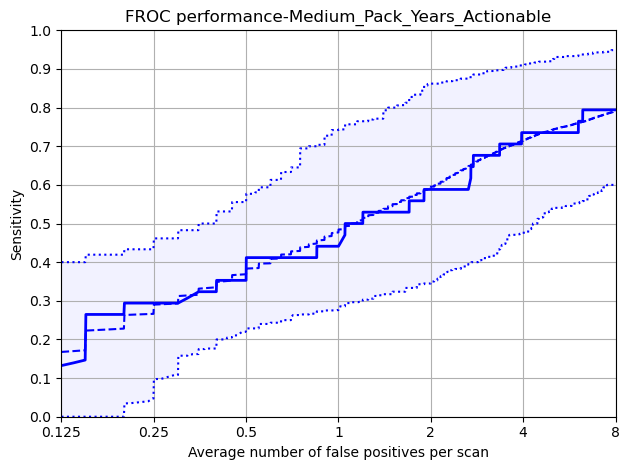

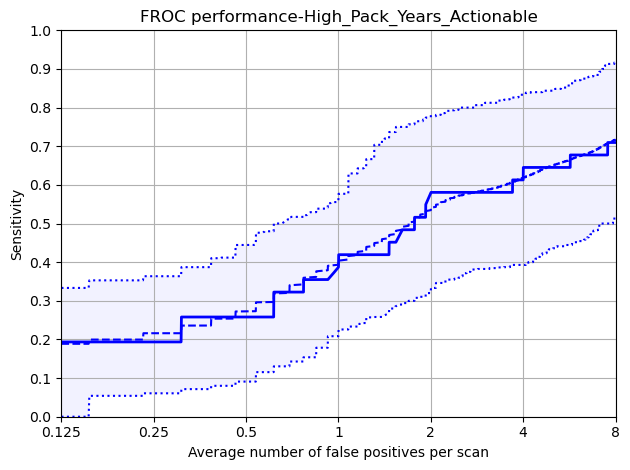

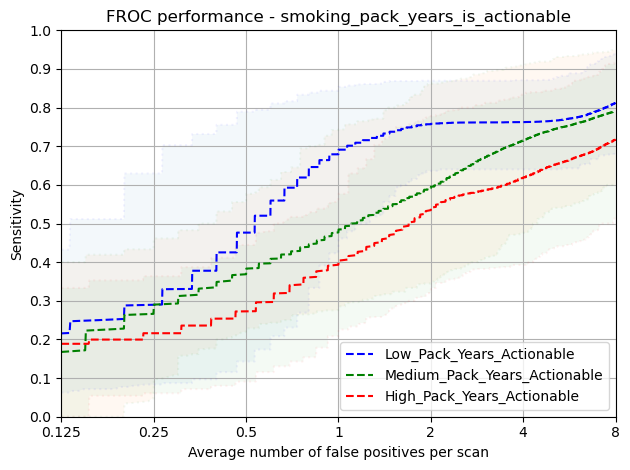

In [51]:
protected_group = 'smoking_pack_years_is_actionable'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/detection/trained_summit/summit/{flavour}/{protected_group}'
)


### False Positive and Miss Analysis


In [52]:
thresholds = utils.get_thresholds(detection_summit_summit)
print(thresholds)
missed_metadata = utils.miss_anaysis_at_fpps(
    model='detection',
    scans_metadata=scan_metadata,
    scans_path=f'{workspace_path}/metadata/summit/{flavour}/test_scans.csv',
    annotations_path=f'{workspace_path}/models/detection/result/trained_summit/summit/{flavour}/annotations.csv',
    exclusions_path=f'{workspace_path}/data/summit/metadata/annotations_excluded_empty.csv',
    predictions_path=detection_predictions_path,
    thresholds=thresholds
)

[0.99609375, 0.99169921875, 0.9814453125, 0.95751953125, 0.89501953125, 0.61865234375, 0.1795654296875]
/Users/john/Projects/SOTAEvaluationNoduleDetection/models/detection/result/trained_summit/summit/balanced_female_for_inference/annotations.csv
Total number of included nodule annotations: 180
Total number of nodule annotations: 180
Cases: 172
Missed Annotations at 0.99609375 FPPs: 151
/Users/john/Projects/SOTAEvaluationNoduleDetection/models/detection/result/trained_summit/summit/balanced_female_for_inference/annotations.csv
Total number of included nodule annotations: 180
Total number of nodule annotations: 180
Cases: 172
Missed Annotations at 0.99169921875 FPPs: 124
/Users/john/Projects/SOTAEvaluationNoduleDetection/models/detection/result/trained_summit/summit/balanced_female_for_inference/annotations.csv
Total number of included nodule annotations: 180
Total number of nodule annotations: 180
Cases: 172
Missed Annotations at 0.9814453125 FPPs: 94
/Users/john/Projects/SOTAEvaluatio

In [53]:
hit_and_miss_dict = utils.get_protected_group_by_nodule_type(missed_metadata)

#### Incremental FROC Scores - Gender/ Ethnic Group / Nodule Type

In [54]:

# display(hit_and_miss_dict[0])
recode_dict = {}
for idx in range(7):
    hmm = {}
    for slice in ['all','actionable']:
        for protected_group in ['MALE','FEMALE','All', 'Asian or Asian British', 'Black', 'White']:
            for type in ['SOLID','NON_SOLID','PART_SOLID','PERIFISSURAL','CALCIFIED']:
            
                try:

                    group = 'gender' if protected_group in ['MALE','FEMALE','All'] else 'ethnic_group'

                    total = hit_and_miss_dict[idx][slice][group][(True,type)][protected_group] + hit_and_miss_dict[idx][slice][group][(False,type)][protected_group]
                    hits = hit_and_miss_dict[idx][slice][group][(False,type)][protected_group]
                    perc_hits = round(100 * (hits/total),0)

                    hmm[f'{slice}_{protected_group}_{type}_Hits%'] = perc_hits
                except:
                    print(f'Error: {idx}, {slice}, {protected_group}, {type}')
                    hmm[f'{slice}_{protected_group}_{type}_Hits%'] = 100
                    

    recode_dict[idx] = hmm

pd.DataFrame.from_dict(recode_dict, orient='index').head(7)

df = pd.DataFrame.from_dict(recode_dict, orient='index').head(7)

# Remove ".0" from each value in the dataframe
df = df.applymap(lambda x: str(x).replace('.0', ''))

# Collapse each column into comma-delimited values
collapsed_df = df.apply(lambda x: ', '.join(x), axis=0)

display(collapsed_df)

from scipy.stats import shapiro, ttest_ind, mannwhitneyu

def calculate_significant_differences(df, group1_name, group2_name):

    group1 = df[group1_name].astype(int).values
    group2 = df[group2_name].astype(int).values

    shapiro_group1 = shapiro(group1)
    shapiro_group2 = shapiro(group2)

    print('*'*50)
    if shapiro_group1[1] > 0.05 and shapiro_group2[1] > 0.05:
        t_test = ttest_ind(group1, group2)
        print(f'Independent T-Test: {round(t_test.statistic,3)}, {round(t_test.pvalue,3)}')
    else:
        manwhitney = mannwhitneyu(group1, group2)
        print(f'Mann-Whitney U Test: {round(manwhitney.statistic,3)}, {round(manwhitney.pvalue,3)}')

a='White'
b='Black'

for type in ['SOLID','NON_SOLID','PART_SOLID','PERIFISSURAL','CALCIFIED']:

    print(f'*** all {type} ***')
    group1 = f'all_{a}_{type}_Hits%'
    group2 = f'all_{b}_{type}_Hits%'
    calculate_significant_differences(df, group1, group2)

for type in ['SOLID','NON_SOLID','PART_SOLID','PERIFISSURAL','CALCIFIED']:

    print(f'*** actionable {type} ***')
    group1 = f'actionable_{a}_{type}_Hits%'
    group2 = f'actionable_{b}_{type}_Hits%'
    calculate_significant_differences(df, group1, group2)

Error: 0, all, MALE, SOLID
Error: 0, all, MALE, NON_SOLID
Error: 0, all, MALE, PART_SOLID
Error: 0, all, MALE, PERIFISSURAL
Error: 0, all, MALE, CALCIFIED
Error: 0, all, FEMALE, NON_SOLID
Error: 0, all, FEMALE, PART_SOLID
Error: 0, all, FEMALE, CALCIFIED
Error: 0, all, All, NON_SOLID
Error: 0, all, All, PART_SOLID
Error: 0, all, All, CALCIFIED
Error: 0, all, Asian or Asian British, NON_SOLID
Error: 0, all, Asian or Asian British, PART_SOLID
Error: 0, all, Asian or Asian British, CALCIFIED
Error: 0, all, Black, NON_SOLID
Error: 0, all, Black, PART_SOLID
Error: 0, all, Black, CALCIFIED
Error: 0, all, White, NON_SOLID
Error: 0, all, White, PART_SOLID
Error: 0, all, White, CALCIFIED
Error: 0, actionable, MALE, SOLID
Error: 0, actionable, MALE, NON_SOLID
Error: 0, actionable, MALE, PART_SOLID
Error: 0, actionable, MALE, PERIFISSURAL
Error: 0, actionable, MALE, CALCIFIED
Error: 0, actionable, FEMALE, NON_SOLID
Error: 0, actionable, FEMALE, PART_SOLID
Error: 0, actionable, FEMALE, CALCIFIED
E

all_MALE_SOLID_Hits%                                    100, 100, 100, 100, 100, 100, 100
all_MALE_NON_SOLID_Hits%                                100, 100, 100, 100, 100, 100, 100
all_MALE_PART_SOLID_Hits%                               100, 100, 100, 100, 100, 100, 100
all_MALE_PERIFISSURAL_Hits%                             100, 100, 100, 100, 100, 100, 100
all_MALE_CALCIFIED_Hits%                                100, 100, 100, 100, 100, 100, 100
all_FEMALE_SOLID_Hits%                                         23, 41, 64, 73, 80, 84, 89
all_FEMALE_NON_SOLID_Hits%                                     100, 5, 11, 26, 42, 47, 68
all_FEMALE_PART_SOLID_Hits%                                  100, 100, 30, 40, 60, 70, 80
all_FEMALE_PERIFISSURAL_Hits%                                  20, 39, 54, 70, 82, 87, 95
all_FEMALE_CALCIFIED_Hits%                                     100, 7, 21, 29, 36, 50, 79
all_All_SOLID_Hits%                                            23, 41, 64, 73, 80, 84, 89
all_All_NO

*** all SOLID ***
**************************************************
Mann-Whitney U Test: 12.0, 0.121
*** all NON_SOLID ***
**************************************************
Mann-Whitney U Test: 27.5, 0.741
*** all PART_SOLID ***
**************************************************
Mann-Whitney U Test: 27.0, 0.791
*** all PERIFISSURAL ***
**************************************************
Independent T-Test: -0.807, 0.436
*** all CALCIFIED ***
**************************************************
Independent T-Test: 0.333, 0.745
*** actionable SOLID ***
**************************************************
Mann-Whitney U Test: 9.0, 0.052
*** actionable NON_SOLID ***
**************************************************
Mann-Whitney U Test: 27.5, 0.741
*** actionable PART_SOLID ***
**************************************************
Mann-Whitney U Test: 27.0, 0.791
*** actionable PERIFISSURAL ***
**************************************************
Independent T-Test: 0.791, 0.444
*** actionable CAL

#### Nodule Characteristic Analysis

,RIGHT,LEFT,NOT_ANSWERED
0.125,0.17,0.09,0.22
0.25,0.30,0.27,0.38
0.5,0.49,0.48,0.45
1,0.61,0.59,0.62
2,0.70,0.73,0.78
4,0.76,0.80,0.82
8,0.88,0.93,0.85
Total Annotations,96.00,44.00,40.00


,UPPER,NOT-UPPER,NOT_ANSWERED
0.125,0.10,0.18,0.22
0.25,0.24,0.35,0.38
0.5,0.41,0.56,0.45
1,0.57,0.64,0.62
2,0.66,0.75,0.78
4,0.74,0.81,0.82
8,0.91,0.88,0.85
Total Annotations,68.00,72.00,40.00


,SOLID,NON_SOLID,PART_SOLID,PERIFISSURAL,CALCIFIED
0.125,0.23,0.00,0.0,0.20,0.00
0.25,0.41,0.05,0.0,0.39,0.07
0.5,0.64,0.11,0.3,0.54,0.21
1,0.73,0.26,0.4,0.70,0.29
2,0.80,0.42,0.6,0.82,0.36
4,0.84,0.47,0.7,0.87,0.50
8,0.89,0.68,0.8,0.95,0.79
Total Annotations,44.00,19.00,10.0,93.00,14.00


,RANDOMISATION_AT_YEAR_1,ALWAYS_SCAN_AT_YEAR_1,3_MONTH_FOLLOW_UP_SCAN,URGENT_REFERRAL
0.125,0.21,0.00,0.06,0.22
0.25,0.39,0.06,0.15,0.33
0.5,0.56,0.12,0.38,0.44
1,0.69,0.29,0.47,0.67
2,0.80,0.47,0.59,0.67
4,0.85,0.53,0.68,0.78
8,0.93,0.71,0.82,0.78
Total Annotations,120.00,17.00,34.00,9.00


,00-04,04-08,08-15,15-20,20-30,30-40
0.125,0.06,0.20,0.16,0.00,0.0,0.0
0.25,0.11,0.38,0.27,0.00,0.2,0.5
0.5,0.22,0.58,0.35,0.12,0.4,1.0
1,0.33,0.71,0.57,0.12,0.4,1.0
2,0.39,0.83,0.65,0.50,0.4,1.0
4,0.50,0.87,0.68,0.62,0.8,1.0
8,0.78,0.94,0.78,0.75,1.0,1.0
Total Annotations,18.00,110.00,37.00,8.00,5.0,2.0


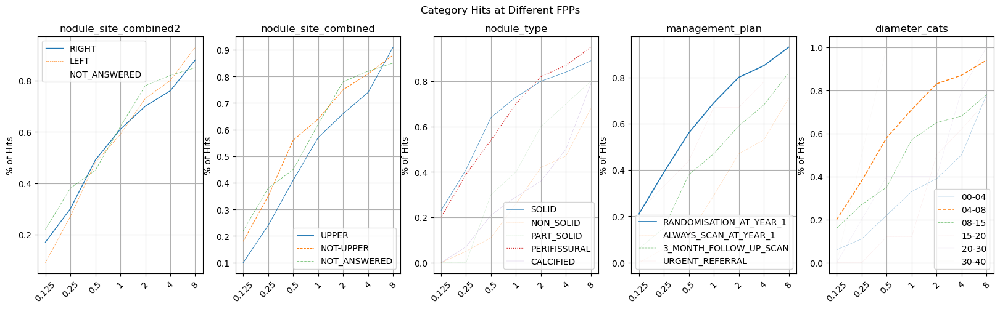

In [55]:

fig, ax = plt.subplots(1, 5, figsize=(20, 5))

nodule_characteristics = {
    'nodule_site_combined2': ['RIGHT', 'LEFT', 'NOT_ANSWERED'],
    'nodule_site_combined': ['UPPER','NOT-UPPER', 'NOT_ANSWERED'],
    'nodule_type': ['SOLID', 'NON_SOLID', 'PART_SOLID', 'PERIFISSURAL', 'CALCIFIED'],
    'management_plan': ['RANDOMISATION_AT_YEAR_1','ALWAYS_SCAN_AT_YEAR_1', '3_MONTH_FOLLOW_UP_SCAN', 'URGENT_REFERRAL'],
    'diameter_cats': diameter_lbs,
}

for ivx, (var, order) in enumerate(nodule_characteristics.items()):
    annotations = pd.read_csv(f'{workspace_path}/models/grt123/bbox_result/trained_summit/summit/{flavour}/{flavour}_metadata.csv')
    # annotations = annotations[annotations['management_plan'] != 'RANDOMISATION_AT_YEAR_1']

    total_vc = annotations[var].value_counts().sort_index().rename('Total Annotations')

    operating_points = ['0.125', '0.25', '0.5', '1', '2', '4', '8']

    results = []

    for idx, metadata in enumerate(missed_metadata):
        results.append(
            pd.crosstab(
                metadata[var], 
                metadata['miss'],
                normalize='index'
            )[False]
            .rename(f'{operating_points[idx]}')
            .reindex(order)
            
        )

    df = pd.concat(results, axis=1).fillna(0).round(2).merge(total_vc.to_frame(), left_index=True, right_index=True)

    display(df.T)


    line_styles = ['-', '--', '-.', ':', '-', '--', '-.']
    weights = df.pop('Total Annotations')

    for isx, column in enumerate(df.T):    
            ax[ivx].plot(df.T[column], label=column, linestyle=line_styles[isx], linewidth=weights[isx]/100)
    
    ax[ivx].set_xticklabels(labels=df.columns, rotation=45)
    ax[ivx].set_title(var)
    ax[ivx].legend()
    ax[ivx].set_ylabel('% of Hits')
    ax[ivx].grid(visible=True, which='both')

plt.suptitle('Category Hits at Different FPPs')
plt.show()

,FEMALE,Total
"(CALCIFIED, 3_MONTH_FOLLOW_UP_SCAN)",14 (7.8%),14 (7.8%)
"(NON_SOLID, ALWAYS_SCAN_AT_YEAR_1)",17 (9.4%),17 (9.4%)
"(NON_SOLID, RANDOMISATION_AT_YEAR_1)",2 (1.1%),2 (1.1%)
"(PART_SOLID, 3_MONTH_FOLLOW_UP_SCAN)",10 (5.6%),10 (5.6%)
"(PERIFISSURAL, RANDOMISATION_AT_YEAR_1)",93 (51.7%),93 (51.7%)
"(SOLID, 3_MONTH_FOLLOW_UP_SCAN)",10 (5.6%),10 (5.6%)
"(SOLID, RANDOMISATION_AT_YEAR_1)",25 (13.9%),25 (13.9%)
"(SOLID, URGENT_REFERRAL)",9 (5.0%),9 (5.0%)
Total,180,180


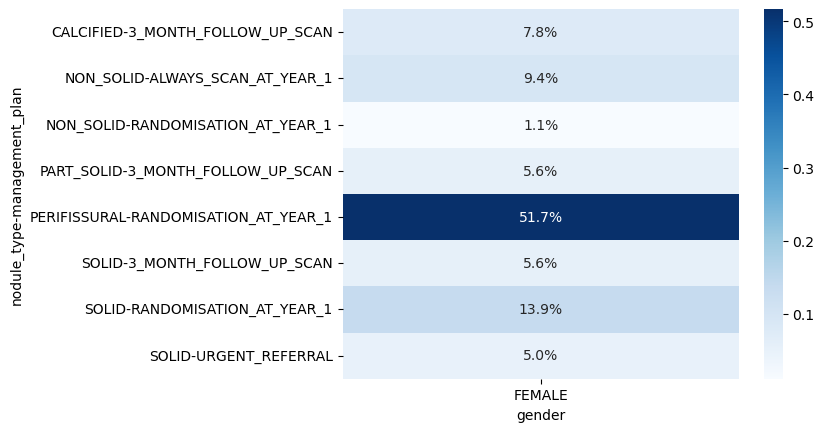

In [56]:
# Check what nodules have been missed by gender


missed_metadata_at_2fpps = missed_metadata[4]

def crosstab_with_percentages(rows, columns, x_order=None, y_order=None, table=False, heatmap=False):
    # Create the crosstab with absolutes
    cols = [c.astype(str) for c in columns]
    rows = [r.astype(str) for r in rows]

    xabs = pd.crosstab(rows, cols).fillna(0)
    xperc = pd.crosstab(rows, cols, normalize='columns').fillna(0)

    if x_order:
        xabs = xabs.reindex(x_order, axis=1)
        xperc = xperc.reindex(x_order, axis=1)

    if y_order:
        xabs = xabs.reindex(y_order)
        xperc = xperc.reindex(y_order)

    combined_data = {}

    for (adx, rabs), (pdx, rperc) in zip(xabs.iterrows(), xperc.iterrows()):

        row_data = {}
        row_total = 0

        for col in xabs.columns:
            row_data[col] = f"{rabs[col]} ({rperc[col]:.1%})"
            row_total += rabs[col]

        row_data['Total'] = f'{row_total} ({row_total / xabs.sum().sum():.1%})'
        combined_data[adx] = row_data

    row_data = {}
    row_total = 0
    for col in xabs.columns:
        row_data[col] = f'{sum(xabs[col])}'
        row_total += xabs[col].sum()

    row_data['Total'] = row_total
    combined_data['Total'] = row_data

    if table:
        display(pd.DataFrame.from_dict(combined_data).T)
        
    
    if heatmap:
        sns.heatmap(xperc, annot=True, fmt=".1%", cmap='Blues')
        plt.show()

    return xperc, pd.DataFrame.from_dict(combined_data)

_ = crosstab_with_percentages(
    [missed_metadata_at_2fpps['nodule_type'], missed_metadata_at_2fpps['management_plan']],
    [missed_metadata_at_2fpps['gender']],
    table=True,
    heatmap=True)

In [57]:
scans = pd.read_csv(f'{workspace_path}/metadata/summit/{flavour}/test_scans.csv')
predictions = pd.read_csv(detection_predictions_path)
annotations = pd.read_csv(f'{workspace_path}/models/detection/result/trained_summit/summit/{flavour}/annotations.csv')

false_positives_fpps = false_positive_analysis(
    thresholds=thresholds,    
    predictions=predictions,
    annotations=annotations
)

predictions: 48 at threshold: 0.99609375
distance false positives: 19 at threshold: 0.99609375
predictions: 97 at threshold: 0.99169921875
distance false positives: 41 at threshold: 0.99169921875
predictions: 171 at threshold: 0.9814453125
distance false positives: 85 at threshold: 0.9814453125
predictions: 280 at threshold: 0.95751953125
distance false positives: 170 at threshold: 0.95751953125
predictions: 472 at threshold: 0.89501953125
distance false positives: 342 at threshold: 0.89501953125
predictions: 831 at threshold: 0.61865234375
distance false positives: 686 at threshold: 0.61865234375
predictions: 1553 at threshold: 0.1795654296875
distance false positives: 1373 at threshold: 0.1795654296875


#### Examples of False Positives

summit-4247-hkj_Y0_BASELINE_A already exists
summit-4247-hkj_Y0_BASELINE_A - 235 363 192 5.80078125
False Positive: True
IoU False Positive: nan


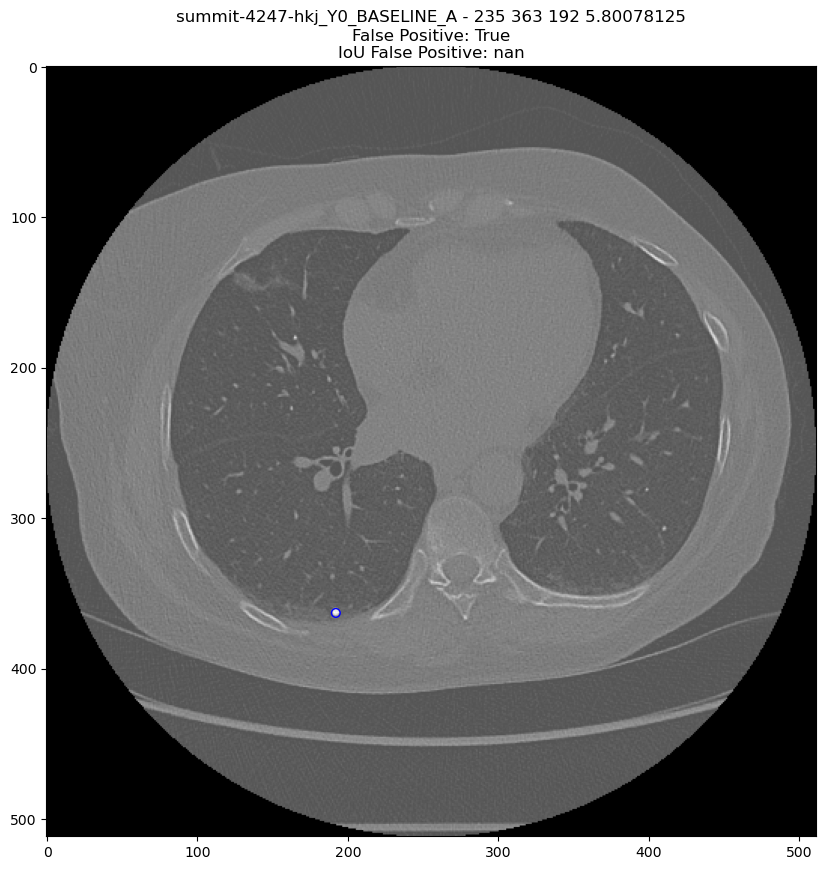

summit-5968-bsv_Y0_BASELINE_A already exists
summit-5968-bsv_Y0_BASELINE_A - 288 214 160 5.9765625
False Positive: True
IoU False Positive: 0.0


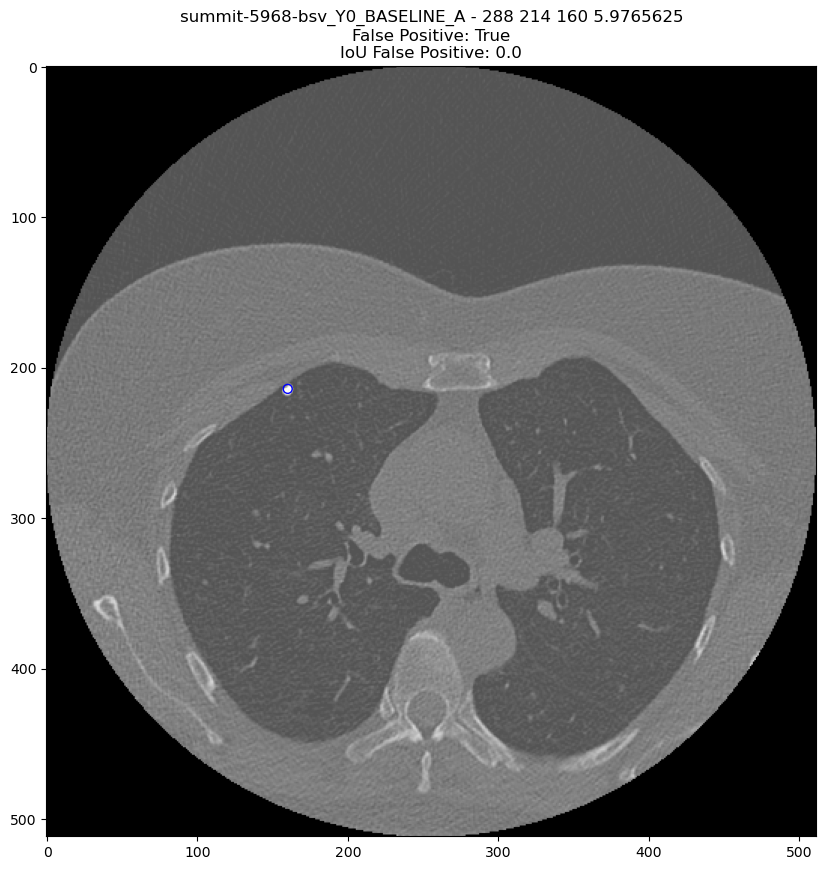

summit-9938-mxd_Y0_BASELINE_A already exists
summit-9938-mxd_Y0_BASELINE_A - 423 162 342 6.15234375
False Positive: True
IoU False Positive: nan


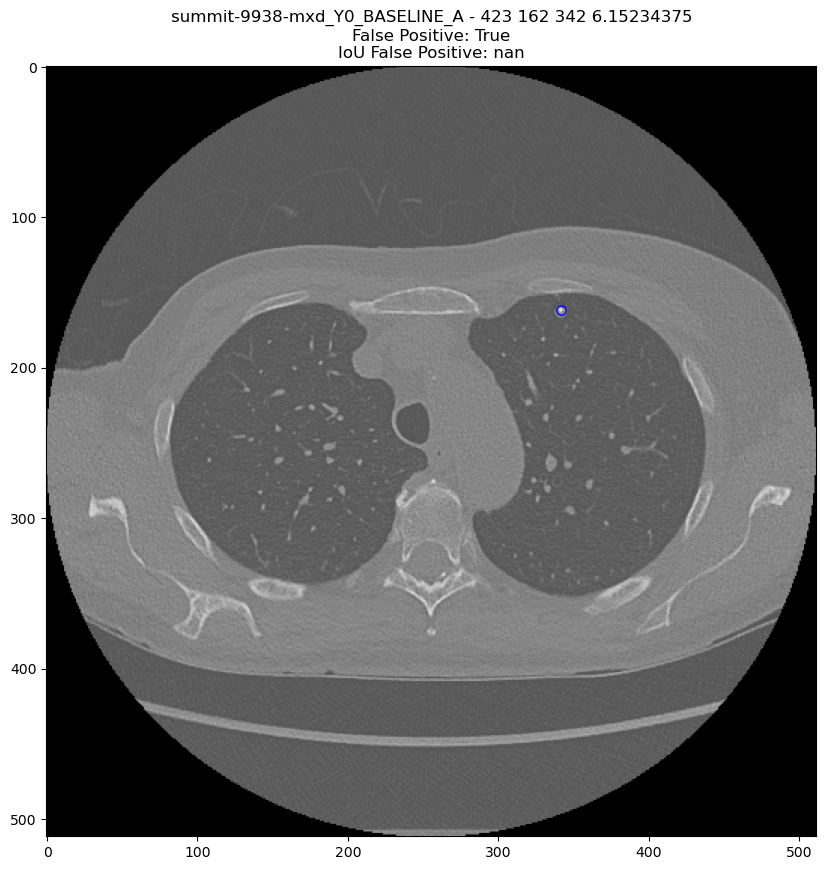

summit-5574-nhk_Y0_BASELINE_A already exists
summit-5574-nhk_Y0_BASELINE_A - 185 213 63 5.09765625
False Positive: True
IoU False Positive: 0.0


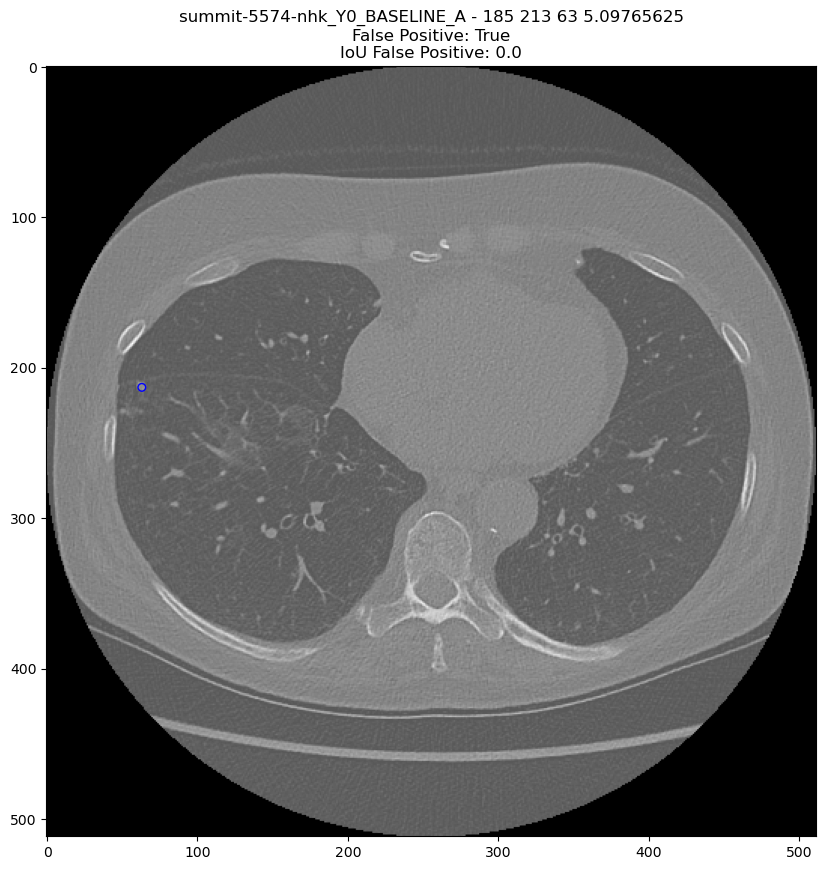

summit-8769-uas_Y0_BASELINE_A already exists
summit-8769-uas_Y0_BASELINE_A - 350 388 362 6.943359375
False Positive: True
IoU False Positive: nan


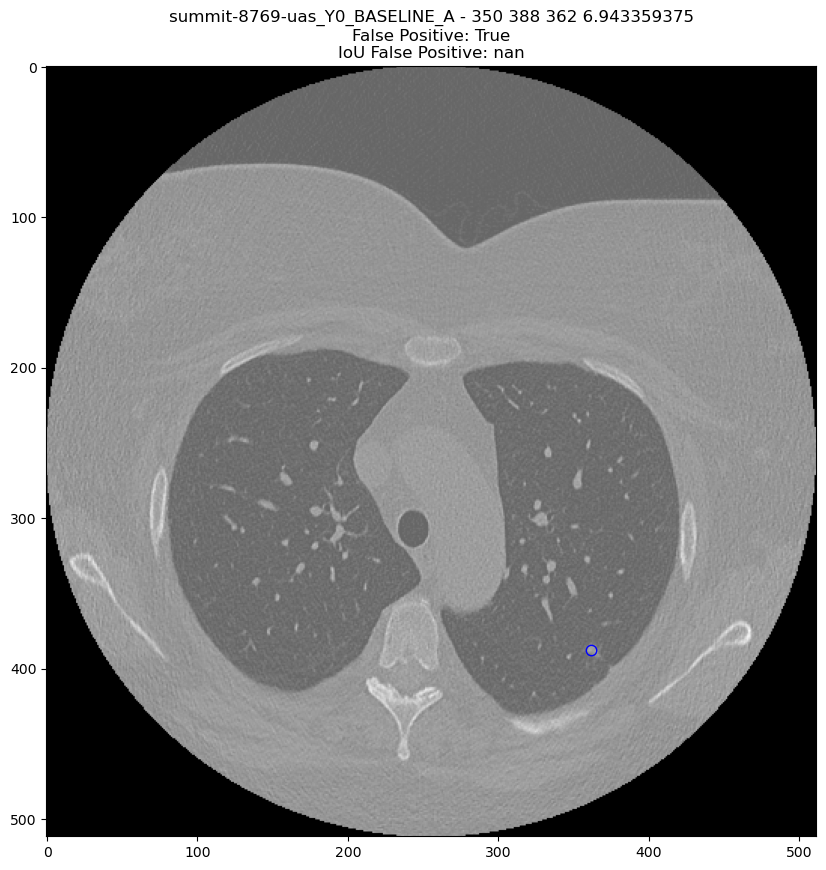

summit-6232-asp_Y0_BASELINE_A already exists
summit-6232-asp_Y0_BASELINE_A - 374 291 411 5.46875
False Positive: True
IoU False Positive: 0.0


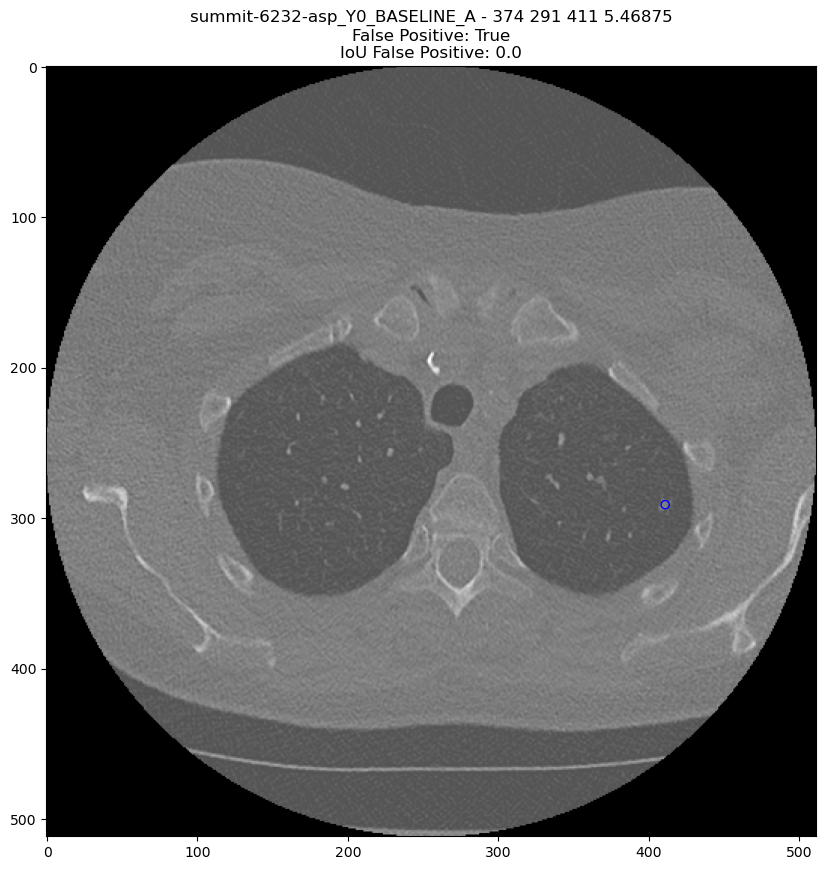

summit-7472-cwh_Y0_BASELINE_A already exists
summit-7472-cwh_Y0_BASELINE_A - 249 362 196 17.5
False Positive: True
IoU False Positive: 0.012539695120993562


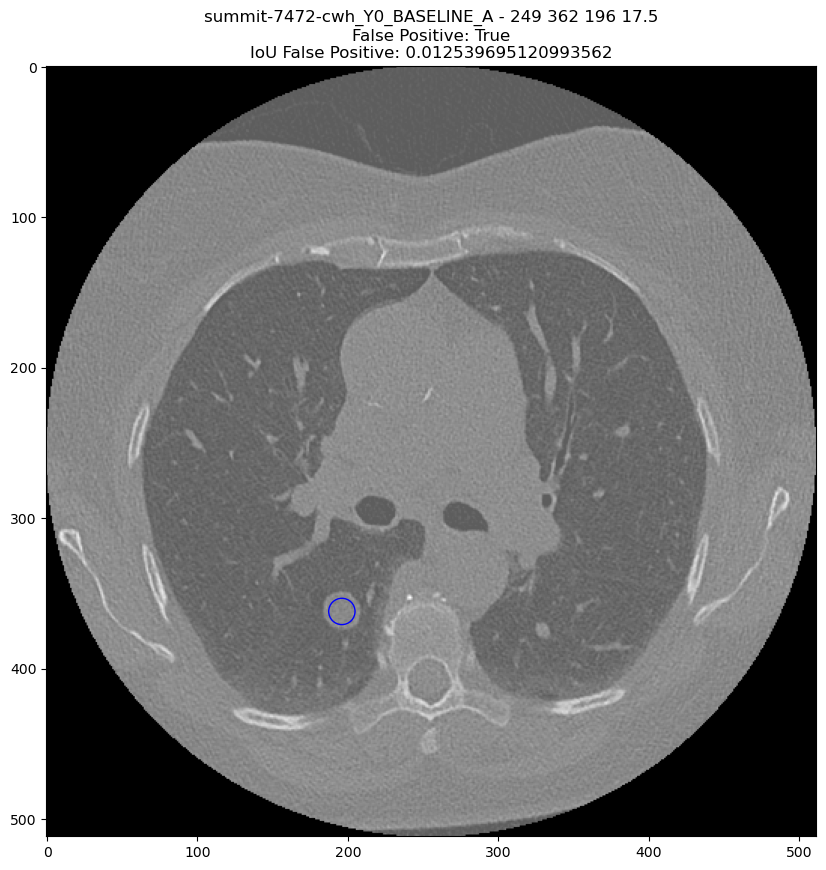

summit-4233-uaq_Y0_BASELINE_A already exists
summit-4233-uaq_Y0_BASELINE_A - 392 261 187 9.4921875
False Positive: True
IoU False Positive: nan


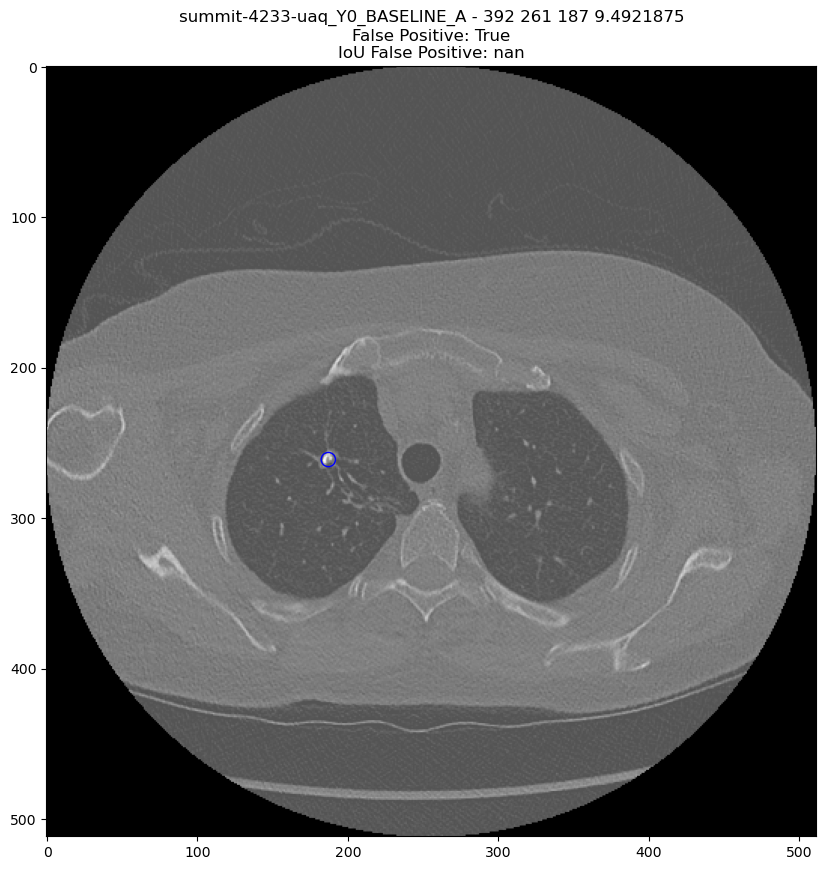

summit-3574-hbz_Y0_BASELINE_A already exists
summit-3574-hbz_Y0_BASELINE_A - 306 344 190 8.0859375
False Positive: True
IoU False Positive: nan


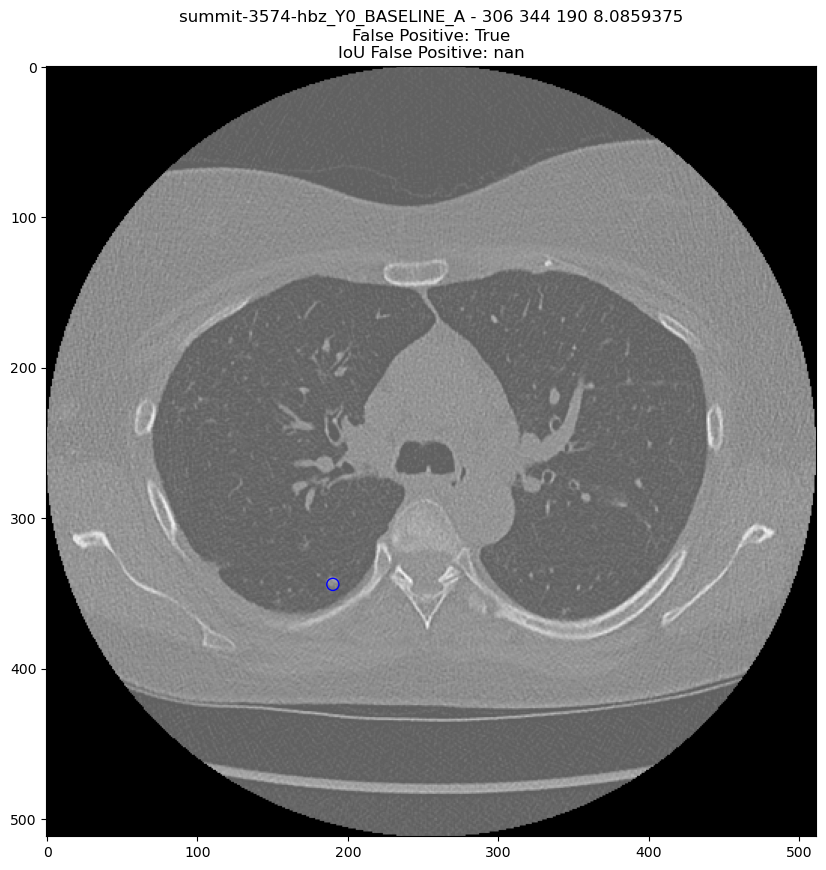

summit-6385-cyq_Y0_BASELINE_A already exists
summit-6385-cyq_Y0_BASELINE_A - 228 353 421 4.53125
False Positive: True
IoU False Positive: 0.0


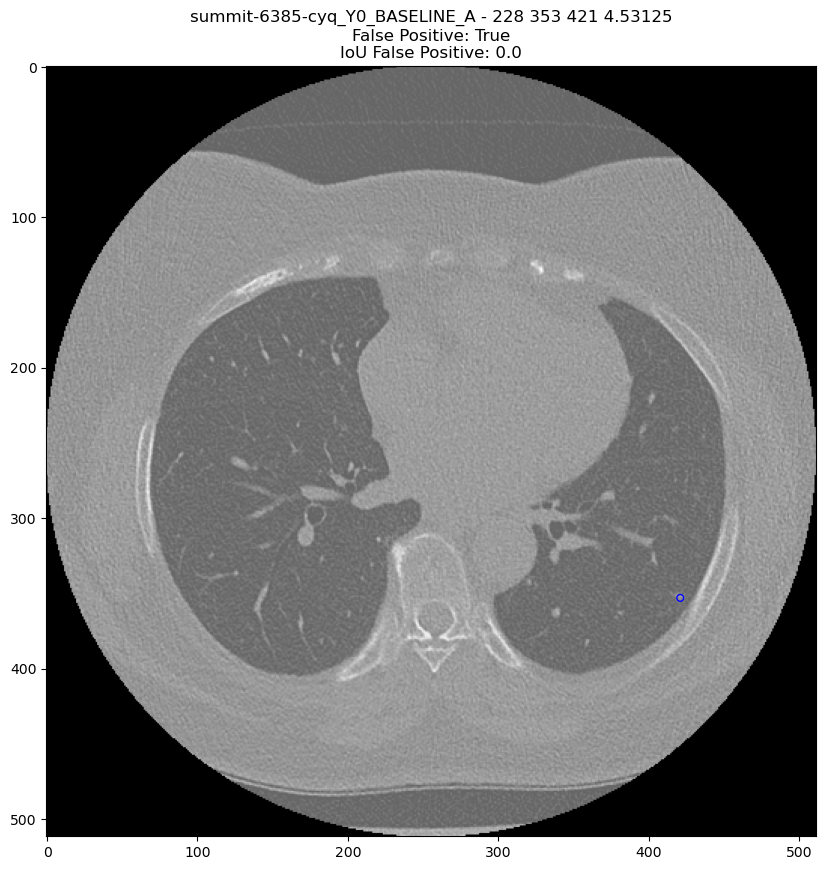

summit-7658-fzv_Y0_BASELINE_A already exists
summit-7658-fzv_Y0_BASELINE_A - 363 302 154 4.53125
False Positive: True
IoU False Positive: nan


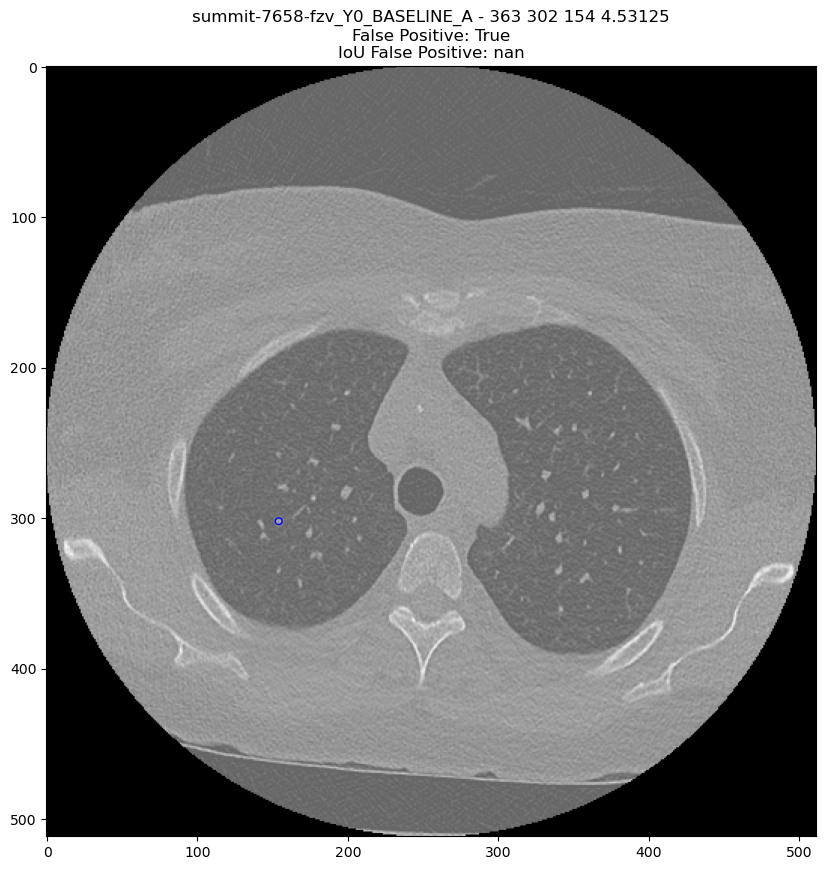

summit-4368-ndj_Y0_BASELINE_A already exists
summit-4368-ndj_Y0_BASELINE_A - 449 325 168 6.328125
False Positive: True
IoU False Positive: 0.0


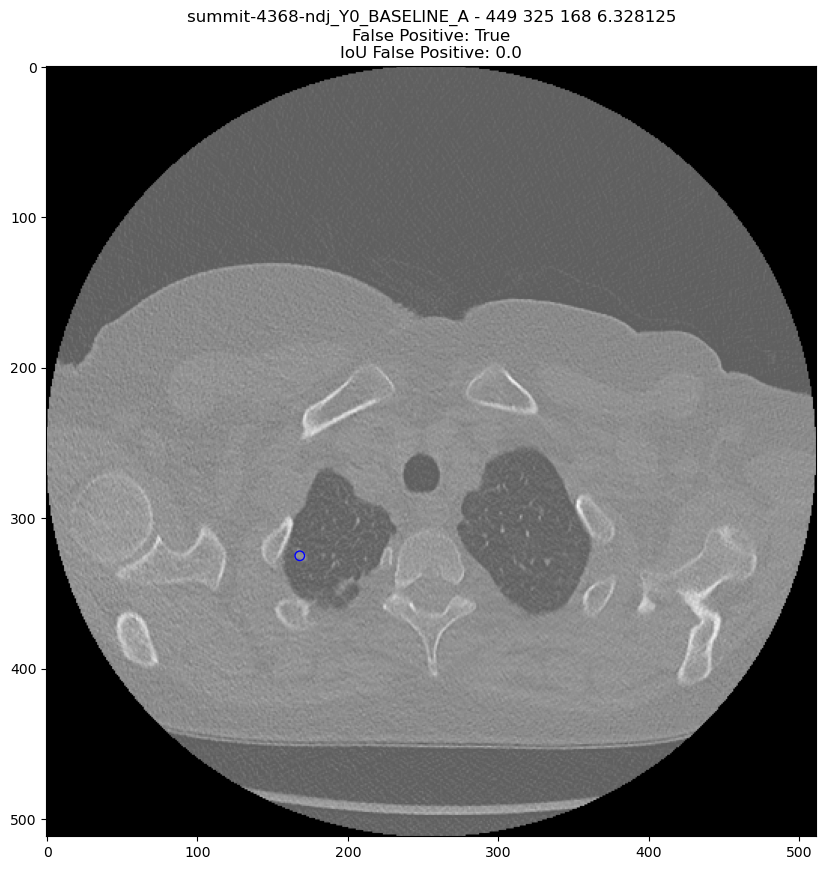

In [58]:
df = false_positives_fpps['0.125']

cnt = 0
for idx, row in df[df.distance_false_positive].sort_values(by='threshold', ascending=False).iterrows():
    scan_id = row['name']
    study_id = scan_id.split('_')[0]
    x = row['row']
    y = row['col']
    z = row['index']
    diameter = row['diameter']
    

    copy_scan_from_cluster(scan_id)
    
    scan = SummitScan.load_scan(f'{workspace_path}/data/summit/scans/{study_id}/{scan_id}.mhd')
    irc = xyz2irc([x, y, z], scan.origin, scan.voxel_size, scan.orientation)


    show_mhd_candidate_location(scan_id, scan.image, irc.row, irc.col, irc.index, diameter, row.distance_false_positive, row.iou_false_positive)
    cnt+=1
    if cnt == 12:
        break

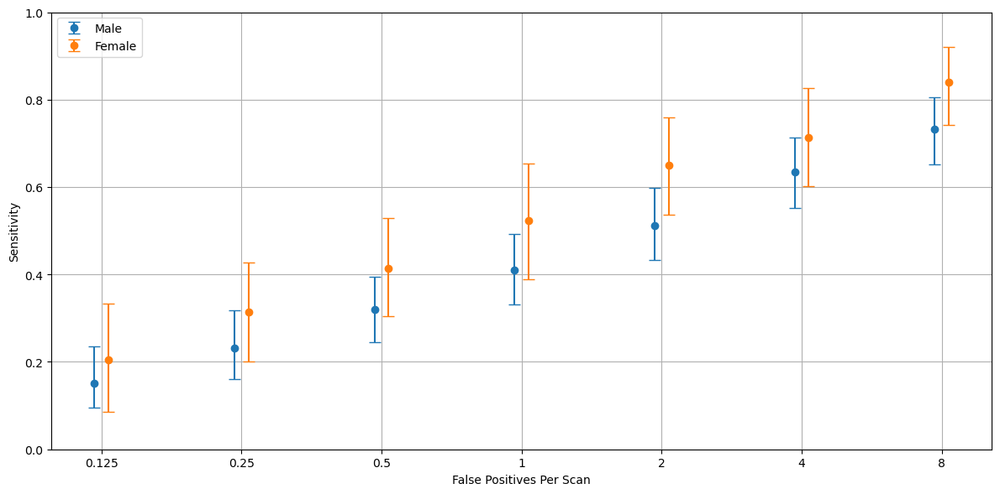

In [5]:
grt123_female_inference_string = """
idx	fps	mean_sens	low_sens	high_sens
0	0.125	0.204	0.085	0.333
159	0.250	0.314	0.200	0.427
476	0.500	0.414	0.305	0.529
1111	1.000	0.524	0.389	0.653
2381	2.000	0.650	0.537	0.759
4920	4.000	0.713	0.602	0.826
9999	8.000	0.839	0.742	0.921
"""

grt123_male_inference_string = """
idx	fps	mean_sens	low_sens	high_sens
0	0.125	0.151	0.095	0.235
159	0.250	0.231	0.161	0.317
476	0.500	0.319	0.246	0.395
1111	1.000	0.410	0.331	0.493
2381	2.000	0.511	0.433	0.598
4920	4.000	0.634	0.552	0.713
9999	8.000	0.732	0.652	0.805
"""

def cdf(string):
    lines = string.strip().split('\n')
    data = [line.split() for line in lines]
    return pd.DataFrame(data[1:], columns=data[0])


sensitivity_data = {}
sensitivity_data['Male'] = cdf(grt123_male_inference_string).astype(float).set_index('fps')
sensitivity_data['Female'] = cdf(grt123_female_inference_string).astype(float).set_index('fps')

display_plots_with_error_bars('grt123', flavour, 'Actionable, Gender', sensitivity_data)

                                    

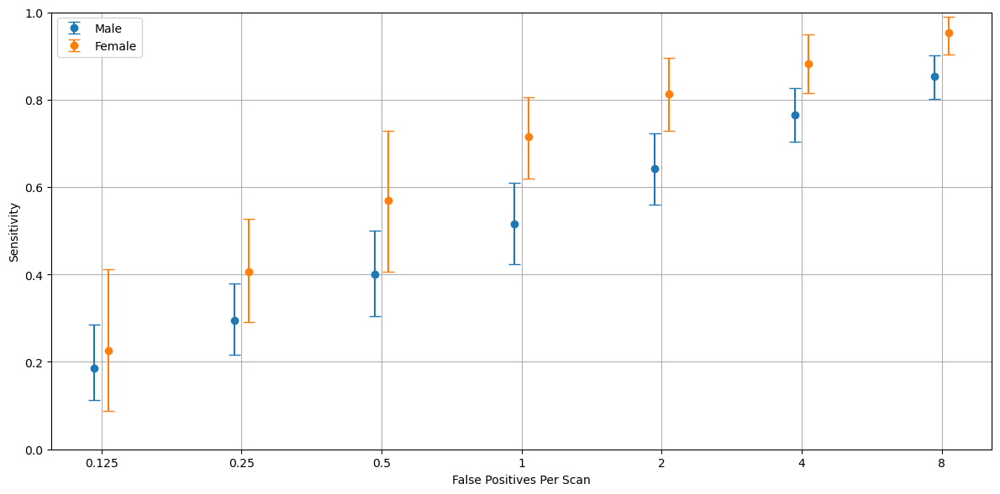

In [4]:
flavour = ''
detection_female_inference_string = """
idx	fps	mean_sens	low_sens	high_sens
0	0.125	0.226	0.088	0.412
159	0.250	0.407	0.291	0.527
476	0.500	0.570	0.407	0.728
1111	1.000	0.715	0.620	0.805
2381	2.000	0.813	0.729	0.896
4920	4.000	0.882	0.814	0.950
9999	8.000	0.953	0.904	0.990
"""

detection_male_inference_string = """
idx fps	mean_sens	low_sens	high_sens
0	0.125	0.186	0.113	0.285
159	0.250	0.294	0.216	0.380
476	0.500	0.400	0.305	0.501
1111	1.000	0.516	0.423	0.610
2381	2.000	0.642	0.559	0.722
4920	4.000	0.765	0.703	0.826
9999	8.000	0.853	0.801	0.902
"""

def cdf(string):
    lines = string.strip().split('\n')
    data = [line.split() for line in lines]
    return pd.DataFrame(data[1:], columns=data[0])


sensitivity_data = {}
sensitivity_data['Male'] = cdf(detection_male_inference_string).astype(float).set_index('fps')
sensitivity_data['Female'] = cdf(detection_female_inference_string).astype(float).set_index('fps')

display_plots_with_error_bars('detection', flavour, 'Actionable, Gender', sensitivity_data)